In [24]:
from sys import path as syspath
from os import path as ospath
syspath.append(ospath.join(ospath.expanduser("~"), '/data/hashemi/Freetime/Freetime-DQN/Deep-Freetime/SB3_f'))

In [25]:
import torch as torch
torch._C._cuda_getDeviceCount() > 0

True

In [26]:
import os
import gym 
import matplotlib.pyplot as plt
import numpy as np 
from SB3_f.sb3f import DQN
from SB3_f.sb3f.common.vec_env import DummyVecEnv
from SB3_f.sb3f.common.evaluation import evaluate_policy
from SB3_f.sb3f.common.callbacks import EvalCallback, StopTrainingOnRewardThreshold


In [27]:
rewards = [[1,0,5]]
from GridEnv import WindyGridworld
env = WindyGridworld(
        height=20,
        width=11,
        rewards=rewards,
        wind=True,
        allowed_actions=['L', 'R', 'C'],
        reward_terminates_episode=False
    )

In [28]:
episodes = 5
for episode in range(1, episodes+1):
    state = env.reset()
    done = False
    score = 0 
    
    while not done:
        env.render()
        action = env.action_space.sample()
        n_state, reward, done, info = env.step(action)
        score+=reward
    print('Episode:{} Score:{}'.format(episode, score))
env.close()

QObject::moveToThread: Current thread (0x565185fbf950) is not the object's thread (0x56518636c150).
Cannot move to target thread (0x565185fbf950)

QObject::moveToThread: Current thread (0x565185fbf950) is not the object's thread (0x56518636c150).
Cannot move to target thread (0x565185fbf950)

QObject::moveToThread: Current thread (0x565185fbf950) is not the object's thread (0x56518636c150).
Cannot move to target thread (0x565185fbf950)

QObject::moveToThread: Current thread (0x565185fbf950) is not the object's thread (0x56518636c150).
Cannot move to target thread (0x565185fbf950)

QObject::moveToThread: Current thread (0x565185fbf950) is not the object's thread (0x56518636c150).
Cannot move to target thread (0x565185fbf950)

QObject::moveToThread: Current thread (0x565185fbf950) is not the object's thread (0x56518636c150).
Cannot move to target thread (0x565185fbf950)

QObject::moveToThread: Current thread (0x565185fbf950) is not the object's thread (0x56518636c150).
Cannot move to tar

Episode:1 Score:0
Episode:2 Score:0
Episode:3 Score:0
Episode:4 Score:0
Episode:5 Score:0


In [29]:
save_path = os.path.join('Training', 'Saved Models')
log_path = os.path.join('Training', 'Logs Abs Weight', 'Env1')

In [30]:
stop_callback = StopTrainingOnRewardThreshold(reward_threshold=2, verbose=1)
eval_callback = EvalCallback(env, 
                             callback_on_new_best=stop_callback, 
                             eval_freq=10000, 
                             best_model_save_path=save_path, 
                             verbose=1)

In [31]:
# Using same prams that performed optimally in Baseline
model = DQN('CnnPolicy', env, exploration_fraction=0.8,
    exploration_final_eps=0.1,learning_starts=100000,
    verbose = 1, 
    buffer_size = 50000,
    target_update_interval=1000,
    tensorboard_log=log_path)

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


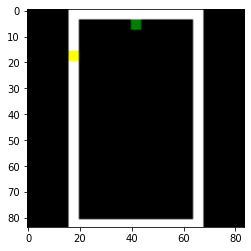

In [32]:
from SB3_f.sb3f.common.utils import obs_as_tensor
device = torch.device('cuda:0')

obs = env.canvas
plt.imshow(obs)


# Check the Network Q Value
observation = np.transpose(obs, (2, 0, 1))
observation = observation[np.newaxis, ...]
observation = obs_as_tensor(observation, device)
with torch.no_grad():
        q_values = model.q_net(observation)

In [33]:
q_values


tensor([[1.0037, 1.0064, 1.0044]], device='cuda:0')

In [34]:
model.learn(total_timesteps=1000000,callback=eval_callback, tb_log_name='Env1_0.8exp_1M')

Logging to Training/Logs Abs Weight/Env1/Env1_0.8exp_1M_1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 3063     |
|    time_elapsed     | 0        |
|    total_timesteps  | 73       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.125    |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 8        |
|    fps              | 3150     |
|    time_elapsed     | 0        |
|    total_timesteps  | 136      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 1       

/data/hashemi/Freetime/Freetime-DQN/Deep-Freetime/SB3_f/sb3f/common/callbacks.py:388: UserWarning: Training and eval env are not of the same type<sb3f.common.vec_env.vec_transpose.VecTransposeImage object at 0x7f25b00d5520> != <sb3f.common.vec_env.dummy_vec_env.DummyVecEnv object at 0x7f25b00d5bb0>
  warnings.warn("Training and eval env are not of the same type" f"{self.training_env} != {self.eval_env}")


----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.143    |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 28       |
|    fps              | 3234     |
|    time_elapsed     | 0        |
|    total_timesteps  | 491      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.125    |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 32       |
|    fps              | 3226     |
|    time_elapsed     | 0        |
|    total_timesteps  | 529      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.139    |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 116      |
|    fps              | 3243     |
|    time_elapsed     | 0        |
|    total_timesteps  | 1758     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 120      |
|    fps              | 3241     |
|    time_elapsed     | 0        |
|    total_timesteps  | 1800     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.997    |
| time/               |          |
|    episodes         | 204      |
|    fps              | 3235     |
|    time_elapsed     | 0        |
|    total_timesteps  | 2883     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.997    |
| time/               |          |
|    episodes         | 208      |
|    fps              | 3237     |
|    time_elapsed     | 0        |
|    total_timesteps  | 2944     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.997    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes         | 292      |
|    fps              | 3248     |
|    time_elapsed     | 1        |
|    total_timesteps  | 4257     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes         | 296      |
|    fps              | 3249     |
|    time_elapsed     | 1        |
|    total_timesteps  | 4324     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes         | 380      |
|    fps              | 3254     |
|    time_elapsed     | 1        |
|    total_timesteps  | 5552     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes         | 384      |
|    fps              | 3256     |
|    time_elapsed     | 1        |
|    total_timesteps  | 5632     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 468      |
|    fps              | 3247     |
|    time_elapsed     | 2        |
|    total_timesteps  | 6800     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 472      |
|    fps              | 3247     |
|    time_elapsed     | 2        |
|    total_timesteps  | 6840     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.991    |
| time/               |          |
|    episodes         | 556      |
|    fps              | 3247     |
|    time_elapsed     | 2        |
|    total_timesteps  | 8023     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.991    |
| time/               |          |
|    episodes         | 560      |
|    fps              | 3248     |
|    time_elapsed     | 2        |
|    total_timesteps  | 8101     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.991    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.99     |
| time/               |          |
|    episodes         | 644      |
|    fps              | 3257     |
|    time_elapsed     | 2        |
|    total_timesteps  | 9315     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.989    |
| time/               |          |
|    episodes         | 648      |
|    fps              | 3257     |
|    time_elapsed     | 2        |
|    total_timesteps  | 9359     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.989    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes         | 728      |
|    fps              | 3212     |
|    time_elapsed     | 3        |
|    total_timesteps  | 10636    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes         | 732      |
|    fps              | 3212     |
|    time_elapsed     | 3        |
|    total_timesteps  | 10679    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.987    |
| time/               |          |
|    episodes         | 816      |
|    fps              | 3225     |
|    time_elapsed     | 3        |
|    total_timesteps  | 11914    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.987    |
| time/               |          |
|    episodes         | 820      |
|    fps              | 3226     |
|    time_elapsed     | 3        |
|    total_timesteps  | 11982    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes         | 904      |
|    fps              | 3233     |
|    time_elapsed     | 4        |
|    total_timesteps  | 13168    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes         | 908      |
|    fps              | 3233     |
|    time_elapsed     | 4        |
|    total_timesteps  | 13226    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes         | 992      |
|    fps              | 3242     |
|    time_elapsed     | 4        |
|    total_timesteps  | 14482    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes         | 996      |
|    fps              | 3242     |
|    time_elapsed     | 4        |
|    total_timesteps  | 14541    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes         | 1080     |
|    fps              | 3248     |
|    time_elapsed     | 4        |
|    total_timesteps  | 15730    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes         | 1084     |
|    fps              | 3248     |
|    time_elapsed     | 4        |
|    total_timesteps  | 15810    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes         | 1168     |
|    fps              | 3252     |
|    time_elapsed     | 5        |
|    total_timesteps  | 17025    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes         | 1172     |
|    fps              | 3251     |
|    time_elapsed     | 5        |
|    total_timesteps  | 17103    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes         | 1256     |
|    fps              | 3256     |
|    time_elapsed     | 5        |
|    total_timesteps  | 18297    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes         | 1260     |
|    fps              | 3257     |
|    time_elapsed     | 5        |
|    total_timesteps  | 18377    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes         | 1344     |
|    fps              | 3261     |
|    time_elapsed     | 6        |
|    total_timesteps  | 19589    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes         | 1348     |
|    fps              | 3262     |
|    time_elapsed     | 6        |
|    total_timesteps  | 19658    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.977    |
| time/               |          |
|    episodes         | 1428     |
|    fps              | 3251     |
|    time_elapsed     | 6        |
|    total_timesteps  | 20753    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.977    |
| time/               |          |
|    episodes         | 1432     |
|    fps              | 3252     |
|    time_elapsed     | 6        |
|    total_timesteps  | 20815    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.977    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes         | 1516     |
|    fps              | 3256     |
|    time_elapsed     | 6        |
|    total_timesteps  | 22019    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes         | 1520     |
|    fps              | 3256     |
|    time_elapsed     | 6        |
|    total_timesteps  | 22058    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.974    |
| time/               |          |
|    episodes         | 1604     |
|    fps              | 3261     |
|    time_elapsed     | 7        |
|    total_timesteps  | 23335    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.974    |
| time/               |          |
|    episodes         | 1608     |
|    fps              | 3261     |
|    time_elapsed     | 7        |
|    total_timesteps  | 23374    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.974    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes         | 1692     |
|    fps              | 3263     |
|    time_elapsed     | 7        |
|    total_timesteps  | 24699    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes         | 1696     |
|    fps              | 3263     |
|    time_elapsed     | 7        |
|    total_timesteps  | 24778    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.971    |
| time/               |          |
|    episodes         | 1780     |
|    fps              | 3262     |
|    time_elapsed     | 7        |
|    total_timesteps  | 25998    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.971    |
| time/               |          |
|    episodes         | 1784     |
|    fps              | 3262     |
|    time_elapsed     | 7        |
|    total_timesteps  | 26060    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.971    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes         | 1868     |
|    fps              | 3264     |
|    time_elapsed     | 8        |
|    total_timesteps  | 27251    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes         | 1872     |
|    fps              | 3264     |
|    time_elapsed     | 8        |
|    total_timesteps  | 27312    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes         | 1956     |
|    fps              | 3260     |
|    time_elapsed     | 8        |
|    total_timesteps  | 28520    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes         | 1960     |
|    fps              | 3261     |
|    time_elapsed     | 8        |
|    total_timesteps  | 28583    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.966    |
| time/               |          |
|    episodes         | 2044     |
|    fps              | 3262     |
|    time_elapsed     | 9        |
|    total_timesteps  | 29822    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.966    |
| time/               |          |
|    episodes         | 2048     |
|    fps              | 3262     |
|    time_elapsed     | 9        |
|    total_timesteps  | 29857    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.966    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes         | 2128     |
|    fps              | 3254     |
|    time_elapsed     | 9        |
|    total_timesteps  | 31117    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes         | 2132     |
|    fps              | 3254     |
|    time_elapsed     | 9        |
|    total_timesteps  | 31178    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes         | 2216     |
|    fps              | 3258     |
|    time_elapsed     | 9        |
|    total_timesteps  | 32534    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes         | 2220     |
|    fps              | 3258     |
|    time_elapsed     | 10       |
|    total_timesteps  | 32587    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes         | 2304     |
|    fps              | 3261     |
|    time_elapsed     | 10       |
|    total_timesteps  | 33883    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes         | 2308     |
|    fps              | 3261     |
|    time_elapsed     | 10       |
|    total_timesteps  | 33931    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.96     |
| time/               |          |
|    episodes         | 2392     |
|    fps              | 3264     |
|    time_elapsed     | 10       |
|    total_timesteps  | 35249    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.96     |
| time/               |          |
|    episodes         | 2396     |
|    fps              | 3264     |
|    time_elapsed     | 10       |
|    total_timesteps  | 35319    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.96     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes         | 2480     |
|    fps              | 3266     |
|    time_elapsed     | 11       |
|    total_timesteps  | 36543    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes         | 2484     |
|    fps              | 3266     |
|    time_elapsed     | 11       |
|    total_timesteps  | 36612    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.957    |
| time/               |          |
|    episodes         | 2568     |
|    fps              | 3268     |
|    time_elapsed     | 11       |
|    total_timesteps  | 37807    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.957    |
| time/               |          |
|    episodes         | 2572     |
|    fps              | 3268     |
|    time_elapsed     | 11       |
|    total_timesteps  | 37887    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.957    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes         | 2656     |
|    fps              | 3269     |
|    time_elapsed     | 11       |
|    total_timesteps  | 39100    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes         | 2660     |
|    fps              | 3269     |
|    time_elapsed     | 11       |
|    total_timesteps  | 39174    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.955    |
| time/               |          |
|    episodes         | 2740     |
|    fps              | 3265     |
|    time_elapsed     | 12       |
|    total_timesteps  | 40392    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes         | 2744     |
|    fps              | 3265     |
|    time_elapsed     | 12       |
|    total_timesteps  | 40463    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.953    |
| time/               |          |
|    episodes         | 2828     |
|    fps              | 3267     |
|    time_elapsed     | 12       |
|    total_timesteps  | 41690    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.953    |
| time/               |          |
|    episodes         | 2832     |
|    fps              | 3267     |
|    time_elapsed     | 12       |
|    total_timesteps  | 41728    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.953    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes         | 2916     |
|    fps              | 3268     |
|    time_elapsed     | 13       |
|    total_timesteps  | 42862    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes         | 2920     |
|    fps              | 3268     |
|    time_elapsed     | 13       |
|    total_timesteps  | 42923    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.95     |
| time/               |          |
|    episodes         | 3004     |
|    fps              | 3270     |
|    time_elapsed     | 13       |
|    total_timesteps  | 44174    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.95     |
| time/               |          |
|    episodes         | 3008     |
|    fps              | 3269     |
|    time_elapsed     | 13       |
|    total_timesteps  | 44211    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.95     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes         | 3092     |
|    fps              | 3270     |
|    time_elapsed     | 13       |
|    total_timesteps  | 45273    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes         | 3096     |
|    fps              | 3270     |
|    time_elapsed     | 13       |
|    total_timesteps  | 45331    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes         | 3180     |
|    fps              | 3271     |
|    time_elapsed     | 14       |
|    total_timesteps  | 46487    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes         | 3184     |
|    fps              | 3271     |
|    time_elapsed     | 14       |
|    total_timesteps  | 46547    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes         | 3268     |
|    fps              | 3272     |
|    time_elapsed     | 14       |
|    total_timesteps  | 47760    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes         | 3272     |
|    fps              | 3272     |
|    time_elapsed     | 14       |
|    total_timesteps  | 47778    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes         | 3356     |
|    fps              | 3272     |
|    time_elapsed     | 14       |
|    total_timesteps  | 48931    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes         | 3360     |
|    fps              | 3272     |
|    time_elapsed     | 14       |
|    total_timesteps  | 48968    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.944    |
| time/               |          |
|    episodes         | 3440     |
|    fps              | 3268     |
|    time_elapsed     | 15       |
|    total_timesteps  | 50137    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.944    |
| time/               |          |
|    episodes         | 3444     |
|    fps              | 3268     |
|    time_elapsed     | 15       |
|    total_timesteps  | 50177    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.942    |
| time/               |          |
|    episodes         | 3528     |
|    fps              | 3272     |
|    time_elapsed     | 15       |
|    total_timesteps  | 51274    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.942    |
| time/               |          |
|    episodes         | 3532     |
|    fps              | 3272     |
|    time_elapsed     | 15       |
|    total_timesteps  | 51329    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.942    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.941    |
| time/               |          |
|    episodes         | 3616     |
|    fps              | 3276     |
|    time_elapsed     | 16       |
|    total_timesteps  | 52506    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.941    |
| time/               |          |
|    episodes         | 3620     |
|    fps              | 3276     |
|    time_elapsed     | 16       |
|    total_timesteps  | 52554    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.941    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.939    |
| time/               |          |
|    episodes         | 3704     |
|    fps              | 3281     |
|    time_elapsed     | 16       |
|    total_timesteps  | 53834    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.939    |
| time/               |          |
|    episodes         | 3708     |
|    fps              | 3281     |
|    time_elapsed     | 16       |
|    total_timesteps  | 53881    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.939    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.938    |
| time/               |          |
|    episodes         | 3792     |
|    fps              | 3285     |
|    time_elapsed     | 16       |
|    total_timesteps  | 55125    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.938    |
| time/               |          |
|    episodes         | 3796     |
|    fps              | 3285     |
|    time_elapsed     | 16       |
|    total_timesteps  | 55183    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.938    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.936    |
| time/               |          |
|    episodes         | 3880     |
|    fps              | 3289     |
|    time_elapsed     | 17       |
|    total_timesteps  | 56490    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.936    |
| time/               |          |
|    episodes         | 3884     |
|    fps              | 3290     |
|    time_elapsed     | 17       |
|    total_timesteps  | 56544    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.936    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.935    |
| time/               |          |
|    episodes         | 3968     |
|    fps              | 3293     |
|    time_elapsed     | 17       |
|    total_timesteps  | 57757    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.935    |
| time/               |          |
|    episodes         | 3972     |
|    fps              | 3293     |
|    time_elapsed     | 17       |
|    total_timesteps  | 57820    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.935    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes         | 4056     |
|    fps              | 3295     |
|    time_elapsed     | 17       |
|    total_timesteps  | 58975    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes         | 4060     |
|    fps              | 3295     |
|    time_elapsed     | 17       |
|    total_timesteps  | 59026    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.932    |
| time/               |          |
|    episodes         | 4140     |
|    fps              | 3292     |
|    time_elapsed     | 18       |
|    total_timesteps  | 60100    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.932    |
| time/               |          |
|    episodes         | 4144     |
|    fps              | 3292     |
|    time_elapsed     | 18       |
|    total_timesteps  | 60144    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.932    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.931    |
| time/               |          |
|    episodes         | 4228     |
|    fps              | 3295     |
|    time_elapsed     | 18       |
|    total_timesteps  | 61376    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.931    |
| time/               |          |
|    episodes         | 4232     |
|    fps              | 3295     |
|    time_elapsed     | 18       |
|    total_timesteps  | 61432    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.931    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes         | 4316     |
|    fps              | 3297     |
|    time_elapsed     | 18       |
|    total_timesteps  | 62647    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.929    |
| time/               |          |
|    episodes         | 4320     |
|    fps              | 3297     |
|    time_elapsed     | 19       |
|    total_timesteps  | 62693    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.929    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.928    |
| time/               |          |
|    episodes         | 4404     |
|    fps              | 3300     |
|    time_elapsed     | 19       |
|    total_timesteps  | 63982    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.928    |
| time/               |          |
|    episodes         | 4408     |
|    fps              | 3301     |
|    time_elapsed     | 19       |
|    total_timesteps  | 64062    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.928    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes         | 4492     |
|    fps              | 3303     |
|    time_elapsed     | 19       |
|    total_timesteps  | 65264    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes         | 4496     |
|    fps              | 3303     |
|    time_elapsed     | 19       |
|    total_timesteps  | 65329    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.926    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.925    |
| time/               |          |
|    episodes         | 4580     |
|    fps              | 3306     |
|    time_elapsed     | 20       |
|    total_timesteps  | 66623    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.925    |
| time/               |          |
|    episodes         | 4584     |
|    fps              | 3306     |
|    time_elapsed     | 20       |
|    total_timesteps  | 66689    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.925    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes         | 4668     |
|    fps              | 3309     |
|    time_elapsed     | 20       |
|    total_timesteps  | 67873    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes         | 4672     |
|    fps              | 3309     |
|    time_elapsed     | 20       |
|    total_timesteps  | 67934    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.922    |
| time/               |          |
|    episodes         | 4756     |
|    fps              | 3312     |
|    time_elapsed     | 20       |
|    total_timesteps  | 69281    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.922    |
| time/               |          |
|    episodes         | 4760     |
|    fps              | 3312     |
|    time_elapsed     | 20       |
|    total_timesteps  | 69352    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.922    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.921    |
| time/               |          |
|    episodes         | 4840     |
|    fps              | 3310     |
|    time_elapsed     | 21       |
|    total_timesteps  | 70496    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.921    |
| time/               |          |
|    episodes         | 4844     |
|    fps              | 3310     |
|    time_elapsed     | 21       |
|    total_timesteps  | 70570    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.921    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.919    |
| time/               |          |
|    episodes         | 4928     |
|    fps              | 3314     |
|    time_elapsed     | 21       |
|    total_timesteps  | 71930    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.919    |
| time/               |          |
|    episodes         | 4932     |
|    fps              | 3314     |
|    time_elapsed     | 21       |
|    total_timesteps  | 71990    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.919    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes         | 5016     |
|    fps              | 3314     |
|    time_elapsed     | 22       |
|    total_timesteps  | 73192    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes         | 5020     |
|    fps              | 3314     |
|    time_elapsed     | 22       |
|    total_timesteps  | 73254    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.916    |
| time/               |          |
|    episodes         | 5104     |
|    fps              | 3317     |
|    time_elapsed     | 22       |
|    total_timesteps  | 74478    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.916    |
| time/               |          |
|    episodes         | 5108     |
|    fps              | 3317     |
|    time_elapsed     | 22       |
|    total_timesteps  | 74558    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.916    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.915    |
| time/               |          |
|    episodes         | 5192     |
|    fps              | 3319     |
|    time_elapsed     | 22       |
|    total_timesteps  | 75783    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.915    |
| time/               |          |
|    episodes         | 5196     |
|    fps              | 3319     |
|    time_elapsed     | 22       |
|    total_timesteps  | 75861    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.915    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.913    |
| time/               |          |
|    episodes         | 5280     |
|    fps              | 3321     |
|    time_elapsed     | 23       |
|    total_timesteps  | 77101    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.913    |
| time/               |          |
|    episodes         | 5284     |
|    fps              | 3321     |
|    time_elapsed     | 23       |
|    total_timesteps  | 77167    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.913    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.912    |
| time/               |          |
|    episodes         | 5368     |
|    fps              | 3323     |
|    time_elapsed     | 23       |
|    total_timesteps  | 78425    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.912    |
| time/               |          |
|    episodes         | 5372     |
|    fps              | 3324     |
|    time_elapsed     | 23       |
|    total_timesteps  | 78504    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.912    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes         | 5456     |
|    fps              | 3325     |
|    time_elapsed     | 23       |
|    total_timesteps  | 79702    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes         | 5460     |
|    fps              | 3326     |
|    time_elapsed     | 23       |
|    total_timesteps  | 79757    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.909    |
| time/               |          |
|    episodes         | 5540     |
|    fps              | 3324     |
|    time_elapsed     | 24       |
|    total_timesteps  | 80987    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.909    |
| time/               |          |
|    episodes         | 5544     |
|    fps              | 3324     |
|    time_elapsed     | 24       |
|    total_timesteps  | 81066    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.909    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes         | 5628     |
|    fps              | 3326     |
|    time_elapsed     | 24       |
|    total_timesteps  | 82264    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes         | 5632     |
|    fps              | 3326     |
|    time_elapsed     | 24       |
|    total_timesteps  | 82293    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.906    |
| time/               |          |
|    episodes         | 5716     |
|    fps              | 3328     |
|    time_elapsed     | 25       |
|    total_timesteps  | 83516    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.906    |
| time/               |          |
|    episodes         | 5720     |
|    fps              | 3328     |
|    time_elapsed     | 25       |
|    total_timesteps  | 83577    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.906    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 5804     |
|    fps              | 3330     |
|    time_elapsed     | 25       |
|    total_timesteps  | 84839    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.904    |
| time/               |          |
|    episodes         | 5808     |
|    fps              | 3330     |
|    time_elapsed     | 25       |
|    total_timesteps  | 84891    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.904    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.903    |
| time/               |          |
|    episodes         | 5892     |
|    fps              | 3332     |
|    time_elapsed     | 25       |
|    total_timesteps  | 86133    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.903    |
| time/               |          |
|    episodes         | 5896     |
|    fps              | 3332     |
|    time_elapsed     | 25       |
|    total_timesteps  | 86191    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.903    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.902    |
| time/               |          |
|    episodes         | 5980     |
|    fps              | 3333     |
|    time_elapsed     | 26       |
|    total_timesteps  | 87385    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.902    |
| time/               |          |
|    episodes         | 5984     |
|    fps              | 3334     |
|    time_elapsed     | 26       |
|    total_timesteps  | 87448    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.902    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.9      |
| time/               |          |
|    episodes         | 6068     |
|    fps              | 3335     |
|    time_elapsed     | 26       |
|    total_timesteps  | 88640    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.9      |
| time/               |          |
|    episodes         | 6072     |
|    fps              | 3335     |
|    time_elapsed     | 26       |
|    total_timesteps  | 88702    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.9      |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes         | 6156     |
|    fps              | 3337     |
|    time_elapsed     | 26       |
|    total_timesteps  | 89844    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes         | 6160     |
|    fps              | 3337     |
|    time_elapsed     | 26       |
|    total_timesteps  | 89889    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.898    |
| time/               |          |
|    episodes         | 6240     |
|    fps              | 3335     |
|    time_elapsed     | 27       |
|    total_timesteps  | 91033    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.898    |
| time/               |          |
|    episodes         | 6244     |
|    fps              | 3335     |
|    time_elapsed     | 27       |
|    total_timesteps  | 91082    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.896    |
| time/               |          |
|    episodes         | 6328     |
|    fps              | 3337     |
|    time_elapsed     | 27       |
|    total_timesteps  | 92337    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.896    |
| time/               |          |
|    episodes         | 6332     |
|    fps              | 3337     |
|    time_elapsed     | 27       |
|    total_timesteps  | 92398    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.896    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.895    |
| time/               |          |
|    episodes         | 6416     |
|    fps              | 3339     |
|    time_elapsed     | 28       |
|    total_timesteps  | 93717    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.895    |
| time/               |          |
|    episodes         | 6420     |
|    fps              | 3339     |
|    time_elapsed     | 28       |
|    total_timesteps  | 93737    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.894    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes         | 6504     |
|    fps              | 3340     |
|    time_elapsed     | 28       |
|    total_timesteps  | 94925    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes         | 6508     |
|    fps              | 3340     |
|    time_elapsed     | 28       |
|    total_timesteps  | 94967    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.892    |
| time/               |          |
|    episodes         | 6592     |
|    fps              | 3342     |
|    time_elapsed     | 28       |
|    total_timesteps  | 96228    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.892    |
| time/               |          |
|    episodes         | 6596     |
|    fps              | 3342     |
|    time_elapsed     | 28       |
|    total_timesteps  | 96306    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.892    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.89     |
| time/               |          |
|    episodes         | 6680     |
|    fps              | 3343     |
|    time_elapsed     | 29       |
|    total_timesteps  | 97481    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.89     |
| time/               |          |
|    episodes         | 6684     |
|    fps              | 3343     |
|    time_elapsed     | 29       |
|    total_timesteps  | 97540    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.89     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.889    |
| time/               |          |
|    episodes         | 6768     |
|    fps              | 3345     |
|    time_elapsed     | 29       |
|    total_timesteps  | 98777    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.889    |
| time/               |          |
|    episodes         | 6772     |
|    fps              | 3345     |
|    time_elapsed     | 29       |
|    total_timesteps  | 98839    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.889    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.888    |
| time/               |          |
|    episodes         | 6856     |
|    fps              | 3346     |
|    time_elapsed     | 29       |
|    total_timesteps  | 99991    |
----------------------------------
Eval num_timesteps=100000, episode_reward=0.00 +/- 0.00
Episode length: 7.60 +/- 2.06
----------------------------------
| eval/               |          |
|    mean_ep_length   | 7.6      |
|    mean_reward      | 0        |
| rollout/            |          |
|    exploration_rate | 0.888    |
| time/               |          |
|    total_timesteps  | 100000   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.887    |
| time/               |          |
|   

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.886    |
| time/               |          |
|    episodes         | 6920     |
|    fps              | 3254     |
|    time_elapsed     | 31       |
|    total_timesteps  | 100956   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates        | 238      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.886    |
| time/               |          |
|    episodes         | 6924     |
|    fps              | 3249     |
|    time_elapsed     | 31       |
|    total_timesteps  | 101010   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0141   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.885    |
| time/               |          |
|    episodes         | 6984     |
|    fps              | 3171     |
|    time_elapsed     | 32       |
|    total_timesteps  | 101915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0266   |
|    n_updates        | 478      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.885    |
| time/               |          |
|    episodes         | 6988     |
|    fps              | 3165     |
|    time_elapsed     | 32       |
|    total_timesteps  | 101995   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00186  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.884    |
| time/               |          |
|    episodes         | 7048     |
|    fps              | 3092     |
|    time_elapsed     | 33       |
|    total_timesteps  | 102912   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0354   |
|    n_updates        | 727      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.884    |
| time/               |          |
|    episodes         | 7052     |
|    fps              | 3087     |
|    time_elapsed     | 33       |
|    total_timesteps  | 102969   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.014    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.883    |
| time/               |          |
|    episodes         | 7112     |
|    fps              | 3020     |
|    time_elapsed     | 34       |
|    total_timesteps  | 103861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0138   |
|    n_updates        | 965      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.883    |
| time/               |          |
|    episodes         | 7116     |
|    fps              | 3016     |
|    time_elapsed     | 34       |
|    total_timesteps  | 103916   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0115   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.882    |
| time/               |          |
|    episodes         | 7176     |
|    fps              | 2955     |
|    time_elapsed     | 35       |
|    total_timesteps  | 104775   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0211   |
|    n_updates        | 1193     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.882    |
| time/               |          |
|    episodes         | 7180     |
|    fps              | 2950     |
|    time_elapsed     | 35       |
|    total_timesteps  | 104837   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.03     |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes         | 7240     |
|    fps              | 2885     |
|    time_elapsed     | 36       |
|    total_timesteps  | 105823   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0185   |
|    n_updates        | 1455     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes         | 7244     |
|    fps              | 2880     |
|    time_elapsed     | 36       |
|    total_timesteps  | 105902   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.01     |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.88     |
| time/               |          |
|    episodes         | 7304     |
|    fps              | 2823     |
|    time_elapsed     | 37       |
|    total_timesteps  | 106802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0174   |
|    n_updates        | 1700     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.88     |
| time/               |          |
|    episodes         | 7308     |
|    fps              | 2822     |
|    time_elapsed     | 37       |
|    total_timesteps  | 106830   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0174   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.879    |
| time/               |          |
|    episodes         | 7368     |
|    fps              | 2767     |
|    time_elapsed     | 38       |
|    total_timesteps  | 107760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0012   |
|    n_updates        | 1939     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.879    |
| time/               |          |
|    episodes         | 7372     |
|    fps              | 2764     |
|    time_elapsed     | 38       |
|    total_timesteps  | 107812   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0246   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.878    |
| time/               |          |
|    episodes         | 7432     |
|    fps              | 2712     |
|    time_elapsed     | 40       |
|    total_timesteps  | 108715   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0235   |
|    n_updates        | 2178     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.878    |
| time/               |          |
|    episodes         | 7436     |
|    fps              | 2709     |
|    time_elapsed     | 40       |
|    total_timesteps  | 108758   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0178   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.877    |
| time/               |          |
|    episodes         | 7496     |
|    fps              | 2656     |
|    time_elapsed     | 41       |
|    total_timesteps  | 109694   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000352 |
|    n_updates        | 2423     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.877    |
| time/               |          |
|    episodes         | 7500     |
|    fps              | 2653     |
|    time_elapsed     | 41       |
|    total_timesteps  | 109740   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00755  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.876    |
| time/               |          |
|    episodes         | 7556     |
|    fps              | 2604     |
|    time_elapsed     | 42       |
|    total_timesteps  | 110595   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00789  |
|    n_updates        | 2648     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.875    |
| time/               |          |
|    episodes         | 7560     |
|    fps              | 2600     |
|    time_elapsed     | 42       |
|    total_timesteps  | 110667   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0131   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.874    |
| time/               |          |
|    episodes         | 7620     |
|    fps              | 2556     |
|    time_elapsed     | 43       |
|    total_timesteps  | 111596   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0129   |
|    n_updates        | 2898     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.874    |
| time/               |          |
|    episodes         | 7624     |
|    fps              | 2553     |
|    time_elapsed     | 43       |
|    total_timesteps  | 111665   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0019   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.873    |
| time/               |          |
|    episodes         | 7684     |
|    fps              | 2517     |
|    time_elapsed     | 44       |
|    total_timesteps  | 112490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0126   |
|    n_updates        | 3122     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.873    |
| time/               |          |
|    episodes         | 7688     |
|    fps              | 2515     |
|    time_elapsed     | 44       |
|    total_timesteps  | 112543   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0195   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.872    |
| time/               |          |
|    episodes         | 7748     |
|    fps              | 2476     |
|    time_elapsed     | 45       |
|    total_timesteps  | 113471   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000389 |
|    n_updates        | 3367     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.872    |
| time/               |          |
|    episodes         | 7752     |
|    fps              | 2473     |
|    time_elapsed     | 45       |
|    total_timesteps  | 113533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0165   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.871    |
| time/               |          |
|    episodes         | 7812     |
|    fps              | 2440     |
|    time_elapsed     | 46       |
|    total_timesteps  | 114360   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0133   |
|    n_updates        | 3589     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.871    |
| time/               |          |
|    episodes         | 7816     |
|    fps              | 2438     |
|    time_elapsed     | 46       |
|    total_timesteps  | 114420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0101   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.87     |
| time/               |          |
|    episodes         | 7876     |
|    fps              | 2400     |
|    time_elapsed     | 48       |
|    total_timesteps  | 115357   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0126   |
|    n_updates        | 3839     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.87     |
| time/               |          |
|    episodes         | 7880     |
|    fps              | 2398     |
|    time_elapsed     | 48       |
|    total_timesteps  | 115400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0128   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.869    |
| time/               |          |
|    episodes         | 7940     |
|    fps              | 2361     |
|    time_elapsed     | 49       |
|    total_timesteps  | 116320   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00118  |
|    n_updates        | 4079     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.869    |
| time/               |          |
|    episodes         | 7944     |
|    fps              | 2358     |
|    time_elapsed     | 49       |
|    total_timesteps  | 116400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00109  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.868    |
| time/               |          |
|    episodes         | 8004     |
|    fps              | 2323     |
|    time_elapsed     | 50       |
|    total_timesteps  | 117273   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00402  |
|    n_updates        | 4318     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.868    |
| time/               |          |
|    episodes         | 8008     |
|    fps              | 2321     |
|    time_elapsed     | 50       |
|    total_timesteps  | 117336   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0135   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.867    |
| time/               |          |
|    episodes         | 8068     |
|    fps              | 2291     |
|    time_elapsed     | 51       |
|    total_timesteps  | 118199   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0117   |
|    n_updates        | 4549     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.867    |
| time/               |          |
|    episodes         | 8072     |
|    fps              | 2290     |
|    time_elapsed     | 51       |
|    total_timesteps  | 118251   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00374  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.866    |
| time/               |          |
|    episodes         | 8132     |
|    fps              | 2261     |
|    time_elapsed     | 52       |
|    total_timesteps  | 119124   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00537  |
|    n_updates        | 4780     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.866    |
| time/               |          |
|    episodes         | 8136     |
|    fps              | 2258     |
|    time_elapsed     | 52       |
|    total_timesteps  | 119204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000252 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.865    |
| time/               |          |
|    episodes         | 8192     |
|    fps              | 2229     |
|    time_elapsed     | 53       |
|    total_timesteps  | 120084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0111   |
|    n_updates        | 5020     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.865    |
| time/               |          |
|    episodes         | 8196     |
|    fps              | 2226     |
|    time_elapsed     | 53       |
|    total_timesteps  | 120163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00474  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.864    |
| time/               |          |
|    episodes         | 8256     |
|    fps              | 2198     |
|    time_elapsed     | 55       |
|    total_timesteps  | 121107   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.65e-05 |
|    n_updates        | 5276     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.864    |
| time/               |          |
|    episodes         | 8260     |
|    fps              | 2195     |
|    time_elapsed     | 55       |
|    total_timesteps  | 121186   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00247  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes         | 8320     |
|    fps              | 2170     |
|    time_elapsed     | 56       |
|    total_timesteps  | 122071   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00311  |
|    n_updates        | 5517     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes         | 8324     |
|    fps              | 2168     |
|    time_elapsed     | 56       |
|    total_timesteps  | 122141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00938  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.861    |
| time/               |          |
|    episodes         | 8384     |
|    fps              | 2142     |
|    time_elapsed     | 57       |
|    total_timesteps  | 123114   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00219  |
|    n_updates        | 5778     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.861    |
| time/               |          |
|    episodes         | 8388     |
|    fps              | 2141     |
|    time_elapsed     | 57       |
|    total_timesteps  | 123168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00232  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.86     |
| time/               |          |
|    episodes         | 8448     |
|    fps              | 2116     |
|    time_elapsed     | 58       |
|    total_timesteps  | 124092   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00696  |
|    n_updates        | 6022     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.86     |
| time/               |          |
|    episodes         | 8452     |
|    fps              | 2114     |
|    time_elapsed     | 58       |
|    total_timesteps  | 124159   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00377  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.859    |
| time/               |          |
|    episodes         | 8512     |
|    fps              | 2091     |
|    time_elapsed     | 59       |
|    total_timesteps  | 125092   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0039   |
|    n_updates        | 6272     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.859    |
| time/               |          |
|    episodes         | 8516     |
|    fps              | 2090     |
|    time_elapsed     | 59       |
|    total_timesteps  | 125130   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00903  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.858    |
| time/               |          |
|    episodes         | 8576     |
|    fps              | 2070     |
|    time_elapsed     | 60       |
|    total_timesteps  | 125974   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00559  |
|    n_updates        | 6493     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.858    |
| time/               |          |
|    episodes         | 8580     |
|    fps              | 2068     |
|    time_elapsed     | 60       |
|    total_timesteps  | 126037   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00457  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes         | 8640     |
|    fps              | 2046     |
|    time_elapsed     | 62       |
|    total_timesteps  | 126927   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0106   |
|    n_updates        | 6731     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes         | 8644     |
|    fps              | 2045     |
|    time_elapsed     | 62       |
|    total_timesteps  | 126989   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00312  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.856    |
| time/               |          |
|    episodes         | 8704     |
|    fps              | 2024     |
|    time_elapsed     | 63       |
|    total_timesteps  | 127885   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0108   |
|    n_updates        | 6971     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.856    |
| time/               |          |
|    episodes         | 8708     |
|    fps              | 2023     |
|    time_elapsed     | 63       |
|    total_timesteps  | 127951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0103   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.855    |
| time/               |          |
|    episodes         | 8768     |
|    fps              | 2004     |
|    time_elapsed     | 64       |
|    total_timesteps  | 128814   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00975  |
|    n_updates        | 7203     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.855    |
| time/               |          |
|    episodes         | 8772     |
|    fps              | 2003     |
|    time_elapsed     | 64       |
|    total_timesteps  | 128860   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00384  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.854    |
| time/               |          |
|    episodes         | 8832     |
|    fps              | 1985     |
|    time_elapsed     | 65       |
|    total_timesteps  | 129720   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000133 |
|    n_updates        | 7429     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.854    |
| time/               |          |
|    episodes         | 8836     |
|    fps              | 1984     |
|    time_elapsed     | 65       |
|    total_timesteps  | 129784   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0053   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.853    |
| time/               |          |
|    episodes         | 8892     |
|    fps              | 1967     |
|    time_elapsed     | 66       |
|    total_timesteps  | 130561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00157  |
|    n_updates        | 7640     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.853    |
| time/               |          |
|    episodes         | 8896     |
|    fps              | 1966     |
|    time_elapsed     | 66       |
|    total_timesteps  | 130621   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00389  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.852    |
| time/               |          |
|    episodes         | 8956     |
|    fps              | 1946     |
|    time_elapsed     | 67       |
|    total_timesteps  | 131631   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0102   |
|    n_updates        | 7907     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.852    |
| time/               |          |
|    episodes         | 8960     |
|    fps              | 1945     |
|    time_elapsed     | 67       |
|    total_timesteps  | 131710   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes         | 9020     |
|    fps              | 1928     |
|    time_elapsed     | 68       |
|    total_timesteps  | 132580   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00115  |
|    n_updates        | 8144     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes         | 9024     |
|    fps              | 1927     |
|    time_elapsed     | 68       |
|    total_timesteps  | 132641   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00117  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.85     |
| time/               |          |
|    episodes         | 9084     |
|    fps              | 1911     |
|    time_elapsed     | 69       |
|    total_timesteps  | 133492   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00115  |
|    n_updates        | 8372     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.85     |
| time/               |          |
|    episodes         | 9088     |
|    fps              | 1910     |
|    time_elapsed     | 69       |
|    total_timesteps  | 133553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00206  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.849    |
| time/               |          |
|    episodes         | 9148     |
|    fps              | 1894     |
|    time_elapsed     | 70       |
|    total_timesteps  | 134380   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00336  |
|    n_updates        | 8594     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.849    |
| time/               |          |
|    episodes         | 9152     |
|    fps              | 1893     |
|    time_elapsed     | 71       |
|    total_timesteps  | 134439   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00125  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.848    |
| time/               |          |
|    episodes         | 9212     |
|    fps              | 1877     |
|    time_elapsed     | 72       |
|    total_timesteps  | 135335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00192  |
|    n_updates        | 8833     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.848    |
| time/               |          |
|    episodes         | 9216     |
|    fps              | 1876     |
|    time_elapsed     | 72       |
|    total_timesteps  | 135393   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000924 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.847    |
| time/               |          |
|    episodes         | 9276     |
|    fps              | 1859     |
|    time_elapsed     | 73       |
|    total_timesteps  | 136314   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0029   |
|    n_updates        | 9078     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.847    |
| time/               |          |
|    episodes         | 9280     |
|    fps              | 1859     |
|    time_elapsed     | 73       |
|    total_timesteps  | 136344   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0132   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes         | 9340     |
|    fps              | 1842     |
|    time_elapsed     | 74       |
|    total_timesteps  | 137370   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00177  |
|    n_updates        | 9342     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes         | 9344     |
|    fps              | 1841     |
|    time_elapsed     | 74       |
|    total_timesteps  | 137450   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00423  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.844    |
| time/               |          |
|    episodes         | 9404     |
|    fps              | 1828     |
|    time_elapsed     | 75       |
|    total_timesteps  | 138241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000788 |
|    n_updates        | 9560     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.844    |
| time/               |          |
|    episodes         | 9408     |
|    fps              | 1827     |
|    time_elapsed     | 75       |
|    total_timesteps  | 138321   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00151  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.843    |
| time/               |          |
|    episodes         | 9468     |
|    fps              | 1812     |
|    time_elapsed     | 76       |
|    total_timesteps  | 139262   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00163  |
|    n_updates        | 9815     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.843    |
| time/               |          |
|    episodes         | 9472     |
|    fps              | 1812     |
|    time_elapsed     | 76       |
|    total_timesteps  | 139303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000176 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.842    |
| time/               |          |
|    episodes         | 9528     |
|    fps              | 1798     |
|    time_elapsed     | 77       |
|    total_timesteps  | 140199   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000789 |
|    n_updates        | 10049    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.842    |
| time/               |          |
|    episodes         | 9532     |
|    fps              | 1798     |
|    time_elapsed     | 77       |
|    total_timesteps  | 140222   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00165  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.841    |
| time/               |          |
|    episodes         | 9592     |
|    fps              | 1785     |
|    time_elapsed     | 79       |
|    total_timesteps  | 141097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0015   |
|    n_updates        | 10274    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.841    |
| time/               |          |
|    episodes         | 9596     |
|    fps              | 1784     |
|    time_elapsed     | 79       |
|    total_timesteps  | 141177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000839 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.84     |
| time/               |          |
|    episodes         | 9656     |
|    fps              | 1772     |
|    time_elapsed     | 80       |
|    total_timesteps  | 142022   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0083   |
|    n_updates        | 10505    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.84     |
| time/               |          |
|    episodes         | 9660     |
|    fps              | 1771     |
|    time_elapsed     | 80       |
|    total_timesteps  | 142096   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000506 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.839    |
| time/               |          |
|    episodes         | 9720     |
|    fps              | 1760     |
|    time_elapsed     | 81       |
|    total_timesteps  | 142919   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0107   |
|    n_updates        | 10729    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.839    |
| time/               |          |
|    episodes         | 9724     |
|    fps              | 1759     |
|    time_elapsed     | 81       |
|    total_timesteps  | 142987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000379 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.838    |
| time/               |          |
|    episodes         | 9784     |
|    fps              | 1748     |
|    time_elapsed     | 82       |
|    total_timesteps  | 143783   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000257 |
|    n_updates        | 10945    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.838    |
| time/               |          |
|    episodes         | 9788     |
|    fps              | 1747     |
|    time_elapsed     | 82       |
|    total_timesteps  | 143845   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00151  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.837    |
| time/               |          |
|    episodes         | 9848     |
|    fps              | 1737     |
|    time_elapsed     | 83       |
|    total_timesteps  | 144705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0102   |
|    n_updates        | 11176    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.837    |
| time/               |          |
|    episodes         | 9852     |
|    fps              | 1736     |
|    time_elapsed     | 83       |
|    total_timesteps  | 144734   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00163  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.836    |
| time/               |          |
|    episodes         | 9912     |
|    fps              | 1724     |
|    time_elapsed     | 84       |
|    total_timesteps  | 145627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000231 |
|    n_updates        | 11406    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.836    |
| time/               |          |
|    episodes         | 9916     |
|    fps              | 1723     |
|    time_elapsed     | 84       |
|    total_timesteps  | 145706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00314  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.835    |
| time/               |          |
|    episodes         | 9976     |
|    fps              | 1714     |
|    time_elapsed     | 85       |
|    total_timesteps  | 146527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00167  |
|    n_updates        | 11631    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.835    |
| time/               |          |
|    episodes         | 9980     |
|    fps              | 1713     |
|    time_elapsed     | 85       |
|    total_timesteps  | 146607   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000545 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 10040    |
|    fps              | 1701     |
|    time_elapsed     | 86       |
|    total_timesteps  | 147528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00187  |
|    n_updates        | 11881    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 10044    |
|    fps              | 1700     |
|    time_elapsed     | 86       |
|    total_timesteps  | 147595   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00233  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.833    |
| time/               |          |
|    episodes         | 10104    |
|    fps              | 1690     |
|    time_elapsed     | 87       |
|    total_timesteps  | 148494   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000312 |
|    n_updates        | 12123    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.833    |
| time/               |          |
|    episodes         | 10108    |
|    fps              | 1689     |
|    time_elapsed     | 87       |
|    total_timesteps  | 148535   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00175  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.832    |
| time/               |          |
|    episodes         | 10168    |
|    fps              | 1678     |
|    time_elapsed     | 89       |
|    total_timesteps  | 149489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000933 |
|    n_updates        | 12372    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.832    |
| time/               |          |
|    episodes         | 10172    |
|    fps              | 1678     |
|    time_elapsed     | 89       |
|    total_timesteps  | 149536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0108   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.831    |
| time/               |          |
|    episodes         | 10228    |
|    fps              | 1667     |
|    time_elapsed     | 90       |
|    total_timesteps  | 150372   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000115 |
|    n_updates        | 12592    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.831    |
| time/               |          |
|    episodes         | 10232    |
|    fps              | 1666     |
|    time_elapsed     | 90       |
|    total_timesteps  | 150422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00168  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.83     |
| time/               |          |
|    episodes         | 10292    |
|    fps              | 1656     |
|    time_elapsed     | 91       |
|    total_timesteps  | 151307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000742 |
|    n_updates        | 12826    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.83     |
| time/               |          |
|    episodes         | 10296    |
|    fps              | 1656     |
|    time_elapsed     | 91       |
|    total_timesteps  | 151367   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000319 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes         | 10356    |
|    fps              | 1646     |
|    time_elapsed     | 92       |
|    total_timesteps  | 152213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0121   |
|    n_updates        | 13053    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes         | 10360    |
|    fps              | 1645     |
|    time_elapsed     | 92       |
|    total_timesteps  | 152274   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00084  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.828    |
| time/               |          |
|    episodes         | 10420    |
|    fps              | 1636     |
|    time_elapsed     | 93       |
|    total_timesteps  | 153151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0117   |
|    n_updates        | 13287    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.828    |
| time/               |          |
|    episodes         | 10424    |
|    fps              | 1635     |
|    time_elapsed     | 93       |
|    total_timesteps  | 153207   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000453 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.827    |
| time/               |          |
|    episodes         | 10484    |
|    fps              | 1626     |
|    time_elapsed     | 94       |
|    total_timesteps  | 154167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00114  |
|    n_updates        | 13541    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.827    |
| time/               |          |
|    episodes         | 10488    |
|    fps              | 1625     |
|    time_elapsed     | 94       |
|    total_timesteps  | 154215   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00114  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.826    |
| time/               |          |
|    episodes         | 10548    |
|    fps              | 1616     |
|    time_elapsed     | 95       |
|    total_timesteps  | 155110   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000753 |
|    n_updates        | 13777    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes         | 10552    |
|    fps              | 1615     |
|    time_elapsed     | 96       |
|    total_timesteps  | 155187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00065  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes         | 10612    |
|    fps              | 1606     |
|    time_elapsed     | 97       |
|    total_timesteps  | 156115   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000245 |
|    n_updates        | 14028    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes         | 10616    |
|    fps              | 1605     |
|    time_elapsed     | 97       |
|    total_timesteps  | 156194   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000567 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 10676    |
|    fps              | 1597     |
|    time_elapsed     | 98       |
|    total_timesteps  | 157004   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00182  |
|    n_updates        | 14250    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 10680    |
|    fps              | 1597     |
|    time_elapsed     | 98       |
|    total_timesteps  | 157066   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000496 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes         | 10740    |
|    fps              | 1588     |
|    time_elapsed     | 99       |
|    total_timesteps  | 158004   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000294 |
|    n_updates        | 14500    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes         | 10744    |
|    fps              | 1587     |
|    time_elapsed     | 99       |
|    total_timesteps  | 158057   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00181  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.821    |
| time/               |          |
|    episodes         | 10804    |
|    fps              | 1579     |
|    time_elapsed     | 100      |
|    total_timesteps  | 158974   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000146 |
|    n_updates        | 14743    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.821    |
| time/               |          |
|    episodes         | 10808    |
|    fps              | 1579     |
|    time_elapsed     | 100      |
|    total_timesteps  | 159032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000216 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.82     |
| time/               |          |
|    episodes         | 10868    |
|    fps              | 1570     |
|    time_elapsed     | 101      |
|    total_timesteps  | 159942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000594 |
|    n_updates        | 14985    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.82     |
| time/               |          |
|    episodes         | 10872    |
|    fps              | 1570     |
|    time_elapsed     | 101      |
|    total_timesteps  | 159990   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00156  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes         | 10928    |
|    fps              | 1560     |
|    time_elapsed     | 103      |
|    total_timesteps  | 160874   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000469 |
|    n_updates        | 15218    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes         | 10932    |
|    fps              | 1560     |
|    time_elapsed     | 103      |
|    total_timesteps  | 160908   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00696  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.818    |
| time/               |          |
|    episodes         | 10992    |
|    fps              | 1553     |
|    time_elapsed     | 104      |
|    total_timesteps  | 161756   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000259 |
|    n_updates        | 15438    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.818    |
| time/               |          |
|    episodes         | 10996    |
|    fps              | 1552     |
|    time_elapsed     | 104      |
|    total_timesteps  | 161805   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00841  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.817    |
| time/               |          |
|    episodes         | 11056    |
|    fps              | 1545     |
|    time_elapsed     | 105      |
|    total_timesteps  | 162707   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00038  |
|    n_updates        | 15676    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.817    |
| time/               |          |
|    episodes         | 11060    |
|    fps              | 1545     |
|    time_elapsed     | 105      |
|    total_timesteps  | 162769   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.92e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes         | 11120    |
|    fps              | 1537     |
|    time_elapsed     | 106      |
|    total_timesteps  | 163760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0013   |
|    n_updates        | 15939    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes         | 11124    |
|    fps              | 1537     |
|    time_elapsed     | 106      |
|    total_timesteps  | 163815   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.007    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.815    |
| time/               |          |
|    episodes         | 11184    |
|    fps              | 1528     |
|    time_elapsed     | 107      |
|    total_timesteps  | 164801   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00443  |
|    n_updates        | 16200    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.815    |
| time/               |          |
|    episodes         | 11188    |
|    fps              | 1528     |
|    time_elapsed     | 107      |
|    total_timesteps  | 164853   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00547  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.813    |
| time/               |          |
|    episodes         | 11248    |
|    fps              | 1520     |
|    time_elapsed     | 109      |
|    total_timesteps  | 165868   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00497  |
|    n_updates        | 16466    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.813    |
| time/               |          |
|    episodes         | 11252    |
|    fps              | 1519     |
|    time_elapsed     | 109      |
|    total_timesteps  | 165946   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000826 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes         | 11312    |
|    fps              | 1512     |
|    time_elapsed     | 110      |
|    total_timesteps  | 166836   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000329 |
|    n_updates        | 16708    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes         | 11316    |
|    fps              | 1512     |
|    time_elapsed     | 110      |
|    total_timesteps  | 166910   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00325  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes         | 11376    |
|    fps              | 1505     |
|    time_elapsed     | 111      |
|    total_timesteps  | 167788   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0056   |
|    n_updates        | 16946    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes         | 11380    |
|    fps              | 1505     |
|    time_elapsed     | 111      |
|    total_timesteps  | 167835   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00479  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 11440    |
|    fps              | 1498     |
|    time_elapsed     | 112      |
|    total_timesteps  | 168762   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00146  |
|    n_updates        | 17190    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 11444    |
|    fps              | 1498     |
|    time_elapsed     | 112      |
|    total_timesteps  | 168793   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00231  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.809    |
| time/               |          |
|    episodes         | 11504    |
|    fps              | 1491     |
|    time_elapsed     | 113      |
|    total_timesteps  | 169711   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00116  |
|    n_updates        | 17427    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.809    |
| time/               |          |
|    episodes         | 11508    |
|    fps              | 1491     |
|    time_elapsed     | 113      |
|    total_timesteps  | 169746   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000535 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.808    |
| time/               |          |
|    episodes         | 11564    |
|    fps              | 1484     |
|    time_elapsed     | 114      |
|    total_timesteps  | 170650   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00293  |
|    n_updates        | 17662    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.808    |
| time/               |          |
|    episodes         | 11568    |
|    fps              | 1483     |
|    time_elapsed     | 115      |
|    total_timesteps  | 170711   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00113  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.807    |
| time/               |          |
|    episodes         | 11628    |
|    fps              | 1476     |
|    time_elapsed     | 116      |
|    total_timesteps  | 171718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00128  |
|    n_updates        | 17929    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.807    |
| time/               |          |
|    episodes         | 11632    |
|    fps              | 1476     |
|    time_elapsed     | 116      |
|    total_timesteps  | 171777   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00398  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.806    |
| time/               |          |
|    episodes         | 11692    |
|    fps              | 1469     |
|    time_elapsed     | 117      |
|    total_timesteps  | 172701   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00585  |
|    n_updates        | 18175    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.806    |
| time/               |          |
|    episodes         | 11696    |
|    fps              | 1469     |
|    time_elapsed     | 117      |
|    total_timesteps  | 172744   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00175  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.805    |
| time/               |          |
|    episodes         | 11756    |
|    fps              | 1463     |
|    time_elapsed     | 118      |
|    total_timesteps  | 173769   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00174  |
|    n_updates        | 18442    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.804    |
| time/               |          |
|    episodes         | 11760    |
|    fps              | 1462     |
|    time_elapsed     | 118      |
|    total_timesteps  | 173831   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00355  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.803    |
| time/               |          |
|    episodes         | 11820    |
|    fps              | 1456     |
|    time_elapsed     | 119      |
|    total_timesteps  | 174757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000544 |
|    n_updates        | 18689    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.803    |
| time/               |          |
|    episodes         | 11824    |
|    fps              | 1456     |
|    time_elapsed     | 120      |
|    total_timesteps  | 174806   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000491 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.802    |
| time/               |          |
|    episodes         | 11884    |
|    fps              | 1450     |
|    time_elapsed     | 121      |
|    total_timesteps  | 175711   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00253  |
|    n_updates        | 18927    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.802    |
| time/               |          |
|    episodes         | 11888    |
|    fps              | 1449     |
|    time_elapsed     | 121      |
|    total_timesteps  | 175783   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00412  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.801    |
| time/               |          |
|    episodes         | 11948    |
|    fps              | 1444     |
|    time_elapsed     | 122      |
|    total_timesteps  | 176642   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00115  |
|    n_updates        | 19160    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.801    |
| time/               |          |
|    episodes         | 11952    |
|    fps              | 1444     |
|    time_elapsed     | 122      |
|    total_timesteps  | 176690   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00513  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.8      |
| time/               |          |
|    episodes         | 12012    |
|    fps              | 1439     |
|    time_elapsed     | 123      |
|    total_timesteps  | 177586   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00275  |
|    n_updates        | 19396    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.8      |
| time/               |          |
|    episodes         | 12016    |
|    fps              | 1438     |
|    time_elapsed     | 123      |
|    total_timesteps  | 177665   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00132  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes         | 12076    |
|    fps              | 1433     |
|    time_elapsed     | 124      |
|    total_timesteps  | 178665   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00404  |
|    n_updates        | 19666    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes         | 12080    |
|    fps              | 1432     |
|    time_elapsed     | 124      |
|    total_timesteps  | 178744   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00499  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.798    |
| time/               |          |
|    episodes         | 12140    |
|    fps              | 1427     |
|    time_elapsed     | 125      |
|    total_timesteps  | 179703   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0041   |
|    n_updates        | 19925    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.798    |
| time/               |          |
|    episodes         | 12144    |
|    fps              | 1426     |
|    time_elapsed     | 125      |
|    total_timesteps  | 179775   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00469  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.797    |
| time/               |          |
|    episodes         | 12200    |
|    fps              | 1420     |
|    time_elapsed     | 127      |
|    total_timesteps  | 180634   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000863 |
|    n_updates        | 20158    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.797    |
| time/               |          |
|    episodes         | 12204    |
|    fps              | 1420     |
|    time_elapsed     | 127      |
|    total_timesteps  | 180705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00487  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.796    |
| time/               |          |
|    episodes         | 12264    |
|    fps              | 1414     |
|    time_elapsed     | 128      |
|    total_timesteps  | 181693   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00858  |
|    n_updates        | 20423    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.796    |
| time/               |          |
|    episodes         | 12268    |
|    fps              | 1414     |
|    time_elapsed     | 128      |
|    total_timesteps  | 181752   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00533  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.794    |
| time/               |          |
|    episodes         | 12328    |
|    fps              | 1409     |
|    time_elapsed     | 129      |
|    total_timesteps  | 182678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00151  |
|    n_updates        | 20669    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.794    |
| time/               |          |
|    episodes         | 12332    |
|    fps              | 1408     |
|    time_elapsed     | 129      |
|    total_timesteps  | 182752   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00483  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes         | 12392    |
|    fps              | 1403     |
|    time_elapsed     | 130      |
|    total_timesteps  | 183784   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00376  |
|    n_updates        | 20945    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes         | 12396    |
|    fps              | 1402     |
|    time_elapsed     | 131      |
|    total_timesteps  | 183859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00444  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes         | 12456    |
|    fps              | 1396     |
|    time_elapsed     | 132      |
|    total_timesteps  | 184936   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00369  |
|    n_updates        | 21233    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes         | 12460    |
|    fps              | 1396     |
|    time_elapsed     | 132      |
|    total_timesteps  | 184990   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00555  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.791    |
| time/               |          |
|    episodes         | 12520    |
|    fps              | 1389     |
|    time_elapsed     | 133      |
|    total_timesteps  | 186056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00381  |
|    n_updates        | 21513    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.791    |
| time/               |          |
|    episodes         | 12524    |
|    fps              | 1389     |
|    time_elapsed     | 133      |
|    total_timesteps  | 186118   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00697  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.79     |
| time/               |          |
|    episodes         | 12584    |
|    fps              | 1384     |
|    time_elapsed     | 135      |
|    total_timesteps  | 186982   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00229  |
|    n_updates        | 21745    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.79     |
| time/               |          |
|    episodes         | 12588    |
|    fps              | 1384     |
|    time_elapsed     | 135      |
|    total_timesteps  | 187041   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00469  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.788    |
| time/               |          |
|    episodes         | 12648    |
|    fps              | 1378     |
|    time_elapsed     | 136      |
|    total_timesteps  | 188066   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00465  |
|    n_updates        | 22016    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.788    |
| time/               |          |
|    episodes         | 12652    |
|    fps              | 1377     |
|    time_elapsed     | 136      |
|    total_timesteps  | 188145   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0064   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes         | 12712    |
|    fps              | 1372     |
|    time_elapsed     | 137      |
|    total_timesteps  | 189051   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00269  |
|    n_updates        | 22262    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes         | 12716    |
|    fps              | 1372     |
|    time_elapsed     | 137      |
|    total_timesteps  | 189117   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00365  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.786    |
| time/               |          |
|    episodes         | 12776    |
|    fps              | 1367     |
|    time_elapsed     | 138      |
|    total_timesteps  | 189986   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00172  |
|    n_updates        | 22496    |
----------------------------------
Eval num_timesteps=190000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.786    |
| time/               |          |
|    total_timesteps  | 190000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000738 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.785    |
| time/               |          |
|    episodes         | 12836    |
|    fps              | 1363     |
|    time_elapsed     | 140      |
|    total_timesteps  | 190896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00227  |
|    n_updates        | 22723    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.785    |
| time/               |          |
|    episodes         | 12840    |
|    fps              | 1362     |
|    time_elapsed     | 140      |
|    total_timesteps  | 190966   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00128  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.784    |
| time/               |          |
|    episodes         | 12900    |
|    fps              | 1358     |
|    time_elapsed     | 141      |
|    total_timesteps  | 191828   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00598  |
|    n_updates        | 22956    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.784    |
| time/               |          |
|    episodes         | 12904    |
|    fps              | 1358     |
|    time_elapsed     | 141      |
|    total_timesteps  | 191890   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00292  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.783    |
| time/               |          |
|    episodes         | 12964    |
|    fps              | 1353     |
|    time_elapsed     | 142      |
|    total_timesteps  | 192863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00108  |
|    n_updates        | 23215    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.783    |
| time/               |          |
|    episodes         | 12968    |
|    fps              | 1353     |
|    time_elapsed     | 142      |
|    total_timesteps  | 192917   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00144  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.782    |
| time/               |          |
|    episodes         | 13028    |
|    fps              | 1348     |
|    time_elapsed     | 143      |
|    total_timesteps  | 193955   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00606  |
|    n_updates        | 23488    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.782    |
| time/               |          |
|    episodes         | 13032    |
|    fps              | 1348     |
|    time_elapsed     | 143      |
|    total_timesteps  | 194005   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00328  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes         | 13092    |
|    fps              | 1344     |
|    time_elapsed     | 144      |
|    total_timesteps  | 194897   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00164  |
|    n_updates        | 23724    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes         | 13096    |
|    fps              | 1344     |
|    time_elapsed     | 145      |
|    total_timesteps  | 194944   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0015   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.78     |
| time/               |          |
|    episodes         | 13156    |
|    fps              | 1340     |
|    time_elapsed     | 146      |
|    total_timesteps  | 195797   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00324  |
|    n_updates        | 23949    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.78     |
| time/               |          |
|    episodes         | 13160    |
|    fps              | 1340     |
|    time_elapsed     | 146      |
|    total_timesteps  | 195830   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00309  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.779    |
| time/               |          |
|    episodes         | 13220    |
|    fps              | 1335     |
|    time_elapsed     | 147      |
|    total_timesteps  | 196849   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0013   |
|    n_updates        | 24212    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.778    |
| time/               |          |
|    episodes         | 13224    |
|    fps              | 1335     |
|    time_elapsed     | 147      |
|    total_timesteps  | 196905   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00217  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.777    |
| time/               |          |
|    episodes         | 13284    |
|    fps              | 1330     |
|    time_elapsed     | 148      |
|    total_timesteps  | 197815   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00113  |
|    n_updates        | 24453    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.777    |
| time/               |          |
|    episodes         | 13288    |
|    fps              | 1330     |
|    time_elapsed     | 148      |
|    total_timesteps  | 197870   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00397  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.776    |
| time/               |          |
|    episodes         | 13348    |
|    fps              | 1326     |
|    time_elapsed     | 149      |
|    total_timesteps  | 198741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00258  |
|    n_updates        | 24685    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.776    |
| time/               |          |
|    episodes         | 13352    |
|    fps              | 1326     |
|    time_elapsed     | 149      |
|    total_timesteps  | 198818   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00275  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.775    |
| time/               |          |
|    episodes         | 13412    |
|    fps              | 1322     |
|    time_elapsed     | 150      |
|    total_timesteps  | 199721   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000743 |
|    n_updates        | 24930    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.775    |
| time/               |          |
|    episodes         | 13416    |
|    fps              | 1322     |
|    time_elapsed     | 151      |
|    total_timesteps  | 199766   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00119  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.774    |
| time/               |          |
|    episodes         | 13472    |
|    fps              | 1318     |
|    time_elapsed     | 152      |
|    total_timesteps  | 200577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0015   |
|    n_updates        | 25144    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.774    |
| time/               |          |
|    episodes         | 13476    |
|    fps              | 1318     |
|    time_elapsed     | 152      |
|    total_timesteps  | 200643   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00065  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.773    |
| time/               |          |
|    episodes         | 13536    |
|    fps              | 1314     |
|    time_elapsed     | 153      |
|    total_timesteps  | 201475   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000387 |
|    n_updates        | 25368    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.773    |
| time/               |          |
|    episodes         | 13540    |
|    fps              | 1314     |
|    time_elapsed     | 153      |
|    total_timesteps  | 201554   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00136  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.772    |
| time/               |          |
|    episodes         | 13600    |
|    fps              | 1310     |
|    time_elapsed     | 154      |
|    total_timesteps  | 202396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00126  |
|    n_updates        | 25598    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.772    |
| time/               |          |
|    episodes         | 13604    |
|    fps              | 1310     |
|    time_elapsed     | 154      |
|    total_timesteps  | 202462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00132  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.771    |
| time/               |          |
|    episodes         | 13664    |
|    fps              | 1306     |
|    time_elapsed     | 155      |
|    total_timesteps  | 203338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000729 |
|    n_updates        | 25834    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.771    |
| time/               |          |
|    episodes         | 13668    |
|    fps              | 1306     |
|    time_elapsed     | 155      |
|    total_timesteps  | 203398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00127  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.77     |
| time/               |          |
|    episodes         | 13728    |
|    fps              | 1303     |
|    time_elapsed     | 156      |
|    total_timesteps  | 204323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000502 |
|    n_updates        | 26080    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.77     |
| time/               |          |
|    episodes         | 13732    |
|    fps              | 1302     |
|    time_elapsed     | 156      |
|    total_timesteps  | 204377   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00204  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.769    |
| time/               |          |
|    episodes         | 13792    |
|    fps              | 1299     |
|    time_elapsed     | 158      |
|    total_timesteps  | 205273   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00105  |
|    n_updates        | 26318    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.769    |
| time/               |          |
|    episodes         | 13796    |
|    fps              | 1298     |
|    time_elapsed     | 158      |
|    total_timesteps  | 205323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000446 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.768    |
| time/               |          |
|    episodes         | 13856    |
|    fps              | 1295     |
|    time_elapsed     | 159      |
|    total_timesteps  | 206240   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000577 |
|    n_updates        | 26559    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.768    |
| time/               |          |
|    episodes         | 13860    |
|    fps              | 1295     |
|    time_elapsed     | 159      |
|    total_timesteps  | 206256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000297 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.767    |
| time/               |          |
|    episodes         | 13920    |
|    fps              | 1291     |
|    time_elapsed     | 160      |
|    total_timesteps  | 207103   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00179  |
|    n_updates        | 26775    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.767    |
| time/               |          |
|    episodes         | 13924    |
|    fps              | 1291     |
|    time_elapsed     | 160      |
|    total_timesteps  | 207153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000837 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.766    |
| time/               |          |
|    episodes         | 13984    |
|    fps              | 1287     |
|    time_elapsed     | 161      |
|    total_timesteps  | 207992   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0014   |
|    n_updates        | 26997    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.766    |
| time/               |          |
|    episodes         | 13988    |
|    fps              | 1287     |
|    time_elapsed     | 161      |
|    total_timesteps  | 208069   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00133  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.765    |
| time/               |          |
|    episodes         | 14048    |
|    fps              | 1284     |
|    time_elapsed     | 162      |
|    total_timesteps  | 208863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000785 |
|    n_updates        | 27215    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.765    |
| time/               |          |
|    episodes         | 14052    |
|    fps              | 1284     |
|    time_elapsed     | 162      |
|    total_timesteps  | 208941   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00217  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes         | 14112    |
|    fps              | 1280     |
|    time_elapsed     | 163      |
|    total_timesteps  | 209779   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00145  |
|    n_updates        | 27444    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes         | 14116    |
|    fps              | 1280     |
|    time_elapsed     | 163      |
|    total_timesteps  | 209858   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000922 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.763    |
| time/               |          |
|    episodes         | 14172    |
|    fps              | 1277     |
|    time_elapsed     | 164      |
|    total_timesteps  | 210657   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000844 |
|    n_updates        | 27664    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.763    |
| time/               |          |
|    episodes         | 14176    |
|    fps              | 1276     |
|    time_elapsed     | 165      |
|    total_timesteps  | 210714   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000628 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.762    |
| time/               |          |
|    episodes         | 14236    |
|    fps              | 1273     |
|    time_elapsed     | 166      |
|    total_timesteps  | 211644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00112  |
|    n_updates        | 27910    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.762    |
| time/               |          |
|    episodes         | 14240    |
|    fps              | 1273     |
|    time_elapsed     | 166      |
|    total_timesteps  | 211669   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000616 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.761    |
| time/               |          |
|    episodes         | 14300    |
|    fps              | 1270     |
|    time_elapsed     | 167      |
|    total_timesteps  | 212451   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000349 |
|    n_updates        | 28112    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.761    |
| time/               |          |
|    episodes         | 14304    |
|    fps              | 1270     |
|    time_elapsed     | 167      |
|    total_timesteps  | 212485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000459 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.76     |
| time/               |          |
|    episodes         | 14364    |
|    fps              | 1266     |
|    time_elapsed     | 168      |
|    total_timesteps  | 213393   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00015  |
|    n_updates        | 28348    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.76     |
| time/               |          |
|    episodes         | 14368    |
|    fps              | 1266     |
|    time_elapsed     | 168      |
|    total_timesteps  | 213459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00041  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.759    |
| time/               |          |
|    episodes         | 14428    |
|    fps              | 1263     |
|    time_elapsed     | 169      |
|    total_timesteps  | 214324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000286 |
|    n_updates        | 28580    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.759    |
| time/               |          |
|    episodes         | 14432    |
|    fps              | 1262     |
|    time_elapsed     | 169      |
|    total_timesteps  | 214378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00168  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.758    |
| time/               |          |
|    episodes         | 14492    |
|    fps              | 1259     |
|    time_elapsed     | 170      |
|    total_timesteps  | 215250   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000208 |
|    n_updates        | 28812    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.758    |
| time/               |          |
|    episodes         | 14496    |
|    fps              | 1259     |
|    time_elapsed     | 170      |
|    total_timesteps  | 215320   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00155  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.757    |
| time/               |          |
|    episodes         | 14556    |
|    fps              | 1257     |
|    time_elapsed     | 171      |
|    total_timesteps  | 216127   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000146 |
|    n_updates        | 29031    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.757    |
| time/               |          |
|    episodes         | 14560    |
|    fps              | 1256     |
|    time_elapsed     | 171      |
|    total_timesteps  | 216174   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000464 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.756    |
| time/               |          |
|    episodes         | 14620    |
|    fps              | 1253     |
|    time_elapsed     | 173      |
|    total_timesteps  | 216949   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.75e-05 |
|    n_updates        | 29237    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.756    |
| time/               |          |
|    episodes         | 14624    |
|    fps              | 1253     |
|    time_elapsed     | 173      |
|    total_timesteps  | 217001   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000263 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.755    |
| time/               |          |
|    episodes         | 14684    |
|    fps              | 1250     |
|    time_elapsed     | 174      |
|    total_timesteps  | 217960   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000346 |
|    n_updates        | 29489    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.755    |
| time/               |          |
|    episodes         | 14688    |
|    fps              | 1250     |
|    time_elapsed     | 174      |
|    total_timesteps  | 218039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000144 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.754    |
| time/               |          |
|    episodes         | 14748    |
|    fps              | 1247     |
|    time_elapsed     | 175      |
|    total_timesteps  | 218951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000969 |
|    n_updates        | 29737    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.754    |
| time/               |          |
|    episodes         | 14752    |
|    fps              | 1247     |
|    time_elapsed     | 175      |
|    total_timesteps  | 218997   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000118 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.753    |
| time/               |          |
|    episodes         | 14812    |
|    fps              | 1244     |
|    time_elapsed     | 176      |
|    total_timesteps  | 219924   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000234 |
|    n_updates        | 29980    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.753    |
| time/               |          |
|    episodes         | 14816    |
|    fps              | 1244     |
|    time_elapsed     | 176      |
|    total_timesteps  | 219971   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000172 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.752    |
| time/               |          |
|    episodes         | 14872    |
|    fps              | 1240     |
|    time_elapsed     | 177      |
|    total_timesteps  | 220877   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000203 |
|    n_updates        | 30219    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.751    |
| time/               |          |
|    episodes         | 14876    |
|    fps              | 1240     |
|    time_elapsed     | 178      |
|    total_timesteps  | 220933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000196 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.751    |
| time/               |          |
|    episodes         | 14936    |
|    fps              | 1238     |
|    time_elapsed     | 179      |
|    total_timesteps  | 221759   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000168 |
|    n_updates        | 30439    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.75     |
| time/               |          |
|    episodes         | 14940    |
|    fps              | 1238     |
|    time_elapsed     | 179      |
|    total_timesteps  | 221838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000461 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.749    |
| time/               |          |
|    episodes         | 15000    |
|    fps              | 1235     |
|    time_elapsed     | 180      |
|    total_timesteps  | 222678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.73e-05 |
|    n_updates        | 30669    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.749    |
| time/               |          |
|    episodes         | 15004    |
|    fps              | 1235     |
|    time_elapsed     | 180      |
|    total_timesteps  | 222723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000122 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.748    |
| time/               |          |
|    episodes         | 15064    |
|    fps              | 1233     |
|    time_elapsed     | 181      |
|    total_timesteps  | 223628   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000397 |
|    n_updates        | 30906    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.748    |
| time/               |          |
|    episodes         | 15068    |
|    fps              | 1232     |
|    time_elapsed     | 181      |
|    total_timesteps  | 223703   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000497 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.747    |
| time/               |          |
|    episodes         | 15128    |
|    fps              | 1230     |
|    time_elapsed     | 182      |
|    total_timesteps  | 224614   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00407  |
|    n_updates        | 31153    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.747    |
| time/               |          |
|    episodes         | 15132    |
|    fps              | 1230     |
|    time_elapsed     | 182      |
|    total_timesteps  | 224694   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000438 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 15192    |
|    fps              | 1227     |
|    time_elapsed     | 183      |
|    total_timesteps  | 225621   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000139 |
|    n_updates        | 31405    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 15196    |
|    fps              | 1227     |
|    time_elapsed     | 183      |
|    total_timesteps  | 225681   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.745    |
| time/               |          |
|    episodes         | 15256    |
|    fps              | 1224     |
|    time_elapsed     | 185      |
|    total_timesteps  | 226613   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000264 |
|    n_updates        | 31653    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.745    |
| time/               |          |
|    episodes         | 15260    |
|    fps              | 1224     |
|    time_elapsed     | 185      |
|    total_timesteps  | 226678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000249 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.744    |
| time/               |          |
|    episodes         | 15320    |
|    fps              | 1221     |
|    time_elapsed     | 186      |
|    total_timesteps  | 227653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-05 |
|    n_updates        | 31913    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.744    |
| time/               |          |
|    episodes         | 15324    |
|    fps              | 1221     |
|    time_elapsed     | 186      |
|    total_timesteps  | 227732   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000354 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.743    |
| time/               |          |
|    episodes         | 15384    |
|    fps              | 1218     |
|    time_elapsed     | 187      |
|    total_timesteps  | 228643   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00049  |
|    n_updates        | 32160    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.743    |
| time/               |          |
|    episodes         | 15388    |
|    fps              | 1218     |
|    time_elapsed     | 187      |
|    total_timesteps  | 228702   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.742    |
| time/               |          |
|    episodes         | 15448    |
|    fps              | 1215     |
|    time_elapsed     | 188      |
|    total_timesteps  | 229577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.47e-05 |
|    n_updates        | 32394    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.742    |
| time/               |          |
|    episodes         | 15452    |
|    fps              | 1215     |
|    time_elapsed     | 188      |
|    total_timesteps  | 229623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000148 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.741    |
| time/               |          |
|    episodes         | 15508    |
|    fps              | 1212     |
|    time_elapsed     | 189      |
|    total_timesteps  | 230403   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.72e-05 |
|    n_updates        | 32600    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.741    |
| time/               |          |
|    episodes         | 15512    |
|    fps              | 1212     |
|    time_elapsed     | 190      |
|    total_timesteps  | 230483   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes         | 15572    |
|    fps              | 1209     |
|    time_elapsed     | 191      |
|    total_timesteps  | 231365   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.7e-05  |
|    n_updates        | 32841    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes         | 15576    |
|    fps              | 1209     |
|    time_elapsed     | 191      |
|    total_timesteps  | 231428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.739    |
| time/               |          |
|    episodes         | 15636    |
|    fps              | 1207     |
|    time_elapsed     | 192      |
|    total_timesteps  | 232294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.82e-05 |
|    n_updates        | 33073    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.739    |
| time/               |          |
|    episodes         | 15640    |
|    fps              | 1207     |
|    time_elapsed     | 192      |
|    total_timesteps  | 232338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000135 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.738    |
| time/               |          |
|    episodes         | 15700    |
|    fps              | 1204     |
|    time_elapsed     | 193      |
|    total_timesteps  | 233226   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00044  |
|    n_updates        | 33306    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.738    |
| time/               |          |
|    episodes         | 15704    |
|    fps              | 1204     |
|    time_elapsed     | 193      |
|    total_timesteps  | 233288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.737    |
| time/               |          |
|    episodes         | 15764    |
|    fps              | 1202     |
|    time_elapsed     | 194      |
|    total_timesteps  | 234074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.32e-05 |
|    n_updates        | 33518    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.737    |
| time/               |          |
|    episodes         | 15768    |
|    fps              | 1202     |
|    time_elapsed     | 194      |
|    total_timesteps  | 234121   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000191 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.736    |
| time/               |          |
|    episodes         | 15828    |
|    fps              | 1199     |
|    time_elapsed     | 195      |
|    total_timesteps  | 234903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.63e-05 |
|    n_updates        | 33725    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.736    |
| time/               |          |
|    episodes         | 15832    |
|    fps              | 1199     |
|    time_elapsed     | 195      |
|    total_timesteps  | 234965   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 15892    |
|    fps              | 1197     |
|    time_elapsed     | 196      |
|    total_timesteps  | 235747   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.98e-05 |
|    n_updates        | 33936    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 15896    |
|    fps              | 1197     |
|    time_elapsed     | 196      |
|    total_timesteps  | 235779   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.734    |
| time/               |          |
|    episodes         | 15956    |
|    fps              | 1195     |
|    time_elapsed     | 197      |
|    total_timesteps  | 236616   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00018  |
|    n_updates        | 34153    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.734    |
| time/               |          |
|    episodes         | 15960    |
|    fps              | 1195     |
|    time_elapsed     | 197      |
|    total_timesteps  | 236662   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000208 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.733    |
| time/               |          |
|    episodes         | 16020    |
|    fps              | 1193     |
|    time_elapsed     | 198      |
|    total_timesteps  | 237426   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-05 |
|    n_updates        | 34356    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.733    |
| time/               |          |
|    episodes         | 16024    |
|    fps              | 1193     |
|    time_elapsed     | 199      |
|    total_timesteps  | 237489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.732    |
| time/               |          |
|    episodes         | 16084    |
|    fps              | 1191     |
|    time_elapsed     | 200      |
|    total_timesteps  | 238271   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000368 |
|    n_updates        | 34567    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.732    |
| time/               |          |
|    episodes         | 16088    |
|    fps              | 1190     |
|    time_elapsed     | 200      |
|    total_timesteps  | 238350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.731    |
| time/               |          |
|    episodes         | 16148    |
|    fps              | 1188     |
|    time_elapsed     | 201      |
|    total_timesteps  | 239142   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.39e-05 |
|    n_updates        | 34785    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.731    |
| time/               |          |
|    episodes         | 16152    |
|    fps              | 1188     |
|    time_elapsed     | 201      |
|    total_timesteps  | 239206   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 16212    |
|    fps              | 1186     |
|    time_elapsed     | 202      |
|    total_timesteps  | 239951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.86e-05 |
|    n_updates        | 34987    |
----------------------------------
Eval num_timesteps=240000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.73     |
| time/               |          |
|    total_timesteps  | 240000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.29e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 16272    |
|    fps              | 1184     |
|    time_elapsed     | 203      |
|    total_timesteps  | 240803   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.7e-05  |
|    n_updates        | 35200    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 16276    |
|    fps              | 1184     |
|    time_elapsed     | 203      |
|    total_timesteps  | 240854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00021  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.728    |
| time/               |          |
|    episodes         | 16336    |
|    fps              | 1181     |
|    time_elapsed     | 204      |
|    total_timesteps  | 241723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4e-05    |
|    n_updates        | 35430    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.728    |
| time/               |          |
|    episodes         | 16340    |
|    fps              | 1181     |
|    time_elapsed     | 204      |
|    total_timesteps  | 241802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 16400    |
|    fps              | 1179     |
|    time_elapsed     | 205      |
|    total_timesteps  | 242601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.6e-05  |
|    n_updates        | 35650    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 16404    |
|    fps              | 1179     |
|    time_elapsed     | 205      |
|    total_timesteps  | 242652   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 16464    |
|    fps              | 1177     |
|    time_elapsed     | 206      |
|    total_timesteps  | 243514   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.78e-05 |
|    n_updates        | 35878    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 16468    |
|    fps              | 1176     |
|    time_elapsed     | 206      |
|    total_timesteps  | 243578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.725    |
| time/               |          |
|    episodes         | 16528    |
|    fps              | 1174     |
|    time_elapsed     | 207      |
|    total_timesteps  | 244333   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.48e-05 |
|    n_updates        | 36083    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.725    |
| time/               |          |
|    episodes         | 16532    |
|    fps              | 1174     |
|    time_elapsed     | 208      |
|    total_timesteps  | 244397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.724    |
| time/               |          |
|    episodes         | 16592    |
|    fps              | 1173     |
|    time_elapsed     | 208      |
|    total_timesteps  | 245176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.4e-05  |
|    n_updates        | 36293    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.724    |
| time/               |          |
|    episodes         | 16596    |
|    fps              | 1173     |
|    time_elapsed     | 209      |
|    total_timesteps  | 245218   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 16656    |
|    fps              | 1171     |
|    time_elapsed     | 210      |
|    total_timesteps  | 245993   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.79e-05 |
|    n_updates        | 36498    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 16660    |
|    fps              | 1171     |
|    time_elapsed     | 210      |
|    total_timesteps  | 246059   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000103 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.722    |
| time/               |          |
|    episodes         | 16720    |
|    fps              | 1169     |
|    time_elapsed     | 211      |
|    total_timesteps  | 246783   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.5e-05  |
|    n_updates        | 36695    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.722    |
| time/               |          |
|    episodes         | 16724    |
|    fps              | 1169     |
|    time_elapsed     | 211      |
|    total_timesteps  | 246839   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.721    |
| time/               |          |
|    episodes         | 16784    |
|    fps              | 1167     |
|    time_elapsed     | 212      |
|    total_timesteps  | 247597   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00019  |
|    n_updates        | 36899    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.721    |
| time/               |          |
|    episodes         | 16788    |
|    fps              | 1167     |
|    time_elapsed     | 212      |
|    total_timesteps  | 247648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.721    |
| time/               |          |
|    episodes         | 16848    |
|    fps              | 1165     |
|    time_elapsed     | 213      |
|    total_timesteps  | 248402   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-05 |
|    n_updates        | 37100    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.72     |
| time/               |          |
|    episodes         | 16852    |
|    fps              | 1165     |
|    time_elapsed     | 213      |
|    total_timesteps  | 248473   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.72     |
| time/               |          |
|    episodes         | 16912    |
|    fps              | 1163     |
|    time_elapsed     | 214      |
|    total_timesteps  | 249300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.45e-05 |
|    n_updates        | 37324    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.719    |
| time/               |          |
|    episodes         | 16916    |
|    fps              | 1163     |
|    time_elapsed     | 214      |
|    total_timesteps  | 249350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.719    |
| time/               |          |
|    episodes         | 16972    |
|    fps              | 1161     |
|    time_elapsed     | 215      |
|    total_timesteps  | 250172   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.75e-05 |
|    n_updates        | 37542    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.719    |
| time/               |          |
|    episodes         | 16976    |
|    fps              | 1161     |
|    time_elapsed     | 215      |
|    total_timesteps  | 250213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.718    |
| time/               |          |
|    episodes         | 17036    |
|    fps              | 1159     |
|    time_elapsed     | 216      |
|    total_timesteps  | 250976   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.37e-05 |
|    n_updates        | 37743    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.718    |
| time/               |          |
|    episodes         | 17040    |
|    fps              | 1159     |
|    time_elapsed     | 216      |
|    total_timesteps  | 251021   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.86e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 17100    |
|    fps              | 1157     |
|    time_elapsed     | 217      |
|    total_timesteps  | 251837   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.25e-05 |
|    n_updates        | 37959    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 17104    |
|    fps              | 1157     |
|    time_elapsed     | 217      |
|    total_timesteps  | 251898   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.716    |
| time/               |          |
|    episodes         | 17164    |
|    fps              | 1155     |
|    time_elapsed     | 218      |
|    total_timesteps  | 252657   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.66e-05 |
|    n_updates        | 38164    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.716    |
| time/               |          |
|    episodes         | 17168    |
|    fps              | 1155     |
|    time_elapsed     | 218      |
|    total_timesteps  | 252687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 17228    |
|    fps              | 1153     |
|    time_elapsed     | 219      |
|    total_timesteps  | 253408   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates        | 38351    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 17232    |
|    fps              | 1153     |
|    time_elapsed     | 219      |
|    total_timesteps  | 253458   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.714    |
| time/               |          |
|    episodes         | 17292    |
|    fps              | 1152     |
|    time_elapsed     | 220      |
|    total_timesteps  | 254234   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.51e-05 |
|    n_updates        | 38558    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.714    |
| time/               |          |
|    episodes         | 17296    |
|    fps              | 1152     |
|    time_elapsed     | 220      |
|    total_timesteps  | 254278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.713    |
| time/               |          |
|    episodes         | 17356    |
|    fps              | 1150     |
|    time_elapsed     | 221      |
|    total_timesteps  | 255022   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.42e-05 |
|    n_updates        | 38755    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.713    |
| time/               |          |
|    episodes         | 17360    |
|    fps              | 1150     |
|    time_elapsed     | 221      |
|    total_timesteps  | 255069   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.712    |
| time/               |          |
|    episodes         | 17420    |
|    fps              | 1148     |
|    time_elapsed     | 222      |
|    total_timesteps  | 255853   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-06 |
|    n_updates        | 38963    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.712    |
| time/               |          |
|    episodes         | 17424    |
|    fps              | 1148     |
|    time_elapsed     | 222      |
|    total_timesteps  | 255891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.711    |
| time/               |          |
|    episodes         | 17484    |
|    fps              | 1146     |
|    time_elapsed     | 223      |
|    total_timesteps  | 256757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.11e-05 |
|    n_updates        | 39189    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.711    |
| time/               |          |
|    episodes         | 17488    |
|    fps              | 1146     |
|    time_elapsed     | 223      |
|    total_timesteps  | 256807   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.81e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.71     |
| time/               |          |
|    episodes         | 17548    |
|    fps              | 1144     |
|    time_elapsed     | 225      |
|    total_timesteps  | 257613   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.01e-06 |
|    n_updates        | 39403    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.71     |
| time/               |          |
|    episodes         | 17552    |
|    fps              | 1144     |
|    time_elapsed     | 225      |
|    total_timesteps  | 257686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.709    |
| time/               |          |
|    episodes         | 17612    |
|    fps              | 1142     |
|    time_elapsed     | 226      |
|    total_timesteps  | 258580   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.78e-05 |
|    n_updates        | 39644    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.709    |
| time/               |          |
|    episodes         | 17616    |
|    fps              | 1142     |
|    time_elapsed     | 226      |
|    total_timesteps  | 258645   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.708    |
| time/               |          |
|    episodes         | 17676    |
|    fps              | 1141     |
|    time_elapsed     | 227      |
|    total_timesteps  | 259531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-05 |
|    n_updates        | 39882    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.708    |
| time/               |          |
|    episodes         | 17680    |
|    fps              | 1141     |
|    time_elapsed     | 227      |
|    total_timesteps  | 259588   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.707    |
| time/               |          |
|    episodes         | 17736    |
|    fps              | 1139     |
|    time_elapsed     | 228      |
|    total_timesteps  | 260423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-05 |
|    n_updates        | 40105    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.707    |
| time/               |          |
|    episodes         | 17740    |
|    fps              | 1139     |
|    time_elapsed     | 228      |
|    total_timesteps  | 260479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.73e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.706    |
| time/               |          |
|    episodes         | 17800    |
|    fps              | 1136     |
|    time_elapsed     | 229      |
|    total_timesteps  | 261479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-05 |
|    n_updates        | 40369    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.706    |
| time/               |          |
|    episodes         | 17804    |
|    fps              | 1136     |
|    time_elapsed     | 230      |
|    total_timesteps  | 261542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.705    |
| time/               |          |
|    episodes         | 17864    |
|    fps              | 1134     |
|    time_elapsed     | 231      |
|    total_timesteps  | 262459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.57e-06 |
|    n_updates        | 40614    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.705    |
| time/               |          |
|    episodes         | 17868    |
|    fps              | 1134     |
|    time_elapsed     | 231      |
|    total_timesteps  | 262495   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.704    |
| time/               |          |
|    episodes         | 17928    |
|    fps              | 1133     |
|    time_elapsed     | 232      |
|    total_timesteps  | 263308   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-05 |
|    n_updates        | 40826    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.704    |
| time/               |          |
|    episodes         | 17932    |
|    fps              | 1132     |
|    time_elapsed     | 232      |
|    total_timesteps  | 263367   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.703    |
| time/               |          |
|    episodes         | 17992    |
|    fps              | 1131     |
|    time_elapsed     | 233      |
|    total_timesteps  | 264289   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 41072    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.703    |
| time/               |          |
|    episodes         | 17996    |
|    fps              | 1131     |
|    time_elapsed     | 233      |
|    total_timesteps  | 264347   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.702    |
| time/               |          |
|    episodes         | 18056    |
|    fps              | 1129     |
|    time_elapsed     | 234      |
|    total_timesteps  | 265304   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.89e-05 |
|    n_updates        | 41325    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 18060    |
|    fps              | 1129     |
|    time_elapsed     | 235      |
|    total_timesteps  | 265367   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 18120    |
|    fps              | 1127     |
|    time_elapsed     | 235      |
|    total_timesteps  | 266082   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.31e-06 |
|    n_updates        | 41520    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 18124    |
|    fps              | 1127     |
|    time_elapsed     | 236      |
|    total_timesteps  | 266133   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.8e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.7      |
| time/               |          |
|    episodes         | 18184    |
|    fps              | 1125     |
|    time_elapsed     | 237      |
|    total_timesteps  | 266962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 41740    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.7      |
| time/               |          |
|    episodes         | 18188    |
|    fps              | 1125     |
|    time_elapsed     | 237      |
|    total_timesteps  | 267002   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.699    |
| time/               |          |
|    episodes         | 18248    |
|    fps              | 1124     |
|    time_elapsed     | 238      |
|    total_timesteps  | 267932   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-05 |
|    n_updates        | 41982    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.699    |
| time/               |          |
|    episodes         | 18252    |
|    fps              | 1124     |
|    time_elapsed     | 238      |
|    total_timesteps  | 267982   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.698    |
| time/               |          |
|    episodes         | 18312    |
|    fps              | 1122     |
|    time_elapsed     | 239      |
|    total_timesteps  | 268753   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.01e-05 |
|    n_updates        | 42188    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.698    |
| time/               |          |
|    episodes         | 18316    |
|    fps              | 1122     |
|    time_elapsed     | 239      |
|    total_timesteps  | 268798   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.697    |
| time/               |          |
|    episodes         | 18376    |
|    fps              | 1120     |
|    time_elapsed     | 240      |
|    total_timesteps  | 269668   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.57e-05 |
|    n_updates        | 42416    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.697    |
| time/               |          |
|    episodes         | 18380    |
|    fps              | 1120     |
|    time_elapsed     | 240      |
|    total_timesteps  | 269735   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.696    |
| time/               |          |
|    episodes         | 18436    |
|    fps              | 1119     |
|    time_elapsed     | 241      |
|    total_timesteps  | 270489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.61e-05 |
|    n_updates        | 42622    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.696    |
| time/               |          |
|    episodes         | 18440    |
|    fps              | 1118     |
|    time_elapsed     | 241      |
|    total_timesteps  | 270566   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes         | 18500    |
|    fps              | 1117     |
|    time_elapsed     | 242      |
|    total_timesteps  | 271426   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-05 |
|    n_updates        | 42856    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes         | 18504    |
|    fps              | 1117     |
|    time_elapsed     | 242      |
|    total_timesteps  | 271476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.694    |
| time/               |          |
|    episodes         | 18564    |
|    fps              | 1115     |
|    time_elapsed     | 243      |
|    total_timesteps  | 272242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-05 |
|    n_updates        | 43060    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.694    |
| time/               |          |
|    episodes         | 18568    |
|    fps              | 1115     |
|    time_elapsed     | 244      |
|    total_timesteps  | 272306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.693    |
| time/               |          |
|    episodes         | 18628    |
|    fps              | 1114     |
|    time_elapsed     | 245      |
|    total_timesteps  | 273186   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates        | 43296    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.693    |
| time/               |          |
|    episodes         | 18632    |
|    fps              | 1114     |
|    time_elapsed     | 245      |
|    total_timesteps  | 273231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.692    |
| time/               |          |
|    episodes         | 18692    |
|    fps              | 1112     |
|    time_elapsed     | 246      |
|    total_timesteps  | 274083   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates        | 43520    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.692    |
| time/               |          |
|    episodes         | 18696    |
|    fps              | 1112     |
|    time_elapsed     | 246      |
|    total_timesteps  | 274136   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.691    |
| time/               |          |
|    episodes         | 18756    |
|    fps              | 1111     |
|    time_elapsed     | 247      |
|    total_timesteps  | 275031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-05 |
|    n_updates        | 43757    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.691    |
| time/               |          |
|    episodes         | 18760    |
|    fps              | 1110     |
|    time_elapsed     | 247      |
|    total_timesteps  | 275082   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.73e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.689    |
| time/               |          |
|    episodes         | 18820    |
|    fps              | 1109     |
|    time_elapsed     | 248      |
|    total_timesteps  | 276056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-05 |
|    n_updates        | 44013    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.689    |
| time/               |          |
|    episodes         | 18824    |
|    fps              | 1109     |
|    time_elapsed     | 248      |
|    total_timesteps  | 276094   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.688    |
| time/               |          |
|    episodes         | 18884    |
|    fps              | 1107     |
|    time_elapsed     | 249      |
|    total_timesteps  | 276924   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.28e-06 |
|    n_updates        | 44230    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.688    |
| time/               |          |
|    episodes         | 18888    |
|    fps              | 1107     |
|    time_elapsed     | 250      |
|    total_timesteps  | 276977   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.687    |
| time/               |          |
|    episodes         | 18948    |
|    fps              | 1106     |
|    time_elapsed     | 251      |
|    total_timesteps  | 277847   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.29e-06 |
|    n_updates        | 44461    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.687    |
| time/               |          |
|    episodes         | 18952    |
|    fps              | 1106     |
|    time_elapsed     | 251      |
|    total_timesteps  | 277901   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.686    |
| time/               |          |
|    episodes         | 19012    |
|    fps              | 1104     |
|    time_elapsed     | 252      |
|    total_timesteps  | 278830   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.31e-06 |
|    n_updates        | 44707    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.686    |
| time/               |          |
|    episodes         | 19016    |
|    fps              | 1104     |
|    time_elapsed     | 252      |
|    total_timesteps  | 278886   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.685    |
| time/               |          |
|    episodes         | 19076    |
|    fps              | 1102     |
|    time_elapsed     | 253      |
|    total_timesteps  | 279751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.84e-06 |
|    n_updates        | 44937    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.685    |
| time/               |          |
|    episodes         | 19080    |
|    fps              | 1102     |
|    time_elapsed     | 253      |
|    total_timesteps  | 279813   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.684    |
| time/               |          |
|    episodes         | 19136    |
|    fps              | 1101     |
|    time_elapsed     | 254      |
|    total_timesteps  | 280674   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.55e-05 |
|    n_updates        | 45168    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.684    |
| time/               |          |
|    episodes         | 19140    |
|    fps              | 1100     |
|    time_elapsed     | 254      |
|    total_timesteps  | 280725   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.683    |
| time/               |          |
|    episodes         | 19200    |
|    fps              | 1099     |
|    time_elapsed     | 255      |
|    total_timesteps  | 281486   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates        | 45371    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.683    |
| time/               |          |
|    episodes         | 19204    |
|    fps              | 1099     |
|    time_elapsed     | 256      |
|    total_timesteps  | 281553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.682    |
| time/               |          |
|    episodes         | 19264    |
|    fps              | 1097     |
|    time_elapsed     | 257      |
|    total_timesteps  | 282432   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.87e-05 |
|    n_updates        | 45607    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.682    |
| time/               |          |
|    episodes         | 19268    |
|    fps              | 1097     |
|    time_elapsed     | 257      |
|    total_timesteps  | 282474   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.681    |
| time/               |          |
|    episodes         | 19328    |
|    fps              | 1096     |
|    time_elapsed     | 258      |
|    total_timesteps  | 283384   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.81e-06 |
|    n_updates        | 45845    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.681    |
| time/               |          |
|    episodes         | 19332    |
|    fps              | 1096     |
|    time_elapsed     | 258      |
|    total_timesteps  | 283452   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000104 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.68     |
| time/               |          |
|    episodes         | 19392    |
|    fps              | 1094     |
|    time_elapsed     | 259      |
|    total_timesteps  | 284220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.46e-05 |
|    n_updates        | 46054    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.68     |
| time/               |          |
|    episodes         | 19396    |
|    fps              | 1094     |
|    time_elapsed     | 259      |
|    total_timesteps  | 284266   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.679    |
| time/               |          |
|    episodes         | 19456    |
|    fps              | 1093     |
|    time_elapsed     | 260      |
|    total_timesteps  | 285052   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.47e-06 |
|    n_updates        | 46262    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.679    |
| time/               |          |
|    episodes         | 19460    |
|    fps              | 1093     |
|    time_elapsed     | 260      |
|    total_timesteps  | 285120   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0001   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.678    |
| time/               |          |
|    episodes         | 19520    |
|    fps              | 1091     |
|    time_elapsed     | 262      |
|    total_timesteps  | 286030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.39e-06 |
|    n_updates        | 46507    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.678    |
| time/               |          |
|    episodes         | 19524    |
|    fps              | 1091     |
|    time_elapsed     | 262      |
|    total_timesteps  | 286081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.677    |
| time/               |          |
|    episodes         | 19584    |
|    fps              | 1090     |
|    time_elapsed     | 263      |
|    total_timesteps  | 286903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.63e-06 |
|    n_updates        | 46725    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.677    |
| time/               |          |
|    episodes         | 19588    |
|    fps              | 1089     |
|    time_elapsed     | 263      |
|    total_timesteps  | 286956   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.676    |
| time/               |          |
|    episodes         | 19648    |
|    fps              | 1088     |
|    time_elapsed     | 264      |
|    total_timesteps  | 287718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-05  |
|    n_updates        | 46929    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.676    |
| time/               |          |
|    episodes         | 19652    |
|    fps              | 1088     |
|    time_elapsed     | 264      |
|    total_timesteps  | 287782   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.675    |
| time/               |          |
|    episodes         | 19712    |
|    fps              | 1087     |
|    time_elapsed     | 265      |
|    total_timesteps  | 288476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.96e-05 |
|    n_updates        | 47118    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.675    |
| time/               |          |
|    episodes         | 19716    |
|    fps              | 1087     |
|    time_elapsed     | 265      |
|    total_timesteps  | 288520   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.675    |
| time/               |          |
|    episodes         | 19776    |
|    fps              | 1086     |
|    time_elapsed     | 266      |
|    total_timesteps  | 289267   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.26e-06 |
|    n_updates        | 47316    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.675    |
| time/               |          |
|    episodes         | 19780    |
|    fps              | 1086     |
|    time_elapsed     | 266      |
|    total_timesteps  | 289305   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.674    |
| time/               |          |
|    episodes         | 19836    |
|    fps              | 1084     |
|    time_elapsed     | 267      |
|    total_timesteps  | 290046   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates        | 47511    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.674    |
| time/               |          |
|    episodes         | 19840    |
|    fps              | 1084     |
|    time_elapsed     | 267      |
|    total_timesteps  | 290114   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.673    |
| time/               |          |
|    episodes         | 19900    |
|    fps              | 1083     |
|    time_elapsed     | 268      |
|    total_timesteps  | 290866   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.4e-05  |
|    n_updates        | 47716    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.673    |
| time/               |          |
|    episodes         | 19904    |
|    fps              | 1083     |
|    time_elapsed     | 268      |
|    total_timesteps  | 290932   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.672    |
| time/               |          |
|    episodes         | 19964    |
|    fps              | 1082     |
|    time_elapsed     | 269      |
|    total_timesteps  | 291787   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00596  |
|    n_updates        | 47946    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.672    |
| time/               |          |
|    episodes         | 19968    |
|    fps              | 1082     |
|    time_elapsed     | 269      |
|    total_timesteps  | 291848   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000219 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.671    |
| time/               |          |
|    episodes         | 20028    |
|    fps              | 1080     |
|    time_elapsed     | 270      |
|    total_timesteps  | 292651   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000384 |
|    n_updates        | 48162    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.671    |
| time/               |          |
|    episodes         | 20032    |
|    fps              | 1080     |
|    time_elapsed     | 270      |
|    total_timesteps  | 292696   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.67     |
| time/               |          |
|    episodes         | 20092    |
|    fps              | 1079     |
|    time_elapsed     | 271      |
|    total_timesteps  | 293482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 48370    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.67     |
| time/               |          |
|    episodes         | 20096    |
|    fps              | 1079     |
|    time_elapsed     | 271      |
|    total_timesteps  | 293524   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.669    |
| time/               |          |
|    episodes         | 20156    |
|    fps              | 1078     |
|    time_elapsed     | 273      |
|    total_timesteps  | 294338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-05 |
|    n_updates        | 48584    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.669    |
| time/               |          |
|    episodes         | 20160    |
|    fps              | 1078     |
|    time_elapsed     | 273      |
|    total_timesteps  | 294381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.35e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.668    |
| time/               |          |
|    episodes         | 20220    |
|    fps              | 1076     |
|    time_elapsed     | 274      |
|    total_timesteps  | 295224   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.92e-05 |
|    n_updates        | 48805    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.668    |
| time/               |          |
|    episodes         | 20224    |
|    fps              | 1076     |
|    time_elapsed     | 274      |
|    total_timesteps  | 295288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.35e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.667    |
| time/               |          |
|    episodes         | 20284    |
|    fps              | 1075     |
|    time_elapsed     | 275      |
|    total_timesteps  | 296166   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-05 |
|    n_updates        | 49041    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.667    |
| time/               |          |
|    episodes         | 20288    |
|    fps              | 1075     |
|    time_elapsed     | 275      |
|    total_timesteps  | 296216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000256 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.666    |
| time/               |          |
|    episodes         | 20348    |
|    fps              | 1074     |
|    time_elapsed     | 276      |
|    total_timesteps  | 297045   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000191 |
|    n_updates        | 49261    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.666    |
| time/               |          |
|    episodes         | 20352    |
|    fps              | 1073     |
|    time_elapsed     | 276      |
|    total_timesteps  | 297093   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.665    |
| time/               |          |
|    episodes         | 20412    |
|    fps              | 1072     |
|    time_elapsed     | 277      |
|    total_timesteps  | 297821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.13e-06 |
|    n_updates        | 49455    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.665    |
| time/               |          |
|    episodes         | 20416    |
|    fps              | 1072     |
|    time_elapsed     | 277      |
|    total_timesteps  | 297877   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.664    |
| time/               |          |
|    episodes         | 20476    |
|    fps              | 1071     |
|    time_elapsed     | 278      |
|    total_timesteps  | 298698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.11e-05 |
|    n_updates        | 49674    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.664    |
| time/               |          |
|    episodes         | 20480    |
|    fps              | 1071     |
|    time_elapsed     | 278      |
|    total_timesteps  | 298763   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.663    |
| time/               |          |
|    episodes         | 20540    |
|    fps              | 1070     |
|    time_elapsed     | 279      |
|    total_timesteps  | 299578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-05 |
|    n_updates        | 49894    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.663    |
| time/               |          |
|    episodes         | 20544    |
|    fps              | 1070     |
|    time_elapsed     | 280      |
|    total_timesteps  | 299627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.662    |
| time/               |          |
|    episodes         | 20600    |
|    fps              | 1068     |
|    time_elapsed     | 281      |
|    total_timesteps  | 300430   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates        | 50107    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.662    |
| time/               |          |
|    episodes         | 20604    |
|    fps              | 1068     |
|    time_elapsed     | 281      |
|    total_timesteps  | 300479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.661    |
| time/               |          |
|    episodes         | 20664    |
|    fps              | 1067     |
|    time_elapsed     | 282      |
|    total_timesteps  | 301361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates        | 50340    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.661    |
| time/               |          |
|    episodes         | 20668    |
|    fps              | 1067     |
|    time_elapsed     | 282      |
|    total_timesteps  | 301432   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.66     |
| time/               |          |
|    episodes         | 20728    |
|    fps              | 1066     |
|    time_elapsed     | 283      |
|    total_timesteps  | 302239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates        | 50559    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.66     |
| time/               |          |
|    episodes         | 20732    |
|    fps              | 1066     |
|    time_elapsed     | 283      |
|    total_timesteps  | 302278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.659    |
| time/               |          |
|    episodes         | 20792    |
|    fps              | 1064     |
|    time_elapsed     | 284      |
|    total_timesteps  | 303042   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.08e-05 |
|    n_updates        | 50760    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.659    |
| time/               |          |
|    episodes         | 20796    |
|    fps              | 1064     |
|    time_elapsed     | 284      |
|    total_timesteps  | 303069   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000528 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.658    |
| time/               |          |
|    episodes         | 20856    |
|    fps              | 1063     |
|    time_elapsed     | 285      |
|    total_timesteps  | 303786   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.57e-06 |
|    n_updates        | 50946    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.658    |
| time/               |          |
|    episodes         | 20860    |
|    fps              | 1063     |
|    time_elapsed     | 285      |
|    total_timesteps  | 303842   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.657    |
| time/               |          |
|    episodes         | 20920    |
|    fps              | 1062     |
|    time_elapsed     | 286      |
|    total_timesteps  | 304633   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-05  |
|    n_updates        | 51158    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.657    |
| time/               |          |
|    episodes         | 20924    |
|    fps              | 1062     |
|    time_elapsed     | 286      |
|    total_timesteps  | 304680   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.656    |
| time/               |          |
|    episodes         | 20984    |
|    fps              | 1061     |
|    time_elapsed     | 287      |
|    total_timesteps  | 305421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-06 |
|    n_updates        | 51355    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.656    |
| time/               |          |
|    episodes         | 20988    |
|    fps              | 1061     |
|    time_elapsed     | 287      |
|    total_timesteps  | 305478   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.655    |
| time/               |          |
|    episodes         | 21048    |
|    fps              | 1060     |
|    time_elapsed     | 288      |
|    total_timesteps  | 306335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-06 |
|    n_updates        | 51583    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.655    |
| time/               |          |
|    episodes         | 21052    |
|    fps              | 1060     |
|    time_elapsed     | 289      |
|    total_timesteps  | 306408   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.654    |
| time/               |          |
|    episodes         | 21112    |
|    fps              | 1059     |
|    time_elapsed     | 290      |
|    total_timesteps  | 307240   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-06 |
|    n_updates        | 51809    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.654    |
| time/               |          |
|    episodes         | 21116    |
|    fps              | 1058     |
|    time_elapsed     | 290      |
|    total_timesteps  | 307308   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.653    |
| time/               |          |
|    episodes         | 21176    |
|    fps              | 1057     |
|    time_elapsed     | 291      |
|    total_timesteps  | 308272   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates        | 52067    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.653    |
| time/               |          |
|    episodes         | 21180    |
|    fps              | 1057     |
|    time_elapsed     | 291      |
|    total_timesteps  | 308337   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.652    |
| time/               |          |
|    episodes         | 21240    |
|    fps              | 1056     |
|    time_elapsed     | 292      |
|    total_timesteps  | 309197   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-05 |
|    n_updates        | 52299    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.652    |
| time/               |          |
|    episodes         | 21244    |
|    fps              | 1056     |
|    time_elapsed     | 292      |
|    total_timesteps  | 309232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates      

Eval num_timesteps=310000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.651    |
| time/               |          |
|    total_timesteps  | 310000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.79e-06 |
|    n_updates        | 52499    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.651    |
| time/               |          |
|    episodes         | 21304    |
|    fps              | 1054     |
|    time_elapsed     | 293      |
|    total_timesteps  | 310061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.65     |
| time/               |          |
|    episodes         | 21364    |
|    fps              | 1053     |
|    time_elapsed     | 295      |
|    total_timesteps  | 310944   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.87e-06 |
|    n_updates        | 52735    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.65     |
| time/               |          |
|    episodes         | 21368    |
|    fps              | 1053     |
|    time_elapsed     | 295      |
|    total_timesteps  | 311008   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes         | 21428    |
|    fps              | 1052     |
|    time_elapsed     | 296      |
|    total_timesteps  | 311945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates        | 52986    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes         | 21432    |
|    fps              | 1052     |
|    time_elapsed     | 296      |
|    total_timesteps  | 312023   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.648    |
| time/               |          |
|    episodes         | 21492    |
|    fps              | 1051     |
|    time_elapsed     | 297      |
|    total_timesteps  | 312967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.66e-06 |
|    n_updates        | 53241    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.648    |
| time/               |          |
|    episodes         | 21496    |
|    fps              | 1051     |
|    time_elapsed     | 297      |
|    total_timesteps  | 313031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.647    |
| time/               |          |
|    episodes         | 21556    |
|    fps              | 1050     |
|    time_elapsed     | 298      |
|    total_timesteps  | 313952   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-06 |
|    n_updates        | 53487    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.647    |
| time/               |          |
|    episodes         | 21560    |
|    fps              | 1049     |
|    time_elapsed     | 299      |
|    total_timesteps  | 314014   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.646    |
| time/               |          |
|    episodes         | 21620    |
|    fps              | 1048     |
|    time_elapsed     | 300      |
|    total_timesteps  | 315000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-06 |
|    n_updates        | 53749    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.646    |
| time/               |          |
|    episodes         | 21624    |
|    fps              | 1048     |
|    time_elapsed     | 300      |
|    total_timesteps  | 315061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.644    |
| time/               |          |
|    episodes         | 21684    |
|    fps              | 1047     |
|    time_elapsed     | 301      |
|    total_timesteps  | 316032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 54007    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.644    |
| time/               |          |
|    episodes         | 21688    |
|    fps              | 1047     |
|    time_elapsed     | 301      |
|    total_timesteps  | 316097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.643    |
| time/               |          |
|    episodes         | 21748    |
|    fps              | 1045     |
|    time_elapsed     | 303      |
|    total_timesteps  | 317039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.81e-06 |
|    n_updates        | 54259    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.643    |
| time/               |          |
|    episodes         | 21752    |
|    fps              | 1045     |
|    time_elapsed     | 303      |
|    total_timesteps  | 317117   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.642    |
| time/               |          |
|    episodes         | 21812    |
|    fps              | 1044     |
|    time_elapsed     | 304      |
|    total_timesteps  | 318086   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.43e-06 |
|    n_updates        | 54521    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.642    |
| time/               |          |
|    episodes         | 21816    |
|    fps              | 1044     |
|    time_elapsed     | 304      |
|    total_timesteps  | 318165   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.641    |
| time/               |          |
|    episodes         | 21876    |
|    fps              | 1043     |
|    time_elapsed     | 305      |
|    total_timesteps  | 319014   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-05 |
|    n_updates        | 54753    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.641    |
| time/               |          |
|    episodes         | 21880    |
|    fps              | 1043     |
|    time_elapsed     | 305      |
|    total_timesteps  | 319082   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.64     |
| time/               |          |
|    episodes         | 21940    |
|    fps              | 1041     |
|    time_elapsed     | 307      |
|    total_timesteps  | 319959   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.83e-06 |
|    n_updates        | 54989    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.64     |
| time/               |          |
|    episodes         | 21944    |
|    fps              | 1041     |
|    time_elapsed     | 307      |
|    total_timesteps  | 319999   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.639    |
| time/               |          |
|    episodes         | 22000    |
|    fps              | 1040     |
|    time_elapsed     | 308      |
|    total_timesteps  | 320649   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.19e-06 |
|    n_updates        | 55162    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.639    |
| time/               |          |
|    episodes         | 22004    |
|    fps              | 1040     |
|    time_elapsed     | 308      |
|    total_timesteps  | 320701   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.638    |
| time/               |          |
|    episodes         | 22064    |
|    fps              | 1039     |
|    time_elapsed     | 309      |
|    total_timesteps  | 321480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.07e-06 |
|    n_updates        | 55369    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.638    |
| time/               |          |
|    episodes         | 22068    |
|    fps              | 1039     |
|    time_elapsed     | 309      |
|    total_timesteps  | 321537   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes         | 22128    |
|    fps              | 1038     |
|    time_elapsed     | 310      |
|    total_timesteps  | 322289   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.15e-06 |
|    n_updates        | 55572    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes         | 22132    |
|    fps              | 1038     |
|    time_elapsed     | 310      |
|    total_timesteps  | 322358   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.636    |
| time/               |          |
|    episodes         | 22192    |
|    fps              | 1037     |
|    time_elapsed     | 311      |
|    total_timesteps  | 323147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.93e-06 |
|    n_updates        | 55786    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.636    |
| time/               |          |
|    episodes         | 22196    |
|    fps              | 1037     |
|    time_elapsed     | 311      |
|    total_timesteps  | 323194   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.635    |
| time/               |          |
|    episodes         | 22256    |
|    fps              | 1036     |
|    time_elapsed     | 312      |
|    total_timesteps  | 324043   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates        | 56010    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.635    |
| time/               |          |
|    episodes         | 22260    |
|    fps              | 1036     |
|    time_elapsed     | 312      |
|    total_timesteps  | 324091   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.634    |
| time/               |          |
|    episodes         | 22320    |
|    fps              | 1035     |
|    time_elapsed     | 313      |
|    total_timesteps  | 324940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.8e-05  |
|    n_updates        | 56234    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.634    |
| time/               |          |
|    episodes         | 22324    |
|    fps              | 1035     |
|    time_elapsed     | 313      |
|    total_timesteps  | 324988   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.633    |
| time/               |          |
|    episodes         | 22384    |
|    fps              | 1034     |
|    time_elapsed     | 314      |
|    total_timesteps  | 325809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.43e-06 |
|    n_updates        | 56452    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.633    |
| time/               |          |
|    episodes         | 22388    |
|    fps              | 1034     |
|    time_elapsed     | 314      |
|    total_timesteps  | 325879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.632    |
| time/               |          |
|    episodes         | 22448    |
|    fps              | 1033     |
|    time_elapsed     | 316      |
|    total_timesteps  | 326734   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-06 |
|    n_updates        | 56683    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.632    |
| time/               |          |
|    episodes         | 22452    |
|    fps              | 1033     |
|    time_elapsed     | 316      |
|    total_timesteps  | 326787   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.631    |
| time/               |          |
|    episodes         | 22512    |
|    fps              | 1032     |
|    time_elapsed     | 317      |
|    total_timesteps  | 327594   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.34e-07 |
|    n_updates        | 56898    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.631    |
| time/               |          |
|    episodes         | 22516    |
|    fps              | 1032     |
|    time_elapsed     | 317      |
|    total_timesteps  | 327640   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.631    |
| time/               |          |
|    episodes         | 22576    |
|    fps              | 1031     |
|    time_elapsed     | 318      |
|    total_timesteps  | 328420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-06 |
|    n_updates        | 57104    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.63     |
| time/               |          |
|    episodes         | 22580    |
|    fps              | 1031     |
|    time_elapsed     | 318      |
|    total_timesteps  | 328469   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.57e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.63     |
| time/               |          |
|    episodes         | 22640    |
|    fps              | 1030     |
|    time_elapsed     | 319      |
|    total_timesteps  | 329253   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.31e-06 |
|    n_updates        | 57313    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.63     |
| time/               |          |
|    episodes         | 22644    |
|    fps              | 1030     |
|    time_elapsed     | 319      |
|    total_timesteps  | 329312   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.629    |
| time/               |          |
|    episodes         | 22700    |
|    fps              | 1029     |
|    time_elapsed     | 320      |
|    total_timesteps  | 330116   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.28e-05 |
|    n_updates        | 57528    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.629    |
| time/               |          |
|    episodes         | 22704    |
|    fps              | 1029     |
|    time_elapsed     | 320      |
|    total_timesteps  | 330172   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.628    |
| time/               |          |
|    episodes         | 22764    |
|    fps              | 1028     |
|    time_elapsed     | 321      |
|    total_timesteps  | 330983   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.62e-06 |
|    n_updates        | 57745    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.628    |
| time/               |          |
|    episodes         | 22768    |
|    fps              | 1028     |
|    time_elapsed     | 321      |
|    total_timesteps  | 331043   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.627    |
| time/               |          |
|    episodes         | 22828    |
|    fps              | 1027     |
|    time_elapsed     | 323      |
|    total_timesteps  | 331881   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000101 |
|    n_updates        | 57970    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.627    |
| time/               |          |
|    episodes         | 22832    |
|    fps              | 1027     |
|    time_elapsed     | 323      |
|    total_timesteps  | 331960   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000217 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.626    |
| time/               |          |
|    episodes         | 22892    |
|    fps              | 1026     |
|    time_elapsed     | 324      |
|    total_timesteps  | 332804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates        | 58200    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.626    |
| time/               |          |
|    episodes         | 22896    |
|    fps              | 1026     |
|    time_elapsed     | 324      |
|    total_timesteps  | 332872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.625    |
| time/               |          |
|    episodes         | 22956    |
|    fps              | 1025     |
|    time_elapsed     | 325      |
|    total_timesteps  | 333767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates        | 58441    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.624    |
| time/               |          |
|    episodes         | 22960    |
|    fps              | 1025     |
|    time_elapsed     | 325      |
|    total_timesteps  | 333811   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.624    |
| time/               |          |
|    episodes         | 23020    |
|    fps              | 1024     |
|    time_elapsed     | 326      |
|    total_timesteps  | 334559   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.99e-05 |
|    n_updates        | 58639    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.624    |
| time/               |          |
|    episodes         | 23024    |
|    fps              | 1024     |
|    time_elapsed     | 326      |
|    total_timesteps  | 334592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.623    |
| time/               |          |
|    episodes         | 23084    |
|    fps              | 1023     |
|    time_elapsed     | 327      |
|    total_timesteps  | 335374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-05 |
|    n_updates        | 58843    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.623    |
| time/               |          |
|    episodes         | 23088    |
|    fps              | 1023     |
|    time_elapsed     | 327      |
|    total_timesteps  | 335438   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.622    |
| time/               |          |
|    episodes         | 23148    |
|    fps              | 1022     |
|    time_elapsed     | 328      |
|    total_timesteps  | 336251   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.51e-05 |
|    n_updates        | 59062    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.622    |
| time/               |          |
|    episodes         | 23152    |
|    fps              | 1022     |
|    time_elapsed     | 328      |
|    total_timesteps  | 336314   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.621    |
| time/               |          |
|    episodes         | 23212    |
|    fps              | 1021     |
|    time_elapsed     | 330      |
|    total_timesteps  | 337287   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates        | 59321    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.62     |
| time/               |          |
|    episodes         | 23216    |
|    fps              | 1021     |
|    time_elapsed     | 330      |
|    total_timesteps  | 337334   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.62     |
| time/               |          |
|    episodes         | 23276    |
|    fps              | 1020     |
|    time_elapsed     | 331      |
|    total_timesteps  | 338191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-05 |
|    n_updates        | 59547    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.619    |
| time/               |          |
|    episodes         | 23280    |
|    fps              | 1020     |
|    time_elapsed     | 331      |
|    total_timesteps  | 338256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.619    |
| time/               |          |
|    episodes         | 23340    |
|    fps              | 1019     |
|    time_elapsed     | 332      |
|    total_timesteps  | 339039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.73e-05 |
|    n_updates        | 59759    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.618    |
| time/               |          |
|    episodes         | 23344    |
|    fps              | 1019     |
|    time_elapsed     | 332      |
|    total_timesteps  | 339115   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.618    |
| time/               |          |
|    episodes         | 23404    |
|    fps              | 1018     |
|    time_elapsed     | 333      |
|    total_timesteps  | 339998   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-06 |
|    n_updates        | 59999    |
----------------------------------
Eval num_timesteps=340000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.618    |
| time/               |          |
|    total_timesteps  | 340000   |
----------------------------------
----------------------------------
| rollout/            |          |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.616    |
| time/               |          |
|    episodes         | 23464    |
|    fps              | 1016     |
|    time_elapsed     | 335      |
|    total_timesteps  | 341008   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.62e-06 |
|    n_updates        | 60251    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.616    |
| time/               |          |
|    episodes         | 23468    |
|    fps              | 1016     |
|    time_elapsed     | 335      |
|    total_timesteps  | 341055   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.615    |
| time/               |          |
|    episodes         | 23528    |
|    fps              | 1015     |
|    time_elapsed     | 336      |
|    total_timesteps  | 342043   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates        | 60510    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.615    |
| time/               |          |
|    episodes         | 23532    |
|    fps              | 1015     |
|    time_elapsed     | 336      |
|    total_timesteps  | 342101   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.614    |
| time/               |          |
|    episodes         | 23592    |
|    fps              | 1014     |
|    time_elapsed     | 338      |
|    total_timesteps  | 343129   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.48e-06 |
|    n_updates        | 60782    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.614    |
| time/               |          |
|    episodes         | 23596    |
|    fps              | 1014     |
|    time_elapsed     | 338      |
|    total_timesteps  | 343173   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.59e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.613    |
| time/               |          |
|    episodes         | 23656    |
|    fps              | 1013     |
|    time_elapsed     | 339      |
|    total_timesteps  | 344153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.59e-06 |
|    n_updates        | 61038    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.613    |
| time/               |          |
|    episodes         | 23660    |
|    fps              | 1013     |
|    time_elapsed     | 339      |
|    total_timesteps  | 344230   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.612    |
| time/               |          |
|    episodes         | 23720    |
|    fps              | 1012     |
|    time_elapsed     | 340      |
|    total_timesteps  | 345213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.03e-06 |
|    n_updates        | 61303    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.612    |
| time/               |          |
|    episodes         | 23724    |
|    fps              | 1012     |
|    time_elapsed     | 340      |
|    total_timesteps  | 345260   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.611    |
| time/               |          |
|    episodes         | 23784    |
|    fps              | 1011     |
|    time_elapsed     | 342      |
|    total_timesteps  | 346188   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 61546    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.61     |
| time/               |          |
|    episodes         | 23788    |
|    fps              | 1011     |
|    time_elapsed     | 342      |
|    total_timesteps  | 346242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.61     |
| time/               |          |
|    episodes         | 23848    |
|    fps              | 1011     |
|    time_elapsed     | 343      |
|    total_timesteps  | 346987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.46e-06 |
|    n_updates        | 61746    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.61     |
| time/               |          |
|    episodes         | 23852    |
|    fps              | 1011     |
|    time_elapsed     | 343      |
|    total_timesteps  | 347033   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.609    |
| time/               |          |
|    episodes         | 23912    |
|    fps              | 1010     |
|    time_elapsed     | 344      |
|    total_timesteps  | 347769   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.69e-06 |
|    n_updates        | 61942    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.609    |
| time/               |          |
|    episodes         | 23916    |
|    fps              | 1010     |
|    time_elapsed     | 344      |
|    total_timesteps  | 347819   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.608    |
| time/               |          |
|    episodes         | 23976    |
|    fps              | 1009     |
|    time_elapsed     | 345      |
|    total_timesteps  | 348609   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.75e-06 |
|    n_updates        | 62152    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.608    |
| time/               |          |
|    episodes         | 23980    |
|    fps              | 1009     |
|    time_elapsed     | 345      |
|    total_timesteps  | 348687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.607    |
| time/               |          |
|    episodes         | 24040    |
|    fps              | 1008     |
|    time_elapsed     | 346      |
|    total_timesteps  | 349593   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-05 |
|    n_updates        | 62398    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.607    |
| time/               |          |
|    episodes         | 24044    |
|    fps              | 1008     |
|    time_elapsed     | 346      |
|    total_timesteps  | 349653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.606    |
| time/               |          |
|    episodes         | 24100    |
|    fps              | 1007     |
|    time_elapsed     | 347      |
|    total_timesteps  | 350413   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates        | 62603    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.606    |
| time/               |          |
|    episodes         | 24104    |
|    fps              | 1007     |
|    time_elapsed     | 347      |
|    total_timesteps  | 350462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.605    |
| time/               |          |
|    episodes         | 24164    |
|    fps              | 1006     |
|    time_elapsed     | 348      |
|    total_timesteps  | 351257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.74e-05 |
|    n_updates        | 62814    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.605    |
| time/               |          |
|    episodes         | 24168    |
|    fps              | 1006     |
|    time_elapsed     | 348      |
|    total_timesteps  | 351292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.604    |
| time/               |          |
|    episodes         | 24228    |
|    fps              | 1005     |
|    time_elapsed     | 349      |
|    total_timesteps  | 352071   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-05 |
|    n_updates        | 63017    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.604    |
| time/               |          |
|    episodes         | 24232    |
|    fps              | 1005     |
|    time_elapsed     | 350      |
|    total_timesteps  | 352136   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.603    |
| time/               |          |
|    episodes         | 24292    |
|    fps              | 1005     |
|    time_elapsed     | 351      |
|    total_timesteps  | 352986   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.16e-06 |
|    n_updates        | 63246    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.603    |
| time/               |          |
|    episodes         | 24296    |
|    fps              | 1004     |
|    time_elapsed     | 351      |
|    total_timesteps  | 353049   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.602    |
| time/               |          |
|    episodes         | 24356    |
|    fps              | 1004     |
|    time_elapsed     | 352      |
|    total_timesteps  | 353843   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0001   |
|    n_updates        | 63460    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.602    |
| time/               |          |
|    episodes         | 24360    |
|    fps              | 1004     |
|    time_elapsed     | 352      |
|    total_timesteps  | 353906   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.601    |
| time/               |          |
|    episodes         | 24420    |
|    fps              | 1003     |
|    time_elapsed     | 353      |
|    total_timesteps  | 354697   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.36e-06 |
|    n_updates        | 63674    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.601    |
| time/               |          |
|    episodes         | 24424    |
|    fps              | 1003     |
|    time_elapsed     | 353      |
|    total_timesteps  | 354734   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.6      |
| time/               |          |
|    episodes         | 24484    |
|    fps              | 1002     |
|    time_elapsed     | 354      |
|    total_timesteps  | 355729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-06 |
|    n_updates        | 63932    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.6      |
| time/               |          |
|    episodes         | 24488    |
|    fps              | 1002     |
|    time_elapsed     | 354      |
|    total_timesteps  | 355752   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.599    |
| time/               |          |
|    episodes         | 24548    |
|    fps              | 1001     |
|    time_elapsed     | 355      |
|    total_timesteps  | 356586   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.15e-05 |
|    n_updates        | 64146    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.599    |
| time/               |          |
|    episodes         | 24552    |
|    fps              | 1001     |
|    time_elapsed     | 356      |
|    total_timesteps  | 356638   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.598    |
| time/               |          |
|    episodes         | 24612    |
|    fps              | 1000     |
|    time_elapsed     | 357      |
|    total_timesteps  | 357560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-06 |
|    n_updates        | 64389    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.598    |
| time/               |          |
|    episodes         | 24616    |
|    fps              | 1000     |
|    time_elapsed     | 357      |
|    total_timesteps  | 357596   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.597    |
| time/               |          |
|    episodes         | 24676    |
|    fps              | 1000     |
|    time_elapsed     | 358      |
|    total_timesteps  | 358560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.67e-07 |
|    n_updates        | 64639    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.597    |
| time/               |          |
|    episodes         | 24680    |
|    fps              | 1000     |
|    time_elapsed     | 358      |
|    total_timesteps  | 358603   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.595    |
| time/               |          |
|    episodes         | 24740    |
|    fps              | 999      |
|    time_elapsed     | 359      |
|    total_timesteps  | 359653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-06 |
|    n_updates        | 64913    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.595    |
| time/               |          |
|    episodes         | 24744    |
|    fps              | 999      |
|    time_elapsed     | 360      |
|    total_timesteps  | 359720   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.594    |
| time/               |          |
|    episodes         | 24800    |
|    fps              | 998      |
|    time_elapsed     | 361      |
|    total_timesteps  | 360726   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.51e-06 |
|    n_updates        | 65181    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.594    |
| time/               |          |
|    episodes         | 24804    |
|    fps              | 998      |
|    time_elapsed     | 361      |
|    total_timesteps  | 360768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.593    |
| time/               |          |
|    episodes         | 24864    |
|    fps              | 997      |
|    time_elapsed     | 362      |
|    total_timesteps  | 361679   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.36e-06 |
|    n_updates        | 65419    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.593    |
| time/               |          |
|    episodes         | 24868    |
|    fps              | 997      |
|    time_elapsed     | 362      |
|    total_timesteps  | 361748   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.592    |
| time/               |          |
|    episodes         | 24928    |
|    fps              | 996      |
|    time_elapsed     | 363      |
|    total_timesteps  | 362647   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.71e-06 |
|    n_updates        | 65661    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.592    |
| time/               |          |
|    episodes         | 24932    |
|    fps              | 996      |
|    time_elapsed     | 364      |
|    total_timesteps  | 362691   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes         | 24992    |
|    fps              | 995      |
|    time_elapsed     | 365      |
|    total_timesteps  | 363493   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.99e-06 |
|    n_updates        | 65873    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes         | 24996    |
|    fps              | 995      |
|    time_elapsed     | 365      |
|    total_timesteps  | 363557   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.59     |
| time/               |          |
|    episodes         | 25056    |
|    fps              | 994      |
|    time_elapsed     | 366      |
|    total_timesteps  | 364396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-06 |
|    n_updates        | 66098    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.59     |
| time/               |          |
|    episodes         | 25060    |
|    fps              | 994      |
|    time_elapsed     | 366      |
|    total_timesteps  | 364461   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.589    |
| time/               |          |
|    episodes         | 25120    |
|    fps              | 993      |
|    time_elapsed     | 367      |
|    total_timesteps  | 365324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-06 |
|    n_updates        | 66330    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.589    |
| time/               |          |
|    episodes         | 25124    |
|    fps              | 993      |
|    time_elapsed     | 367      |
|    total_timesteps  | 365384   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.588    |
| time/               |          |
|    episodes         | 25184    |
|    fps              | 992      |
|    time_elapsed     | 368      |
|    total_timesteps  | 366257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-06 |
|    n_updates        | 66564    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.588    |
| time/               |          |
|    episodes         | 25188    |
|    fps              | 992      |
|    time_elapsed     | 368      |
|    total_timesteps  | 366300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.587    |
| time/               |          |
|    episodes         | 25248    |
|    fps              | 992      |
|    time_elapsed     | 370      |
|    total_timesteps  | 367174   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.26e-06 |
|    n_updates        | 66793    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.587    |
| time/               |          |
|    episodes         | 25252    |
|    fps              | 992      |
|    time_elapsed     | 370      |
|    total_timesteps  | 367235   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.586    |
| time/               |          |
|    episodes         | 25312    |
|    fps              | 991      |
|    time_elapsed     | 371      |
|    total_timesteps  | 368047   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 67011    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.586    |
| time/               |          |
|    episodes         | 25316    |
|    fps              | 991      |
|    time_elapsed     | 371      |
|    total_timesteps  | 368089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.585    |
| time/               |          |
|    episodes         | 25376    |
|    fps              | 990      |
|    time_elapsed     | 372      |
|    total_timesteps  | 368983   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.56e-06 |
|    n_updates        | 67245    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.585    |
| time/               |          |
|    episodes         | 25380    |
|    fps              | 990      |
|    time_elapsed     | 372      |
|    total_timesteps  | 369033   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.584    |
| time/               |          |
|    episodes         | 25440    |
|    fps              | 989      |
|    time_elapsed     | 373      |
|    total_timesteps  | 369906   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.22e-05 |
|    n_updates        | 67476    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.584    |
| time/               |          |
|    episodes         | 25444    |
|    fps              | 989      |
|    time_elapsed     | 373      |
|    total_timesteps  | 369959   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.583    |
| time/               |          |
|    episodes         | 25500    |
|    fps              | 988      |
|    time_elapsed     | 374      |
|    total_timesteps  | 370780   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000213 |
|    n_updates        | 67694    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.583    |
| time/               |          |
|    episodes         | 25504    |
|    fps              | 988      |
|    time_elapsed     | 375      |
|    total_timesteps  | 370845   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.582    |
| time/               |          |
|    episodes         | 25564    |
|    fps              | 987      |
|    time_elapsed     | 376      |
|    total_timesteps  | 371765   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-05 |
|    n_updates        | 67941    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.582    |
| time/               |          |
|    episodes         | 25568    |
|    fps              | 987      |
|    time_elapsed     | 376      |
|    total_timesteps  | 371820   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.581    |
| time/               |          |
|    episodes         | 25628    |
|    fps              | 987      |
|    time_elapsed     | 377      |
|    total_timesteps  | 372600   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-06 |
|    n_updates        | 68149    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.581    |
| time/               |          |
|    episodes         | 25632    |
|    fps              | 987      |
|    time_elapsed     | 377      |
|    total_timesteps  | 372673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.58     |
| time/               |          |
|    episodes         | 25692    |
|    fps              | 986      |
|    time_elapsed     | 378      |
|    total_timesteps  | 373402   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-06  |
|    n_updates        | 68350    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.58     |
| time/               |          |
|    episodes         | 25696    |
|    fps              | 986      |
|    time_elapsed     | 378      |
|    total_timesteps  | 373481   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.79e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.579    |
| time/               |          |
|    episodes         | 25756    |
|    fps              | 985      |
|    time_elapsed     | 379      |
|    total_timesteps  | 374359   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.37e-07 |
|    n_updates        | 68589    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.579    |
| time/               |          |
|    episodes         | 25760    |
|    fps              | 985      |
|    time_elapsed     | 379      |
|    total_timesteps  | 374421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.578    |
| time/               |          |
|    episodes         | 25820    |
|    fps              | 984      |
|    time_elapsed     | 380      |
|    total_timesteps  | 375254   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-05 |
|    n_updates        | 68813    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.578    |
| time/               |          |
|    episodes         | 25824    |
|    fps              | 984      |
|    time_elapsed     | 381      |
|    total_timesteps  | 375331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.577    |
| time/               |          |
|    episodes         | 25884    |
|    fps              | 984      |
|    time_elapsed     | 382      |
|    total_timesteps  | 376195   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.06e-05 |
|    n_updates        | 69048    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.577    |
| time/               |          |
|    episodes         | 25888    |
|    fps              | 984      |
|    time_elapsed     | 382      |
|    total_timesteps  | 376255   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.576    |
| time/               |          |
|    episodes         | 25948    |
|    fps              | 983      |
|    time_elapsed     | 383      |
|    total_timesteps  | 377064   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-05 |
|    n_updates        | 69265    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.576    |
| time/               |          |
|    episodes         | 25952    |
|    fps              | 983      |
|    time_elapsed     | 383      |
|    total_timesteps  | 377120   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.575    |
| time/               |          |
|    episodes         | 26012    |
|    fps              | 982      |
|    time_elapsed     | 384      |
|    total_timesteps  | 377811   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.14e-06 |
|    n_updates        | 69452    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.575    |
| time/               |          |
|    episodes         | 26016    |
|    fps              | 982      |
|    time_elapsed     | 384      |
|    total_timesteps  | 377873   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.574    |
| time/               |          |
|    episodes         | 26076    |
|    fps              | 981      |
|    time_elapsed     | 385      |
|    total_timesteps  | 378621   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.99e-06 |
|    n_updates        | 69655    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.574    |
| time/               |          |
|    episodes         | 26080    |
|    fps              | 981      |
|    time_elapsed     | 385      |
|    total_timesteps  | 378686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.79e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.573    |
| time/               |          |
|    episodes         | 26140    |
|    fps              | 980      |
|    time_elapsed     | 386      |
|    total_timesteps  | 379530   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-05 |
|    n_updates        | 69882    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.573    |
| time/               |          |
|    episodes         | 26144    |
|    fps              | 980      |
|    time_elapsed     | 386      |
|    total_timesteps  | 379558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.572    |
| time/               |          |
|    episodes         | 26200    |
|    fps              | 980      |
|    time_elapsed     | 388      |
|    total_timesteps  | 380412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.07e-06 |
|    n_updates        | 70102    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.572    |
| time/               |          |
|    episodes         | 26204    |
|    fps              | 980      |
|    time_elapsed     | 388      |
|    total_timesteps  | 380466   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.571    |
| time/               |          |
|    episodes         | 26264    |
|    fps              | 979      |
|    time_elapsed     | 389      |
|    total_timesteps  | 381380   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-05 |
|    n_updates        | 70344    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.571    |
| time/               |          |
|    episodes         | 26268    |
|    fps              | 979      |
|    time_elapsed     | 389      |
|    total_timesteps  | 381425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.57     |
| time/               |          |
|    episodes         | 26328    |
|    fps              | 978      |
|    time_elapsed     | 390      |
|    total_timesteps  | 382227   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-05  |
|    n_updates        | 70556    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.57     |
| time/               |          |
|    episodes         | 26332    |
|    fps              | 978      |
|    time_elapsed     | 390      |
|    total_timesteps  | 382283   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.569    |
| time/               |          |
|    episodes         | 26392    |
|    fps              | 978      |
|    time_elapsed     | 391      |
|    total_timesteps  | 383040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.23e-05 |
|    n_updates        | 70759    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.569    |
| time/               |          |
|    episodes         | 26396    |
|    fps              | 977      |
|    time_elapsed     | 391      |
|    total_timesteps  | 383068   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.568    |
| time/               |          |
|    episodes         | 26456    |
|    fps              | 977      |
|    time_elapsed     | 392      |
|    total_timesteps  | 383926   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.3e-06  |
|    n_updates        | 70981    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.568    |
| time/               |          |
|    episodes         | 26460    |
|    fps              | 977      |
|    time_elapsed     | 392      |
|    total_timesteps  | 383975   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.567    |
| time/               |          |
|    episodes         | 26520    |
|    fps              | 976      |
|    time_elapsed     | 394      |
|    total_timesteps  | 384891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-06 |
|    n_updates        | 71222    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.567    |
| time/               |          |
|    episodes         | 26524    |
|    fps              | 976      |
|    time_elapsed     | 394      |
|    total_timesteps  | 384944   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.566    |
| time/               |          |
|    episodes         | 26584    |
|    fps              | 975      |
|    time_elapsed     | 395      |
|    total_timesteps  | 385927   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-06 |
|    n_updates        | 71481    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.566    |
| time/               |          |
|    episodes         | 26588    |
|    fps              | 975      |
|    time_elapsed     | 395      |
|    total_timesteps  | 385970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.565    |
| time/               |          |
|    episodes         | 26648    |
|    fps              | 974      |
|    time_elapsed     | 397      |
|    total_timesteps  | 386933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-06 |
|    n_updates        | 71733    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.565    |
| time/               |          |
|    episodes         | 26652    |
|    fps              | 974      |
|    time_elapsed     | 397      |
|    total_timesteps  | 387011   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.564    |
| time/               |          |
|    episodes         | 26712    |
|    fps              | 973      |
|    time_elapsed     | 398      |
|    total_timesteps  | 387987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-06 |
|    n_updates        | 71996    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.563    |
| time/               |          |
|    episodes         | 26716    |
|    fps              | 973      |
|    time_elapsed     | 398      |
|    total_timesteps  | 388054   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.562    |
| time/               |          |
|    episodes         | 26776    |
|    fps              | 972      |
|    time_elapsed     | 399      |
|    total_timesteps  | 388984   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-06 |
|    n_updates        | 72245    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.562    |
| time/               |          |
|    episodes         | 26780    |
|    fps              | 972      |
|    time_elapsed     | 399      |
|    total_timesteps  | 389032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.561    |
| time/               |          |
|    episodes         | 26840    |
|    fps              | 972      |
|    time_elapsed     | 400      |
|    total_timesteps  | 389851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates        | 72462    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.561    |
| time/               |          |
|    episodes         | 26844    |
|    fps              | 972      |
|    time_elapsed     | 401      |
|    total_timesteps  | 389910   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.561    |
| time/               |          |
|    episodes         | 26900    |
|    fps              | 971      |
|    time_elapsed     | 402      |
|    total_timesteps  | 390656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 72663    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.56     |
| time/               |          |
|    episodes         | 26904    |
|    fps              | 971      |
|    time_elapsed     | 402      |
|    total_timesteps  | 390717   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.56     |
| time/               |          |
|    episodes         | 26964    |
|    fps              | 970      |
|    time_elapsed     | 403      |
|    total_timesteps  | 391521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.19e-06 |
|    n_updates        | 72880    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.559    |
| time/               |          |
|    episodes         | 26968    |
|    fps              | 970      |
|    time_elapsed     | 403      |
|    total_timesteps  | 391573   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.559    |
| time/               |          |
|    episodes         | 27028    |
|    fps              | 970      |
|    time_elapsed     | 404      |
|    total_timesteps  | 392246   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates        | 73061    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.559    |
| time/               |          |
|    episodes         | 27032    |
|    fps              | 970      |
|    time_elapsed     | 404      |
|    total_timesteps  | 392312   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.558    |
| time/               |          |
|    episodes         | 27092    |
|    fps              | 969      |
|    time_elapsed     | 405      |
|    total_timesteps  | 393053   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.26e-06 |
|    n_updates        | 73263    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.558    |
| time/               |          |
|    episodes         | 27096    |
|    fps              | 969      |
|    time_elapsed     | 405      |
|    total_timesteps  | 393093   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.557    |
| time/               |          |
|    episodes         | 27156    |
|    fps              | 969      |
|    time_elapsed     | 406      |
|    total_timesteps  | 393849   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.73e-06 |
|    n_updates        | 73462    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.557    |
| time/               |          |
|    episodes         | 27160    |
|    fps              | 968      |
|    time_elapsed     | 406      |
|    total_timesteps  | 393915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.556    |
| time/               |          |
|    episodes         | 27220    |
|    fps              | 968      |
|    time_elapsed     | 407      |
|    total_timesteps  | 394634   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-05 |
|    n_updates        | 73658    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.556    |
| time/               |          |
|    episodes         | 27224    |
|    fps              | 968      |
|    time_elapsed     | 407      |
|    total_timesteps  | 394680   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.555    |
| time/               |          |
|    episodes         | 27284    |
|    fps              | 967      |
|    time_elapsed     | 408      |
|    total_timesteps  | 395430   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-06 |
|    n_updates        | 73857    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.555    |
| time/               |          |
|    episodes         | 27288    |
|    fps              | 967      |
|    time_elapsed     | 408      |
|    total_timesteps  | 395457   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.554    |
| time/               |          |
|    episodes         | 27348    |
|    fps              | 967      |
|    time_elapsed     | 409      |
|    total_timesteps  | 396215   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.67e-05 |
|    n_updates        | 74053    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.554    |
| time/               |          |
|    episodes         | 27352    |
|    fps              | 967      |
|    time_elapsed     | 409      |
|    total_timesteps  | 396247   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000107 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.553    |
| time/               |          |
|    episodes         | 27412    |
|    fps              | 966      |
|    time_elapsed     | 410      |
|    total_timesteps  | 397034   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates        | 74258    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.553    |
| time/               |          |
|    episodes         | 27416    |
|    fps              | 966      |
|    time_elapsed     | 410      |
|    total_timesteps  | 397103   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.552    |
| time/               |          |
|    episodes         | 27476    |
|    fps              | 965      |
|    time_elapsed     | 411      |
|    total_timesteps  | 397940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.31e-06 |
|    n_updates        | 74484    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.552    |
| time/               |          |
|    episodes         | 27480    |
|    fps              | 965      |
|    time_elapsed     | 412      |
|    total_timesteps  | 398006   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.551    |
| time/               |          |
|    episodes         | 27540    |
|    fps              | 965      |
|    time_elapsed     | 413      |
|    total_timesteps  | 398718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates        | 74679    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.551    |
| time/               |          |
|    episodes         | 27544    |
|    fps              | 965      |
|    time_elapsed     | 413      |
|    total_timesteps  | 398779   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.55     |
| time/               |          |
|    episodes         | 27604    |
|    fps              | 964      |
|    time_elapsed     | 414      |
|    total_timesteps  | 399571   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-05 |
|    n_updates        | 74892    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.55     |
| time/               |          |
|    episodes         | 27608    |
|    fps              | 964      |
|    time_elapsed     | 414      |
|    total_timesteps  | 399629   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.549    |
| time/               |          |
|    episodes         | 27664    |
|    fps              | 963      |
|    time_elapsed     | 415      |
|    total_timesteps  | 400480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-05 |
|    n_updates        | 75119    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.549    |
| time/               |          |
|    episodes         | 27668    |
|    fps              | 963      |
|    time_elapsed     | 415      |
|    total_timesteps  | 400538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.62e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.549    |
| time/               |          |
|    episodes         | 27728    |
|    fps              | 963      |
|    time_elapsed     | 416      |
|    total_timesteps  | 401295   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates        | 75323    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.548    |
| time/               |          |
|    episodes         | 27732    |
|    fps              | 963      |
|    time_elapsed     | 416      |
|    total_timesteps  | 401348   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.72e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.548    |
| time/               |          |
|    episodes         | 27792    |
|    fps              | 962      |
|    time_elapsed     | 417      |
|    total_timesteps  | 402167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.62e-06 |
|    n_updates        | 75541    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.547    |
| time/               |          |
|    episodes         | 27796    |
|    fps              | 962      |
|    time_elapsed     | 417      |
|    total_timesteps  | 402246   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.547    |
| time/               |          |
|    episodes         | 27856    |
|    fps              | 962      |
|    time_elapsed     | 418      |
|    total_timesteps  | 403026   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.3e-06  |
|    n_updates        | 75756    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.547    |
| time/               |          |
|    episodes         | 27860    |
|    fps              | 962      |
|    time_elapsed     | 418      |
|    total_timesteps  | 403103   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.545    |
| time/               |          |
|    episodes         | 27920    |
|    fps              | 961      |
|    time_elapsed     | 420      |
|    total_timesteps  | 404026   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.06e-06 |
|    n_updates        | 76006    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.545    |
| time/               |          |
|    episodes         | 27924    |
|    fps              | 961      |
|    time_elapsed     | 420      |
|    total_timesteps  | 404104   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.544    |
| time/               |          |
|    episodes         | 27984    |
|    fps              | 960      |
|    time_elapsed     | 421      |
|    total_timesteps  | 404986   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.89e-07 |
|    n_updates        | 76246    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.544    |
| time/               |          |
|    episodes         | 27988    |
|    fps              | 960      |
|    time_elapsed     | 421      |
|    total_timesteps  | 405050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.543    |
| time/               |          |
|    episodes         | 28048    |
|    fps              | 960      |
|    time_elapsed     | 422      |
|    total_timesteps  | 405858   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.82e-06 |
|    n_updates        | 76464    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.543    |
| time/               |          |
|    episodes         | 28052    |
|    fps              | 960      |
|    time_elapsed     | 422      |
|    total_timesteps  | 405923   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.95e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.542    |
| time/               |          |
|    episodes         | 28112    |
|    fps              | 959      |
|    time_elapsed     | 424      |
|    total_timesteps  | 406932   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates        | 76732    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.542    |
| time/               |          |
|    episodes         | 28116    |
|    fps              | 959      |
|    time_elapsed     | 424      |
|    total_timesteps  | 406999   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.541    |
| time/               |          |
|    episodes         | 28176    |
|    fps              | 958      |
|    time_elapsed     | 425      |
|    total_timesteps  | 407827   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.34e-05 |
|    n_updates        | 76956    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.541    |
| time/               |          |
|    episodes         | 28180    |
|    fps              | 958      |
|    time_elapsed     | 425      |
|    total_timesteps  | 407876   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.54     |
| time/               |          |
|    episodes         | 28240    |
|    fps              | 957      |
|    time_elapsed     | 426      |
|    total_timesteps  | 408765   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-05 |
|    n_updates        | 77191    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.54     |
| time/               |          |
|    episodes         | 28244    |
|    fps              | 957      |
|    time_elapsed     | 426      |
|    total_timesteps  | 408816   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.539    |
| time/               |          |
|    episodes         | 28304    |
|    fps              | 957      |
|    time_elapsed     | 428      |
|    total_timesteps  | 409704   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.64e-06 |
|    n_updates        | 77425    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.539    |
| time/               |          |
|    episodes         | 28308    |
|    fps              | 957      |
|    time_elapsed     | 428      |
|    total_timesteps  | 409773   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.538    |
| time/               |          |
|    episodes         | 28364    |
|    fps              | 956      |
|    time_elapsed     | 429      |
|    total_timesteps  | 410653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-06 |
|    n_updates        | 77663    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.538    |
| time/               |          |
|    episodes         | 28368    |
|    fps              | 956      |
|    time_elapsed     | 429      |
|    total_timesteps  | 410733   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.537    |
| time/               |          |
|    episodes         | 28428    |
|    fps              | 955      |
|    time_elapsed     | 430      |
|    total_timesteps  | 411644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.3e-06  |
|    n_updates        | 77910    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.537    |
| time/               |          |
|    episodes         | 28432    |
|    fps              | 955      |
|    time_elapsed     | 430      |
|    total_timesteps  | 411722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.536    |
| time/               |          |
|    episodes         | 28492    |
|    fps              | 954      |
|    time_elapsed     | 432      |
|    total_timesteps  | 412687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates        | 78171    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.536    |
| time/               |          |
|    episodes         | 28496    |
|    fps              | 954      |
|    time_elapsed     | 432      |
|    total_timesteps  | 412746   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.535    |
| time/               |          |
|    episodes         | 28556    |
|    fps              | 954      |
|    time_elapsed     | 433      |
|    total_timesteps  | 413579   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.45e-06 |
|    n_updates        | 78394    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.535    |
| time/               |          |
|    episodes         | 28560    |
|    fps              | 954      |
|    time_elapsed     | 433      |
|    total_timesteps  | 413658   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.534    |
| time/               |          |
|    episodes         | 28620    |
|    fps              | 953      |
|    time_elapsed     | 434      |
|    total_timesteps  | 414515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates        | 78628    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.534    |
| time/               |          |
|    episodes         | 28624    |
|    fps              | 953      |
|    time_elapsed     | 434      |
|    total_timesteps  | 414592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.533    |
| time/               |          |
|    episodes         | 28684    |
|    fps              | 952      |
|    time_elapsed     | 435      |
|    total_timesteps  | 415458   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.73e-05 |
|    n_updates        | 78864    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.533    |
| time/               |          |
|    episodes         | 28688    |
|    fps              | 952      |
|    time_elapsed     | 436      |
|    total_timesteps  | 415491   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.13e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.532    |
| time/               |          |
|    episodes         | 28748    |
|    fps              | 952      |
|    time_elapsed     | 437      |
|    total_timesteps  | 416275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.95e-06 |
|    n_updates        | 79068    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.532    |
| time/               |          |
|    episodes         | 28752    |
|    fps              | 952      |
|    time_elapsed     | 437      |
|    total_timesteps  | 416354   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.531    |
| time/               |          |
|    episodes         | 28812    |
|    fps              | 951      |
|    time_elapsed     | 438      |
|    total_timesteps  | 417163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.04e-06 |
|    n_updates        | 79290    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.531    |
| time/               |          |
|    episodes         | 28816    |
|    fps              | 951      |
|    time_elapsed     | 438      |
|    total_timesteps  | 417240   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.53     |
| time/               |          |
|    episodes         | 28876    |
|    fps              | 951      |
|    time_elapsed     | 439      |
|    total_timesteps  | 418028   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-05 |
|    n_updates        | 79506    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.53     |
| time/               |          |
|    episodes         | 28880    |
|    fps              | 951      |
|    time_elapsed     | 439      |
|    total_timesteps  | 418099   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.529    |
| time/               |          |
|    episodes         | 28940    |
|    fps              | 950      |
|    time_elapsed     | 440      |
|    total_timesteps  | 418767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.3e-06  |
|    n_updates        | 79691    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.529    |
| time/               |          |
|    episodes         | 28944    |
|    fps              | 950      |
|    time_elapsed     | 440      |
|    total_timesteps  | 418814   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.6     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.528    |
| time/               |          |
|    episodes         | 29004    |
|    fps              | 949      |
|    time_elapsed     | 441      |
|    total_timesteps  | 419560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates        | 79889    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.528    |
| time/               |          |
|    episodes         | 29008    |
|    fps              | 949      |
|    time_elapsed     | 441      |
|    total_timesteps  | 419611   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.527    |
| time/               |          |
|    episodes         | 29064    |
|    fps              | 949      |
|    time_elapsed     | 442      |
|    total_timesteps  | 420277   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-06 |
|    n_updates        | 80069    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.527    |
| time/               |          |
|    episodes         | 29068    |
|    fps              | 949      |
|    time_elapsed     | 442      |
|    total_timesteps  | 420308   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.526    |
| time/               |          |
|    episodes         | 29128    |
|    fps              | 948      |
|    time_elapsed     | 444      |
|    total_timesteps  | 421177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-05 |
|    n_updates        | 80294    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.526    |
| time/               |          |
|    episodes         | 29132    |
|    fps              | 948      |
|    time_elapsed     | 444      |
|    total_timesteps  | 421256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.525    |
| time/               |          |
|    episodes         | 29192    |
|    fps              | 947      |
|    time_elapsed     | 445      |
|    total_timesteps  | 422080   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates        | 80519    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.525    |
| time/               |          |
|    episodes         | 29196    |
|    fps              | 947      |
|    time_elapsed     | 445      |
|    total_timesteps  | 422120   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.524    |
| time/               |          |
|    episodes         | 29256    |
|    fps              | 947      |
|    time_elapsed     | 446      |
|    total_timesteps  | 422897   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.2e-06  |
|    n_updates        | 80724    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.524    |
| time/               |          |
|    episodes         | 29260    |
|    fps              | 947      |
|    time_elapsed     | 446      |
|    total_timesteps  | 422960   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.523    |
| time/               |          |
|    episodes         | 29320    |
|    fps              | 946      |
|    time_elapsed     | 447      |
|    total_timesteps  | 423643   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.43e-06 |
|    n_updates        | 80910    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.523    |
| time/               |          |
|    episodes         | 29324    |
|    fps              | 946      |
|    time_elapsed     | 447      |
|    total_timesteps  | 423705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.522    |
| time/               |          |
|    episodes         | 29384    |
|    fps              | 946      |
|    time_elapsed     | 448      |
|    total_timesteps  | 424501   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.62e-05 |
|    n_updates        | 81125    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.522    |
| time/               |          |
|    episodes         | 29388    |
|    fps              | 946      |
|    time_elapsed     | 448      |
|    total_timesteps  | 424542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.522    |
| time/               |          |
|    episodes         | 29448    |
|    fps              | 945      |
|    time_elapsed     | 449      |
|    total_timesteps  | 425332   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.66e-06 |
|    n_updates        | 81332    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.521    |
| time/               |          |
|    episodes         | 29452    |
|    fps              | 945      |
|    time_elapsed     | 449      |
|    total_timesteps  | 425382   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.521    |
| time/               |          |
|    episodes         | 29512    |
|    fps              | 944      |
|    time_elapsed     | 450      |
|    total_timesteps  | 426122   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.38e-05 |
|    n_updates        | 81530    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.521    |
| time/               |          |
|    episodes         | 29516    |
|    fps              | 944      |
|    time_elapsed     | 450      |
|    total_timesteps  | 426171   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.52     |
| time/               |          |
|    episodes         | 29576    |
|    fps              | 944      |
|    time_elapsed     | 452      |
|    total_timesteps  | 426960   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.79e-06 |
|    n_updates        | 81739    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.52     |
| time/               |          |
|    episodes         | 29580    |
|    fps              | 944      |
|    time_elapsed     | 452      |
|    total_timesteps  | 427024   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.519    |
| time/               |          |
|    episodes         | 29640    |
|    fps              | 943      |
|    time_elapsed     | 453      |
|    total_timesteps  | 427720   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.73e-06 |
|    n_updates        | 81929    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.519    |
| time/               |          |
|    episodes         | 29644    |
|    fps              | 943      |
|    time_elapsed     | 453      |
|    total_timesteps  | 427751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.518    |
| time/               |          |
|    episodes         | 29704    |
|    fps              | 943      |
|    time_elapsed     | 454      |
|    total_timesteps  | 428485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.85e-06 |
|    n_updates        | 82121    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.518    |
| time/               |          |
|    episodes         | 29708    |
|    fps              | 943      |
|    time_elapsed     | 454      |
|    total_timesteps  | 428522   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.517    |
| time/               |          |
|    episodes         | 29768    |
|    fps              | 942      |
|    time_elapsed     | 455      |
|    total_timesteps  | 429409   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.62e-06 |
|    n_updates        | 82352    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.517    |
| time/               |          |
|    episodes         | 29772    |
|    fps              | 942      |
|    time_elapsed     | 455      |
|    total_timesteps  | 429487   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.516    |
| time/               |          |
|    episodes         | 29828    |
|    fps              | 941      |
|    time_elapsed     | 456      |
|    total_timesteps  | 430334   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.73e-06 |
|    n_updates        | 82583    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.516    |
| time/               |          |
|    episodes         | 29832    |
|    fps              | 941      |
|    time_elapsed     | 456      |
|    total_timesteps  | 430397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.515    |
| time/               |          |
|    episodes         | 29892    |
|    fps              | 941      |
|    time_elapsed     | 458      |
|    total_timesteps  | 431271   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.55e-06 |
|    n_updates        | 82817    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.515    |
| time/               |          |
|    episodes         | 29896    |
|    fps              | 941      |
|    time_elapsed     | 458      |
|    total_timesteps  | 431336   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.514    |
| time/               |          |
|    episodes         | 29956    |
|    fps              | 940      |
|    time_elapsed     | 459      |
|    total_timesteps  | 432189   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.05e-05 |
|    n_updates        | 83047    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.514    |
| time/               |          |
|    episodes         | 29960    |
|    fps              | 940      |
|    time_elapsed     | 459      |
|    total_timesteps  | 432262   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.513    |
| time/               |          |
|    episodes         | 30020    |
|    fps              | 940      |
|    time_elapsed     | 460      |
|    total_timesteps  | 433204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.08e-06 |
|    n_updates        | 83300    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.513    |
| time/               |          |
|    episodes         | 30024    |
|    fps              | 940      |
|    time_elapsed     | 460      |
|    total_timesteps  | 433251   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.512    |
| time/               |          |
|    episodes         | 30084    |
|    fps              | 939      |
|    time_elapsed     | 461      |
|    total_timesteps  | 434142   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-06 |
|    n_updates        | 83535    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.512    |
| time/               |          |
|    episodes         | 30088    |
|    fps              | 939      |
|    time_elapsed     | 462      |
|    total_timesteps  | 434207   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.511    |
| time/               |          |
|    episodes         | 30148    |
|    fps              | 939      |
|    time_elapsed     | 463      |
|    total_timesteps  | 435101   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.39e-06 |
|    n_updates        | 83775    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.51     |
| time/               |          |
|    episodes         | 30152    |
|    fps              | 939      |
|    time_elapsed     | 463      |
|    total_timesteps  | 435181   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.509    |
| time/               |          |
|    episodes         | 30212    |
|    fps              | 938      |
|    time_elapsed     | 464      |
|    total_timesteps  | 436046   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-06 |
|    n_updates        | 84011    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.509    |
| time/               |          |
|    episodes         | 30216    |
|    fps              | 938      |
|    time_elapsed     | 464      |
|    total_timesteps  | 436090   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.508    |
| time/               |          |
|    episodes         | 30276    |
|    fps              | 938      |
|    time_elapsed     | 465      |
|    total_timesteps  | 436958   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.15e-07 |
|    n_updates        | 84239    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.508    |
| time/               |          |
|    episodes         | 30280    |
|    fps              | 938      |
|    time_elapsed     | 465      |
|    total_timesteps  | 437022   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.507    |
| time/               |          |
|    episodes         | 30340    |
|    fps              | 937      |
|    time_elapsed     | 466      |
|    total_timesteps  | 437778   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-06 |
|    n_updates        | 84444    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.507    |
| time/               |          |
|    episodes         | 30344    |
|    fps              | 937      |
|    time_elapsed     | 467      |
|    total_timesteps  | 437827   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.67e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.506    |
| time/               |          |
|    episodes         | 30404    |
|    fps              | 936      |
|    time_elapsed     | 468      |
|    total_timesteps  | 438671   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-06 |
|    n_updates        | 84667    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.506    |
| time/               |          |
|    episodes         | 30408    |
|    fps              | 936      |
|    time_elapsed     | 468      |
|    total_timesteps  | 438743   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.505    |
| time/               |          |
|    episodes         | 30468    |
|    fps              | 936      |
|    time_elapsed     | 469      |
|    total_timesteps  | 439706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-06 |
|    n_updates        | 84926    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.505    |
| time/               |          |
|    episodes         | 30472    |
|    fps              | 936      |
|    time_elapsed     | 469      |
|    total_timesteps  | 439776   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.18e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 30528    |
|    fps              | 935      |
|    time_elapsed     | 470      |
|    total_timesteps  | 440585   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-06 |
|    n_updates        | 85146    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 30532    |
|    fps              | 935      |
|    time_elapsed     | 470      |
|    total_timesteps  | 440662   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.503    |
| time/               |          |
|    episodes         | 30592    |
|    fps              | 935      |
|    time_elapsed     | 472      |
|    total_timesteps  | 441458   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates        | 85364    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.503    |
| time/               |          |
|    episodes         | 30596    |
|    fps              | 935      |
|    time_elapsed     | 472      |
|    total_timesteps  | 441509   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.503    |
| time/               |          |
|    episodes         | 30656    |
|    fps              | 934      |
|    time_elapsed     | 473      |
|    total_timesteps  | 442202   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-05  |
|    n_updates        | 85550    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.502    |
| time/               |          |
|    episodes         | 30660    |
|    fps              | 934      |
|    time_elapsed     | 473      |
|    total_timesteps  | 442267   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.502    |
| time/               |          |
|    episodes         | 30720    |
|    fps              | 934      |
|    time_elapsed     | 474      |
|    total_timesteps  | 443102   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.2e-06  |
|    n_updates        | 85775    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.501    |
| time/               |          |
|    episodes         | 30724    |
|    fps              | 933      |
|    time_elapsed     | 474      |
|    total_timesteps  | 443168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.5      |
| time/               |          |
|    episodes         | 30784    |
|    fps              | 933      |
|    time_elapsed     | 475      |
|    total_timesteps  | 444077   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-05 |
|    n_updates        | 86019    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.5      |
| time/               |          |
|    episodes         | 30788    |
|    fps              | 933      |
|    time_elapsed     | 475      |
|    total_timesteps  | 444141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.499    |
| time/               |          |
|    episodes         | 30848    |
|    fps              | 932      |
|    time_elapsed     | 476      |
|    total_timesteps  | 444891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000176 |
|    n_updates        | 86222    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.499    |
| time/               |          |
|    episodes         | 30852    |
|    fps              | 932      |
|    time_elapsed     | 476      |
|    total_timesteps  | 444969   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000166 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.499    |
| time/               |          |
|    episodes         | 30912    |
|    fps              | 932      |
|    time_elapsed     | 478      |
|    total_timesteps  | 445763   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.32e-06 |
|    n_updates        | 86440    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.498    |
| time/               |          |
|    episodes         | 30916    |
|    fps              | 932      |
|    time_elapsed     | 478      |
|    total_timesteps  | 445841   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.498    |
| time/               |          |
|    episodes         | 30976    |
|    fps              | 931      |
|    time_elapsed     | 479      |
|    total_timesteps  | 446623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates        | 86655    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.497    |
| time/               |          |
|    episodes         | 30980    |
|    fps              | 931      |
|    time_elapsed     | 479      |
|    total_timesteps  | 446672   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.81e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.497    |
| time/               |          |
|    episodes         | 31040    |
|    fps              | 931      |
|    time_elapsed     | 480      |
|    total_timesteps  | 447468   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.03e-06 |
|    n_updates        | 86866    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.497    |
| time/               |          |
|    episodes         | 31044    |
|    fps              | 931      |
|    time_elapsed     | 480      |
|    total_timesteps  | 447516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.496    |
| time/               |          |
|    episodes         | 31104    |
|    fps              | 930      |
|    time_elapsed     | 481      |
|    total_timesteps  | 448349   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-05 |
|    n_updates        | 87087    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.496    |
| time/               |          |
|    episodes         | 31108    |
|    fps              | 930      |
|    time_elapsed     | 481      |
|    total_timesteps  | 448398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.495    |
| time/               |          |
|    episodes         | 31168    |
|    fps              | 930      |
|    time_elapsed     | 482      |
|    total_timesteps  | 449210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 87302    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.495    |
| time/               |          |
|    episodes         | 31172    |
|    fps              | 930      |
|    time_elapsed     | 482      |
|    total_timesteps  | 449266   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.494    |
| time/               |          |
|    episodes         | 31228    |
|    fps              | 929      |
|    time_elapsed     | 484      |
|    total_timesteps  | 450019   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-05 |
|    n_updates        | 87504    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.494    |
| time/               |          |
|    episodes         | 31232    |
|    fps              | 929      |
|    time_elapsed     | 484      |
|    total_timesteps  | 450056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.493    |
| time/               |          |
|    episodes         | 31292    |
|    fps              | 929      |
|    time_elapsed     | 485      |
|    total_timesteps  | 450871   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.78e-06 |
|    n_updates        | 87717    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.493    |
| time/               |          |
|    episodes         | 31296    |
|    fps              | 929      |
|    time_elapsed     | 485      |
|    total_timesteps  | 450922   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.492    |
| time/               |          |
|    episodes         | 31356    |
|    fps              | 928      |
|    time_elapsed     | 486      |
|    total_timesteps  | 451843   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.13e-06 |
|    n_updates        | 87960    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.492    |
| time/               |          |
|    episodes         | 31360    |
|    fps              | 928      |
|    time_elapsed     | 486      |
|    total_timesteps  | 451858   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.491    |
| time/               |          |
|    episodes         | 31420    |
|    fps              | 927      |
|    time_elapsed     | 487      |
|    total_timesteps  | 452717   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.92e-06 |
|    n_updates        | 88179    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.491    |
| time/               |          |
|    episodes         | 31424    |
|    fps              | 927      |
|    time_elapsed     | 487      |
|    total_timesteps  | 452745   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.06e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.49     |
| time/               |          |
|    episodes         | 31484    |
|    fps              | 927      |
|    time_elapsed     | 489      |
|    total_timesteps  | 453731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-06 |
|    n_updates        | 88432    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.49     |
| time/               |          |
|    episodes         | 31488    |
|    fps              | 927      |
|    time_elapsed     | 489      |
|    total_timesteps  | 453769   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.489    |
| time/               |          |
|    episodes         | 31548    |
|    fps              | 926      |
|    time_elapsed     | 490      |
|    total_timesteps  | 454661   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.37e-06 |
|    n_updates        | 88665    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.488    |
| time/               |          |
|    episodes         | 31552    |
|    fps              | 926      |
|    time_elapsed     | 490      |
|    total_timesteps  | 454716   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.487    |
| time/               |          |
|    episodes         | 31612    |
|    fps              | 926      |
|    time_elapsed     | 491      |
|    total_timesteps  | 455658   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-06 |
|    n_updates        | 88914    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.487    |
| time/               |          |
|    episodes         | 31616    |
|    fps              | 926      |
|    time_elapsed     | 492      |
|    total_timesteps  | 455737   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.55e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.486    |
| time/               |          |
|    episodes         | 31676    |
|    fps              | 925      |
|    time_elapsed     | 493      |
|    total_timesteps  | 456696   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.67e-07 |
|    n_updates        | 89173    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.486    |
| time/               |          |
|    episodes         | 31680    |
|    fps              | 925      |
|    time_elapsed     | 493      |
|    total_timesteps  | 456751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.485    |
| time/               |          |
|    episodes         | 31740    |
|    fps              | 925      |
|    time_elapsed     | 494      |
|    total_timesteps  | 457629   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates        | 89407    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.485    |
| time/               |          |
|    episodes         | 31744    |
|    fps              | 925      |
|    time_elapsed     | 494      |
|    total_timesteps  | 457692   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.484    |
| time/               |          |
|    episodes         | 31804    |
|    fps              | 924      |
|    time_elapsed     | 495      |
|    total_timesteps  | 458559   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.51e-06 |
|    n_updates        | 89639    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.484    |
| time/               |          |
|    episodes         | 31808    |
|    fps              | 924      |
|    time_elapsed     | 496      |
|    total_timesteps  | 458613   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.483    |
| time/               |          |
|    episodes         | 31868    |
|    fps              | 924      |
|    time_elapsed     | 497      |
|    total_timesteps  | 459555   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates        | 89888    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.483    |
| time/               |          |
|    episodes         | 31872    |
|    fps              | 924      |
|    time_elapsed     | 497      |
|    total_timesteps  | 459631   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.482    |
| time/               |          |
|    episodes         | 31928    |
|    fps              | 923      |
|    time_elapsed     | 498      |
|    total_timesteps  | 460549   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.77e-06 |
|    n_updates        | 90137    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.482    |
| time/               |          |
|    episodes         | 31932    |
|    fps              | 923      |
|    time_elapsed     | 498      |
|    total_timesteps  | 460623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.481    |
| time/               |          |
|    episodes         | 31992    |
|    fps              | 922      |
|    time_elapsed     | 500      |
|    total_timesteps  | 461525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-06 |
|    n_updates        | 90381    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.481    |
| time/               |          |
|    episodes         | 31996    |
|    fps              | 922      |
|    time_elapsed     | 500      |
|    total_timesteps  | 461599   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.48     |
| time/               |          |
|    episodes         | 32056    |
|    fps              | 922      |
|    time_elapsed     | 501      |
|    total_timesteps  | 462481   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.31e-06 |
|    n_updates        | 90620    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.48     |
| time/               |          |
|    episodes         | 32060    |
|    fps              | 922      |
|    time_elapsed     | 501      |
|    total_timesteps  | 462531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.479    |
| time/               |          |
|    episodes         | 32120    |
|    fps              | 921      |
|    time_elapsed     | 502      |
|    total_timesteps  | 463342   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.38e-05 |
|    n_updates        | 90835    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.479    |
| time/               |          |
|    episodes         | 32124    |
|    fps              | 921      |
|    time_elapsed     | 502      |
|    total_timesteps  | 463376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.478    |
| time/               |          |
|    episodes         | 32184    |
|    fps              | 921      |
|    time_elapsed     | 504      |
|    total_timesteps  | 464342   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.51e-06 |
|    n_updates        | 91085    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.478    |
| time/               |          |
|    episodes         | 32188    |
|    fps              | 921      |
|    time_elapsed     | 504      |
|    total_timesteps  | 464399   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.477    |
| time/               |          |
|    episodes         | 32248    |
|    fps              | 920      |
|    time_elapsed     | 505      |
|    total_timesteps  | 465304   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000162 |
|    n_updates        | 91325    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.476    |
| time/               |          |
|    episodes         | 32252    |
|    fps              | 920      |
|    time_elapsed     | 505      |
|    total_timesteps  | 465349   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.476    |
| time/               |          |
|    episodes         | 32312    |
|    fps              | 920      |
|    time_elapsed     | 506      |
|    total_timesteps  | 466158   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.83e-05 |
|    n_updates        | 91539    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.476    |
| time/               |          |
|    episodes         | 32316    |
|    fps              | 920      |
|    time_elapsed     | 506      |
|    total_timesteps  | 466220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.475    |
| time/               |          |
|    episodes         | 32376    |
|    fps              | 919      |
|    time_elapsed     | 507      |
|    total_timesteps  | 467034   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.52e-05 |
|    n_updates        | 91758    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.475    |
| time/               |          |
|    episodes         | 32380    |
|    fps              | 919      |
|    time_elapsed     | 507      |
|    total_timesteps  | 467097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.474    |
| time/               |          |
|    episodes         | 32440    |
|    fps              | 919      |
|    time_elapsed     | 509      |
|    total_timesteps  | 467958   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.87e-06 |
|    n_updates        | 91989    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.473    |
| time/               |          |
|    episodes         | 32444    |
|    fps              | 919      |
|    time_elapsed     | 509      |
|    total_timesteps  | 468021   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.473    |
| time/               |          |
|    episodes         | 32504    |
|    fps              | 918      |
|    time_elapsed     | 510      |
|    total_timesteps  | 468787   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-06 |
|    n_updates        | 92196    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.473    |
| time/               |          |
|    episodes         | 32508    |
|    fps              | 918      |
|    time_elapsed     | 510      |
|    total_timesteps  | 468842   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.472    |
| time/               |          |
|    episodes         | 32568    |
|    fps              | 918      |
|    time_elapsed     | 511      |
|    total_timesteps  | 469617   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.71e-07 |
|    n_updates        | 92404    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.472    |
| time/               |          |
|    episodes         | 32572    |
|    fps              | 918      |
|    time_elapsed     | 511      |
|    total_timesteps  | 469663   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.471    |
| time/               |          |
|    episodes         | 32628    |
|    fps              | 917      |
|    time_elapsed     | 512      |
|    total_timesteps  | 470426   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.29e-06 |
|    n_updates        | 92606    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.471    |
| time/               |          |
|    episodes         | 32632    |
|    fps              | 917      |
|    time_elapsed     | 512      |
|    total_timesteps  | 470471   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.47     |
| time/               |          |
|    episodes         | 32692    |
|    fps              | 917      |
|    time_elapsed     | 513      |
|    total_timesteps  | 471333   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.7e-07  |
|    n_updates        | 92833    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.47     |
| time/               |          |
|    episodes         | 32696    |
|    fps              | 917      |
|    time_elapsed     | 513      |
|    total_timesteps  | 471384   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.21e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.469    |
| time/               |          |
|    episodes         | 32756    |
|    fps              | 916      |
|    time_elapsed     | 515      |
|    total_timesteps  | 472218   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.34e-07 |
|    n_updates        | 93054    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.469    |
| time/               |          |
|    episodes         | 32760    |
|    fps              | 916      |
|    time_elapsed     | 515      |
|    total_timesteps  | 472294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.95e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.468    |
| time/               |          |
|    episodes         | 32820    |
|    fps              | 916      |
|    time_elapsed     | 516      |
|    total_timesteps  | 473154   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.45e-06 |
|    n_updates        | 93288    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.468    |
| time/               |          |
|    episodes         | 32824    |
|    fps              | 916      |
|    time_elapsed     | 516      |
|    total_timesteps  | 473216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.467    |
| time/               |          |
|    episodes         | 32884    |
|    fps              | 915      |
|    time_elapsed     | 517      |
|    total_timesteps  | 474116   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates        | 93528    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.467    |
| time/               |          |
|    episodes         | 32888    |
|    fps              | 915      |
|    time_elapsed     | 517      |
|    total_timesteps  | 474185   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.466    |
| time/               |          |
|    episodes         | 32948    |
|    fps              | 915      |
|    time_elapsed     | 519      |
|    total_timesteps  | 475011   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-06 |
|    n_updates        | 93752    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.466    |
| time/               |          |
|    episodes         | 32952    |
|    fps              | 915      |
|    time_elapsed     | 519      |
|    total_timesteps  | 475061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.464    |
| time/               |          |
|    episodes         | 33012    |
|    fps              | 914      |
|    time_elapsed     | 520      |
|    total_timesteps  | 476017   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-05 |
|    n_updates        | 94004    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.464    |
| time/               |          |
|    episodes         | 33016    |
|    fps              | 914      |
|    time_elapsed     | 520      |
|    total_timesteps  | 476056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.463    |
| time/               |          |
|    episodes         | 33076    |
|    fps              | 914      |
|    time_elapsed     | 521      |
|    total_timesteps  | 476956   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.67e-07 |
|    n_updates        | 94238    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.463    |
| time/               |          |
|    episodes         | 33080    |
|    fps              | 914      |
|    time_elapsed     | 521      |
|    total_timesteps  | 477024   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.462    |
| time/               |          |
|    episodes         | 33140    |
|    fps              | 913      |
|    time_elapsed     | 523      |
|    total_timesteps  | 477873   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.27e-07 |
|    n_updates        | 94468    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.462    |
| time/               |          |
|    episodes         | 33144    |
|    fps              | 913      |
|    time_elapsed     | 523      |
|    total_timesteps  | 477923   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.87e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.461    |
| time/               |          |
|    episodes         | 33204    |
|    fps              | 913      |
|    time_elapsed     | 524      |
|    total_timesteps  | 478831   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.44e-06 |
|    n_updates        | 94707    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.461    |
| time/               |          |
|    episodes         | 33208    |
|    fps              | 913      |
|    time_elapsed     | 524      |
|    total_timesteps  | 478885   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.46     |
| time/               |          |
|    episodes         | 33268    |
|    fps              | 912      |
|    time_elapsed     | 525      |
|    total_timesteps  | 479819   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.32e-07 |
|    n_updates        | 94954    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.46     |
| time/               |          |
|    episodes         | 33272    |
|    fps              | 912      |
|    time_elapsed     | 525      |
|    total_timesteps  | 479891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.06e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.459    |
| time/               |          |
|    episodes         | 33328    |
|    fps              | 912      |
|    time_elapsed     | 526      |
|    total_timesteps  | 480593   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.72e-07 |
|    n_updates        | 95148    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.459    |
| time/               |          |
|    episodes         | 33332    |
|    fps              | 912      |
|    time_elapsed     | 526      |
|    total_timesteps  | 480620   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.52e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.458    |
| time/               |          |
|    episodes         | 33392    |
|    fps              | 911      |
|    time_elapsed     | 528      |
|    total_timesteps  | 481448   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.74e-07 |
|    n_updates        | 95361    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.458    |
| time/               |          |
|    episodes         | 33396    |
|    fps              | 911      |
|    time_elapsed     | 528      |
|    total_timesteps  | 481478   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.07e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.457    |
| time/               |          |
|    episodes         | 33456    |
|    fps              | 911      |
|    time_elapsed     | 529      |
|    total_timesteps  | 482327   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-06 |
|    n_updates        | 95581    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.457    |
| time/               |          |
|    episodes         | 33460    |
|    fps              | 911      |
|    time_elapsed     | 529      |
|    total_timesteps  | 482379   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.456    |
| time/               |          |
|    episodes         | 33520    |
|    fps              | 910      |
|    time_elapsed     | 530      |
|    total_timesteps  | 483129   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-06  |
|    n_updates        | 95782    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.456    |
| time/               |          |
|    episodes         | 33524    |
|    fps              | 910      |
|    time_elapsed     | 530      |
|    total_timesteps  | 483188   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.64e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.455    |
| time/               |          |
|    episodes         | 33584    |
|    fps              | 910      |
|    time_elapsed     | 531      |
|    total_timesteps  | 484101   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-06 |
|    n_updates        | 96025    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.455    |
| time/               |          |
|    episodes         | 33588    |
|    fps              | 910      |
|    time_elapsed     | 532      |
|    total_timesteps  | 484173   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.454    |
| time/               |          |
|    episodes         | 33648    |
|    fps              | 909      |
|    time_elapsed     | 533      |
|    total_timesteps  | 485050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-06 |
|    n_updates        | 96262    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.454    |
| time/               |          |
|    episodes         | 33652    |
|    fps              | 909      |
|    time_elapsed     | 533      |
|    total_timesteps  | 485098   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.453    |
| time/               |          |
|    episodes         | 33712    |
|    fps              | 909      |
|    time_elapsed     | 534      |
|    total_timesteps  | 485953   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.62e-05 |
|    n_updates        | 96488    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.453    |
| time/               |          |
|    episodes         | 33716    |
|    fps              | 909      |
|    time_elapsed     | 534      |
|    total_timesteps  | 486016   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.452    |
| time/               |          |
|    episodes         | 33776    |
|    fps              | 908      |
|    time_elapsed     | 535      |
|    total_timesteps  | 486896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.09e-05 |
|    n_updates        | 96723    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.452    |
| time/               |          |
|    episodes         | 33780    |
|    fps              | 908      |
|    time_elapsed     | 536      |
|    total_timesteps  | 486949   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000144 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.451    |
| time/               |          |
|    episodes         | 33840    |
|    fps              | 907      |
|    time_elapsed     | 537      |
|    total_timesteps  | 487858   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.42e-06 |
|    n_updates        | 96964    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.451    |
| time/               |          |
|    episodes         | 33844    |
|    fps              | 907      |
|    time_elapsed     | 537      |
|    total_timesteps  | 487909   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.45     |
| time/               |          |
|    episodes         | 33904    |
|    fps              | 907      |
|    time_elapsed     | 538      |
|    total_timesteps  | 488785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates        | 97196    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.45     |
| time/               |          |
|    episodes         | 33908    |
|    fps              | 907      |
|    time_elapsed     | 538      |
|    total_timesteps  | 488863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.449    |
| time/               |          |
|    episodes         | 33968    |
|    fps              | 906      |
|    time_elapsed     | 539      |
|    total_timesteps  | 489686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.42e-06 |
|    n_updates        | 97421    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.449    |
| time/               |          |
|    episodes         | 33972    |
|    fps              | 906      |
|    time_elapsed     | 539      |
|    total_timesteps  | 489729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.448    |
| time/               |          |
|    episodes         | 34028    |
|    fps              | 906      |
|    time_elapsed     | 541      |
|    total_timesteps  | 490583   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.71e-06 |
|    n_updates        | 97645    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.448    |
| time/               |          |
|    episodes         | 34032    |
|    fps              | 906      |
|    time_elapsed     | 541      |
|    total_timesteps  | 490642   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.92e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.447    |
| time/               |          |
|    episodes         | 34092    |
|    fps              | 905      |
|    time_elapsed     | 542      |
|    total_timesteps  | 491485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates        | 97871    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.447    |
| time/               |          |
|    episodes         | 34096    |
|    fps              | 905      |
|    time_elapsed     | 542      |
|    total_timesteps  | 491534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.65e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.446    |
| time/               |          |
|    episodes         | 34156    |
|    fps              | 905      |
|    time_elapsed     | 543      |
|    total_timesteps  | 492307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000116 |
|    n_updates        | 98076    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.446    |
| time/               |          |
|    episodes         | 34160    |
|    fps              | 905      |
|    time_elapsed     | 543      |
|    total_timesteps  | 492346   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.445    |
| time/               |          |
|    episodes         | 34220    |
|    fps              | 905      |
|    time_elapsed     | 544      |
|    total_timesteps  | 493157   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-05  |
|    n_updates        | 98289    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.445    |
| time/               |          |
|    episodes         | 34224    |
|    fps              | 904      |
|    time_elapsed     | 545      |
|    total_timesteps  | 493231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.444    |
| time/               |          |
|    episodes         | 34284    |
|    fps              | 904      |
|    time_elapsed     | 546      |
|    total_timesteps  | 494177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.12e-06 |
|    n_updates        | 98544    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.444    |
| time/               |          |
|    episodes         | 34288    |
|    fps              | 904      |
|    time_elapsed     | 546      |
|    total_timesteps  | 494237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.443    |
| time/               |          |
|    episodes         | 34348    |
|    fps              | 904      |
|    time_elapsed     | 547      |
|    total_timesteps  | 494980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.18e-07 |
|    n_updates        | 98744    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.443    |
| time/               |          |
|    episodes         | 34352    |
|    fps              | 904      |
|    time_elapsed     | 547      |
|    total_timesteps  | 495017   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.442    |
| time/               |          |
|    episodes         | 34412    |
|    fps              | 903      |
|    time_elapsed     | 548      |
|    total_timesteps  | 495909   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.19e-07 |
|    n_updates        | 98977    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.442    |
| time/               |          |
|    episodes         | 34416    |
|    fps              | 903      |
|    time_elapsed     | 548      |
|    total_timesteps  | 495988   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.02e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.441    |
| time/               |          |
|    episodes         | 34476    |
|    fps              | 903      |
|    time_elapsed     | 550      |
|    total_timesteps  | 496980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.52e-07 |
|    n_updates        | 99244    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.441    |
| time/               |          |
|    episodes         | 34480    |
|    fps              | 902      |
|    time_elapsed     | 550      |
|    total_timesteps  | 497027   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.44     |
| time/               |          |
|    episodes         | 34540    |
|    fps              | 902      |
|    time_elapsed     | 551      |
|    total_timesteps  | 498044   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-06  |
|    n_updates        | 99510    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.44     |
| time/               |          |
|    episodes         | 34544    |
|    fps              | 902      |
|    time_elapsed     | 551      |
|    total_timesteps  | 498089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.438    |
| time/               |          |
|    episodes         | 34604    |
|    fps              | 901      |
|    time_elapsed     | 553      |
|    total_timesteps  | 499156   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.69e-05 |
|    n_updates        | 99788    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.438    |
| time/               |          |
|    episodes         | 34608    |
|    fps              | 901      |
|    time_elapsed     | 553      |
|    total_timesteps  | 499214   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.437    |
| time/               |          |
|    episodes         | 34664    |
|    fps              | 901      |
|    time_elapsed     | 554      |
|    total_timesteps  | 500182   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.37e-06 |
|    n_updates        | 100045   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.437    |
| time/               |          |
|    episodes         | 34668    |
|    fps              | 901      |
|    time_elapsed     | 554      |
|    total_timesteps  | 500216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.436    |
| time/               |          |
|    episodes         | 34728    |
|    fps              | 900      |
|    time_elapsed     | 556      |
|    total_timesteps  | 501164   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 100290   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.436    |
| time/               |          |
|    episodes         | 34732    |
|    fps              | 900      |
|    time_elapsed     | 556      |
|    total_timesteps  | 501206   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.65e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.435    |
| time/               |          |
|    episodes         | 34792    |
|    fps              | 900      |
|    time_elapsed     | 557      |
|    total_timesteps  | 502099   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-05 |
|    n_updates        | 100524   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.435    |
| time/               |          |
|    episodes         | 34796    |
|    fps              | 900      |
|    time_elapsed     | 557      |
|    total_timesteps  | 502143   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.434    |
| time/               |          |
|    episodes         | 34856    |
|    fps              | 900      |
|    time_elapsed     | 558      |
|    total_timesteps  | 502929   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-06 |
|    n_updates        | 100732   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.434    |
| time/               |          |
|    episodes         | 34860    |
|    fps              | 899      |
|    time_elapsed     | 558      |
|    total_timesteps  | 502983   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.433    |
| time/               |          |
|    episodes         | 34920    |
|    fps              | 899      |
|    time_elapsed     | 560      |
|    total_timesteps  | 503914   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-06 |
|    n_updates        | 100978   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.433    |
| time/               |          |
|    episodes         | 34924    |
|    fps              | 899      |
|    time_elapsed     | 560      |
|    total_timesteps  | 503982   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.432    |
| time/               |          |
|    episodes         | 34984    |
|    fps              | 899      |
|    time_elapsed     | 561      |
|    total_timesteps  | 504863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.75e-06 |
|    n_updates        | 101215   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.432    |
| time/               |          |
|    episodes         | 34988    |
|    fps              | 898      |
|    time_elapsed     | 561      |
|    total_timesteps  | 504917   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.84e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.431    |
| time/               |          |
|    episodes         | 35048    |
|    fps              | 898      |
|    time_elapsed     | 563      |
|    total_timesteps  | 505879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.13e-07 |
|    n_updates        | 101469   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.431    |
| time/               |          |
|    episodes         | 35052    |
|    fps              | 898      |
|    time_elapsed     | 563      |
|    total_timesteps  | 505932   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.43     |
| time/               |          |
|    episodes         | 35112    |
|    fps              | 898      |
|    time_elapsed     | 564      |
|    total_timesteps  | 506787   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 101696   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.43     |
| time/               |          |
|    episodes         | 35116    |
|    fps              | 898      |
|    time_elapsed     | 564      |
|    total_timesteps  | 506827   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.429    |
| time/               |          |
|    episodes         | 35176    |
|    fps              | 897      |
|    time_elapsed     | 565      |
|    total_timesteps  | 507640   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.5e-06  |
|    n_updates        | 101909   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.429    |
| time/               |          |
|    episodes         | 35180    |
|    fps              | 897      |
|    time_elapsed     | 565      |
|    total_timesteps  | 507681   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.428    |
| time/               |          |
|    episodes         | 35240    |
|    fps              | 897      |
|    time_elapsed     | 566      |
|    total_timesteps  | 508469   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.34e-06 |
|    n_updates        | 102117   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.428    |
| time/               |          |
|    episodes         | 35244    |
|    fps              | 897      |
|    time_elapsed     | 566      |
|    total_timesteps  | 508511   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.427    |
| time/               |          |
|    episodes         | 35304    |
|    fps              | 896      |
|    time_elapsed     | 567      |
|    total_timesteps  | 509260   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.2e-06  |
|    n_updates        | 102314   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.427    |
| time/               |          |
|    episodes         | 35308    |
|    fps              | 896      |
|    time_elapsed     | 567      |
|    total_timesteps  | 509331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.426    |
| time/               |          |
|    episodes         | 35364    |
|    fps              | 896      |
|    time_elapsed     | 569      |
|    total_timesteps  | 510136   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.13e-06 |
|    n_updates        | 102533   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.426    |
| time/               |          |
|    episodes         | 35368    |
|    fps              | 896      |
|    time_elapsed     | 569      |
|    total_timesteps  | 510182   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.425    |
| time/               |          |
|    episodes         | 35428    |
|    fps              | 895      |
|    time_elapsed     | 570      |
|    total_timesteps  | 511052   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-05 |
|    n_updates        | 102762   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.425    |
| time/               |          |
|    episodes         | 35432    |
|    fps              | 895      |
|    time_elapsed     | 570      |
|    total_timesteps  | 511120   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.424    |
| time/               |          |
|    episodes         | 35492    |
|    fps              | 895      |
|    time_elapsed     | 571      |
|    total_timesteps  | 512026   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.99e-06 |
|    n_updates        | 103006   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.424    |
| time/               |          |
|    episodes         | 35496    |
|    fps              | 895      |
|    time_elapsed     | 571      |
|    total_timesteps  | 512085   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.423    |
| time/               |          |
|    episodes         | 35556    |
|    fps              | 895      |
|    time_elapsed     | 572      |
|    total_timesteps  | 512829   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.68e-06 |
|    n_updates        | 103207   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.423    |
| time/               |          |
|    episodes         | 35560    |
|    fps              | 895      |
|    time_elapsed     | 572      |
|    total_timesteps  | 512846   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.422    |
| time/               |          |
|    episodes         | 35620    |
|    fps              | 894      |
|    time_elapsed     | 574      |
|    total_timesteps  | 513574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.05e-06 |
|    n_updates        | 103393   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.422    |
| time/               |          |
|    episodes         | 35624    |
|    fps              | 894      |
|    time_elapsed     | 574      |
|    total_timesteps  | 513635   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.421    |
| time/               |          |
|    episodes         | 35684    |
|    fps              | 894      |
|    time_elapsed     | 575      |
|    total_timesteps  | 514429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.33e-06 |
|    n_updates        | 103607   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.421    |
| time/               |          |
|    episodes         | 35688    |
|    fps              | 894      |
|    time_elapsed     | 575      |
|    total_timesteps  | 514466   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.42     |
| time/               |          |
|    episodes         | 35748    |
|    fps              | 893      |
|    time_elapsed     | 576      |
|    total_timesteps  | 515164   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.92e-06 |
|    n_updates        | 103790   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.42     |
| time/               |          |
|    episodes         | 35752    |
|    fps              | 893      |
|    time_elapsed     | 576      |
|    total_timesteps  | 515214   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.419    |
| time/               |          |
|    episodes         | 35812    |
|    fps              | 893      |
|    time_elapsed     | 577      |
|    total_timesteps  | 516013   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates        | 104003   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.419    |
| time/               |          |
|    episodes         | 35816    |
|    fps              | 893      |
|    time_elapsed     | 577      |
|    total_timesteps  | 516048   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.419    |
| time/               |          |
|    episodes         | 35876    |
|    fps              | 893      |
|    time_elapsed     | 578      |
|    total_timesteps  | 516861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-06 |
|    n_updates        | 104215   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.418    |
| time/               |          |
|    episodes         | 35880    |
|    fps              | 893      |
|    time_elapsed     | 578      |
|    total_timesteps  | 516896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 35940    |
|    fps              | 892      |
|    time_elapsed     | 580      |
|    total_timesteps  | 517780   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.75e-05 |
|    n_updates        | 104444   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 35944    |
|    fps              | 892      |
|    time_elapsed     | 580      |
|    total_timesteps  | 517860   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 36004    |
|    fps              | 892      |
|    time_elapsed     | 581      |
|    total_timesteps  | 518625   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates        | 104656   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.416    |
| time/               |          |
|    episodes         | 36008    |
|    fps              | 892      |
|    time_elapsed     | 581      |
|    total_timesteps  | 518674   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.416    |
| time/               |          |
|    episodes         | 36068    |
|    fps              | 891      |
|    time_elapsed     | 582      |
|    total_timesteps  | 519478   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates        | 104869   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.416    |
| time/               |          |
|    episodes         | 36072    |
|    fps              | 891      |
|    time_elapsed     | 582      |
|    total_timesteps  | 519520   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.415    |
| time/               |          |
|    episodes         | 36128    |
|    fps              | 891      |
|    time_elapsed     | 583      |
|    total_timesteps  | 520318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.17e-05 |
|    n_updates        | 105079   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.415    |
| time/               |          |
|    episodes         | 36132    |
|    fps              | 891      |
|    time_elapsed     | 583      |
|    total_timesteps  | 520370   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.413    |
| time/               |          |
|    episodes         | 36192    |
|    fps              | 890      |
|    time_elapsed     | 585      |
|    total_timesteps  | 521349   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.41e-06 |
|    n_updates        | 105337   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.413    |
| time/               |          |
|    episodes         | 36196    |
|    fps              | 890      |
|    time_elapsed     | 585      |
|    total_timesteps  | 521387   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.413    |
| time/               |          |
|    episodes         | 36256    |
|    fps              | 890      |
|    time_elapsed     | 586      |
|    total_timesteps  | 522159   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.01e-06 |
|    n_updates        | 105539   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.413    |
| time/               |          |
|    episodes         | 36260    |
|    fps              | 890      |
|    time_elapsed     | 586      |
|    total_timesteps  | 522212   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.412    |
| time/               |          |
|    episodes         | 36320    |
|    fps              | 890      |
|    time_elapsed     | 587      |
|    total_timesteps  | 523024   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.53e-06 |
|    n_updates        | 105755   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.412    |
| time/               |          |
|    episodes         | 36324    |
|    fps              | 890      |
|    time_elapsed     | 587      |
|    total_timesteps  | 523059   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.66e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.411    |
| time/               |          |
|    episodes         | 36384    |
|    fps              | 889      |
|    time_elapsed     | 588      |
|    total_timesteps  | 523872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates        | 105967   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.411    |
| time/               |          |
|    episodes         | 36388    |
|    fps              | 889      |
|    time_elapsed     | 588      |
|    total_timesteps  | 523921   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.41     |
| time/               |          |
|    episodes         | 36448    |
|    fps              | 889      |
|    time_elapsed     | 590      |
|    total_timesteps  | 524725   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.74e-06 |
|    n_updates        | 106181   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.41     |
| time/               |          |
|    episodes         | 36452    |
|    fps              | 889      |
|    time_elapsed     | 590      |
|    total_timesteps  | 524767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.409    |
| time/               |          |
|    episodes         | 36512    |
|    fps              | 888      |
|    time_elapsed     | 591      |
|    total_timesteps  | 525490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-05 |
|    n_updates        | 106372   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.409    |
| time/               |          |
|    episodes         | 36516    |
|    fps              | 888      |
|    time_elapsed     | 591      |
|    total_timesteps  | 525560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.408    |
| time/               |          |
|    episodes         | 36576    |
|    fps              | 888      |
|    time_elapsed     | 592      |
|    total_timesteps  | 526335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.41e-06 |
|    n_updates        | 106583   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.408    |
| time/               |          |
|    episodes         | 36580    |
|    fps              | 888      |
|    time_elapsed     | 592      |
|    total_timesteps  | 526383   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.407    |
| time/               |          |
|    episodes         | 36640    |
|    fps              | 888      |
|    time_elapsed     | 593      |
|    total_timesteps  | 527323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.58e-06 |
|    n_updates        | 106830   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.407    |
| time/               |          |
|    episodes         | 36644    |
|    fps              | 888      |
|    time_elapsed     | 593      |
|    total_timesteps  | 527384   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.406    |
| time/               |          |
|    episodes         | 36704    |
|    fps              | 887      |
|    time_elapsed     | 595      |
|    total_timesteps  | 528368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.37e-06 |
|    n_updates        | 107091   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.406    |
| time/               |          |
|    episodes         | 36708    |
|    fps              | 887      |
|    time_elapsed     | 595      |
|    total_timesteps  | 528436   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.404    |
| time/               |          |
|    episodes         | 36768    |
|    fps              | 887      |
|    time_elapsed     | 596      |
|    total_timesteps  | 529361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-06 |
|    n_updates        | 107340   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.404    |
| time/               |          |
|    episodes         | 36772    |
|    fps              | 887      |
|    time_elapsed     | 596      |
|    total_timesteps  | 529431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.403    |
| time/               |          |
|    episodes         | 36828    |
|    fps              | 886      |
|    time_elapsed     | 598      |
|    total_timesteps  | 530252   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-05  |
|    n_updates        | 107562   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.403    |
| time/               |          |
|    episodes         | 36832    |
|    fps              | 886      |
|    time_elapsed     | 598      |
|    total_timesteps  | 530331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.402    |
| time/               |          |
|    episodes         | 36892    |
|    fps              | 886      |
|    time_elapsed     | 599      |
|    total_timesteps  | 531180   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.21e-06 |
|    n_updates        | 107794   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.402    |
| time/               |          |
|    episodes         | 36896    |
|    fps              | 886      |
|    time_elapsed     | 599      |
|    total_timesteps  | 531232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.401    |
| time/               |          |
|    episodes         | 36956    |
|    fps              | 885      |
|    time_elapsed     | 600      |
|    total_timesteps  | 532213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-05 |
|    n_updates        | 108053   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.401    |
| time/               |          |
|    episodes         | 36960    |
|    fps              | 885      |
|    time_elapsed     | 600      |
|    total_timesteps  | 532281   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.4      |
| time/               |          |
|    episodes         | 37020    |
|    fps              | 885      |
|    time_elapsed     | 602      |
|    total_timesteps  | 533276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.22e-05 |
|    n_updates        | 108318   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.4      |
| time/               |          |
|    episodes         | 37024    |
|    fps              | 885      |
|    time_elapsed     | 602      |
|    total_timesteps  | 533332   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.399    |
| time/               |          |
|    episodes         | 37084    |
|    fps              | 884      |
|    time_elapsed     | 603      |
|    total_timesteps  | 534218   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-06 |
|    n_updates        | 108554   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.399    |
| time/               |          |
|    episodes         | 37088    |
|    fps              | 884      |
|    time_elapsed     | 603      |
|    total_timesteps  | 534295   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.398    |
| time/               |          |
|    episodes         | 37148    |
|    fps              | 884      |
|    time_elapsed     | 605      |
|    total_timesteps  | 535158   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-05 |
|    n_updates        | 108789   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.398    |
| time/               |          |
|    episodes         | 37152    |
|    fps              | 884      |
|    time_elapsed     | 605      |
|    total_timesteps  | 535236   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.397    |
| time/               |          |
|    episodes         | 37212    |
|    fps              | 884      |
|    time_elapsed     | 606      |
|    total_timesteps  | 536008   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.18e-06 |
|    n_updates        | 109001   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.397    |
| time/               |          |
|    episodes         | 37216    |
|    fps              | 884      |
|    time_elapsed     | 606      |
|    total_timesteps  | 536060   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.396    |
| time/               |          |
|    episodes         | 37276    |
|    fps              | 883      |
|    time_elapsed     | 607      |
|    total_timesteps  | 536757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-06 |
|    n_updates        | 109189   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.396    |
| time/               |          |
|    episodes         | 37280    |
|    fps              | 883      |
|    time_elapsed     | 607      |
|    total_timesteps  | 536793   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.395    |
| time/               |          |
|    episodes         | 37340    |
|    fps              | 883      |
|    time_elapsed     | 608      |
|    total_timesteps  | 537637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.52e-06 |
|    n_updates        | 109409   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.395    |
| time/               |          |
|    episodes         | 37344    |
|    fps              | 883      |
|    time_elapsed     | 608      |
|    total_timesteps  | 537698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.394    |
| time/               |          |
|    episodes         | 37404    |
|    fps              | 882      |
|    time_elapsed     | 609      |
|    total_timesteps  | 538523   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.27e-06 |
|    n_updates        | 109630   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.394    |
| time/               |          |
|    episodes         | 37408    |
|    fps              | 882      |
|    time_elapsed     | 610      |
|    total_timesteps  | 538591   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.393    |
| time/               |          |
|    episodes         | 37468    |
|    fps              | 882      |
|    time_elapsed     | 611      |
|    total_timesteps  | 539472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-06 |
|    n_updates        | 109867   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.393    |
| time/               |          |
|    episodes         | 37472    |
|    fps              | 882      |
|    time_elapsed     | 611      |
|    total_timesteps  | 539537   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.392    |
| time/               |          |
|    episodes         | 37528    |
|    fps              | 881      |
|    time_elapsed     | 612      |
|    total_timesteps  | 540426   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.28e-06 |
|    n_updates        | 110106   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.392    |
| time/               |          |
|    episodes         | 37532    |
|    fps              | 881      |
|    time_elapsed     | 612      |
|    total_timesteps  | 540497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.391    |
| time/               |          |
|    episodes         | 37592    |
|    fps              | 881      |
|    time_elapsed     | 614      |
|    total_timesteps  | 541428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-05 |
|    n_updates        | 110356   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.391    |
| time/               |          |
|    episodes         | 37596    |
|    fps              | 881      |
|    time_elapsed     | 614      |
|    total_timesteps  | 541505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.39     |
| time/               |          |
|    episodes         | 37656    |
|    fps              | 880      |
|    time_elapsed     | 615      |
|    total_timesteps  | 542543   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.02e-06 |
|    n_updates        | 110635   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.39     |
| time/               |          |
|    episodes         | 37660    |
|    fps              | 880      |
|    time_elapsed     | 616      |
|    total_timesteps  | 542608   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.389    |
| time/               |          |
|    episodes         | 37720    |
|    fps              | 880      |
|    time_elapsed     | 617      |
|    total_timesteps  | 543409   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.94e-06 |
|    n_updates        | 110852   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.389    |
| time/               |          |
|    episodes         | 37724    |
|    fps              | 880      |
|    time_elapsed     | 617      |
|    total_timesteps  | 543475   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.388    |
| time/               |          |
|    episodes         | 37784    |
|    fps              | 879      |
|    time_elapsed     | 618      |
|    total_timesteps  | 544431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.68e-06 |
|    n_updates        | 111107   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.387    |
| time/               |          |
|    episodes         | 37788    |
|    fps              | 879      |
|    time_elapsed     | 618      |
|    total_timesteps  | 544479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.387    |
| time/               |          |
|    episodes         | 37848    |
|    fps              | 879      |
|    time_elapsed     | 619      |
|    total_timesteps  | 545306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.02e-06 |
|    n_updates        | 111326   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.386    |
| time/               |          |
|    episodes         | 37852    |
|    fps              | 879      |
|    time_elapsed     | 620      |
|    total_timesteps  | 545371   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.385    |
| time/               |          |
|    episodes         | 37912    |
|    fps              | 879      |
|    time_elapsed     | 621      |
|    total_timesteps  | 546300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-06 |
|    n_updates        | 111574   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.385    |
| time/               |          |
|    episodes         | 37916    |
|    fps              | 879      |
|    time_elapsed     | 621      |
|    total_timesteps  | 546362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.04e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.384    |
| time/               |          |
|    episodes         | 37976    |
|    fps              | 878      |
|    time_elapsed     | 622      |
|    total_timesteps  | 547242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-05 |
|    n_updates        | 111810   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.384    |
| time/               |          |
|    episodes         | 37980    |
|    fps              | 878      |
|    time_elapsed     | 622      |
|    total_timesteps  | 547303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.383    |
| time/               |          |
|    episodes         | 38040    |
|    fps              | 878      |
|    time_elapsed     | 624      |
|    total_timesteps  | 548133   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 112033   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.383    |
| time/               |          |
|    episodes         | 38044    |
|    fps              | 878      |
|    time_elapsed     | 624      |
|    total_timesteps  | 548181   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.382    |
| time/               |          |
|    episodes         | 38104    |
|    fps              | 877      |
|    time_elapsed     | 625      |
|    total_timesteps  | 548946   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.77e-06 |
|    n_updates        | 112236   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.382    |
| time/               |          |
|    episodes         | 38108    |
|    fps              | 877      |
|    time_elapsed     | 625      |
|    total_timesteps  | 549005   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.381    |
| time/               |          |
|    episodes         | 38168    |
|    fps              | 877      |
|    time_elapsed     | 626      |
|    total_timesteps  | 549853   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.31e-06 |
|    n_updates        | 112463   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.381    |
| time/               |          |
|    episodes         | 38172    |
|    fps              | 877      |
|    time_elapsed     | 626      |
|    total_timesteps  | 549912   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.23e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.38     |
| time/               |          |
|    episodes         | 38228    |
|    fps              | 876      |
|    time_elapsed     | 628      |
|    total_timesteps  | 550737   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-06 |
|    n_updates        | 112684   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.38     |
| time/               |          |
|    episodes         | 38232    |
|    fps              | 876      |
|    time_elapsed     | 628      |
|    total_timesteps  | 550777   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.37e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.379    |
| time/               |          |
|    episodes         | 38292    |
|    fps              | 876      |
|    time_elapsed     | 629      |
|    total_timesteps  | 551644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.18e-06 |
|    n_updates        | 112910   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.379    |
| time/               |          |
|    episodes         | 38296    |
|    fps              | 876      |
|    time_elapsed     | 629      |
|    total_timesteps  | 551698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.378    |
| time/               |          |
|    episodes         | 38356    |
|    fps              | 875      |
|    time_elapsed     | 630      |
|    total_timesteps  | 552538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.87e-06 |
|    n_updates        | 113134   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.378    |
| time/               |          |
|    episodes         | 38360    |
|    fps              | 875      |
|    time_elapsed     | 630      |
|    total_timesteps  | 552580   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.377    |
| time/               |          |
|    episodes         | 38420    |
|    fps              | 875      |
|    time_elapsed     | 632      |
|    total_timesteps  | 553340   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-06 |
|    n_updates        | 113334   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.377    |
| time/               |          |
|    episodes         | 38424    |
|    fps              | 875      |
|    time_elapsed     | 632      |
|    total_timesteps  | 553395   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.377    |
| time/               |          |
|    episodes         | 38484    |
|    fps              | 875      |
|    time_elapsed     | 633      |
|    total_timesteps  | 554197   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.96e-06 |
|    n_updates        | 113549   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.376    |
| time/               |          |
|    episodes         | 38488    |
|    fps              | 875      |
|    time_elapsed     | 633      |
|    total_timesteps  | 554261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.376    |
| time/               |          |
|    episodes         | 38548    |
|    fps              | 874      |
|    time_elapsed     | 634      |
|    total_timesteps  | 554979   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.07e-07 |
|    n_updates        | 113744   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.376    |
| time/               |          |
|    episodes         | 38552    |
|    fps              | 874      |
|    time_elapsed     | 634      |
|    total_timesteps  | 555021   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.375    |
| time/               |          |
|    episodes         | 38612    |
|    fps              | 874      |
|    time_elapsed     | 635      |
|    total_timesteps  | 555826   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-06 |
|    n_updates        | 113956   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.375    |
| time/               |          |
|    episodes         | 38616    |
|    fps              | 874      |
|    time_elapsed     | 635      |
|    total_timesteps  | 555883   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.374    |
| time/               |          |
|    episodes         | 38676    |
|    fps              | 873      |
|    time_elapsed     | 636      |
|    total_timesteps  | 556643   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-06 |
|    n_updates        | 114160   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.374    |
| time/               |          |
|    episodes         | 38680    |
|    fps              | 873      |
|    time_elapsed     | 637      |
|    total_timesteps  | 556694   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.373    |
| time/               |          |
|    episodes         | 38740    |
|    fps              | 873      |
|    time_elapsed     | 638      |
|    total_timesteps  | 557550   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.2e-06  |
|    n_updates        | 114387   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.373    |
| time/               |          |
|    episodes         | 38744    |
|    fps              | 873      |
|    time_elapsed     | 638      |
|    total_timesteps  | 557625   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.372    |
| time/               |          |
|    episodes         | 38804    |
|    fps              | 873      |
|    time_elapsed     | 639      |
|    total_timesteps  | 558493   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.78e-07 |
|    n_updates        | 114623   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.372    |
| time/               |          |
|    episodes         | 38808    |
|    fps              | 873      |
|    time_elapsed     | 639      |
|    total_timesteps  | 558540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.371    |
| time/               |          |
|    episodes         | 38868    |
|    fps              | 872      |
|    time_elapsed     | 640      |
|    total_timesteps  | 559320   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-06 |
|    n_updates        | 114829   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.371    |
| time/               |          |
|    episodes         | 38872    |
|    fps              | 872      |
|    time_elapsed     | 641      |
|    total_timesteps  | 559400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.37     |
| time/               |          |
|    episodes         | 38928    |
|    fps              | 872      |
|    time_elapsed     | 642      |
|    total_timesteps  | 560162   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.2e-06  |
|    n_updates        | 115040   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.37     |
| time/               |          |
|    episodes         | 38932    |
|    fps              | 872      |
|    time_elapsed     | 642      |
|    total_timesteps  | 560226   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.369    |
| time/               |          |
|    episodes         | 38992    |
|    fps              | 871      |
|    time_elapsed     | 643      |
|    total_timesteps  | 561092   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.82e-06 |
|    n_updates        | 115272   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.369    |
| time/               |          |
|    episodes         | 38996    |
|    fps              | 871      |
|    time_elapsed     | 643      |
|    total_timesteps  | 561140   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.368    |
| time/               |          |
|    episodes         | 39056    |
|    fps              | 871      |
|    time_elapsed     | 644      |
|    total_timesteps  | 561998   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.02e-06 |
|    n_updates        | 115499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.368    |
| time/               |          |
|    episodes         | 39060    |
|    fps              | 871      |
|    time_elapsed     | 644      |
|    total_timesteps  | 562065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.367    |
| time/               |          |
|    episodes         | 39120    |
|    fps              | 871      |
|    time_elapsed     | 646      |
|    total_timesteps  | 563063   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.73e-06 |
|    n_updates        | 115765   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.366    |
| time/               |          |
|    episodes         | 39124    |
|    fps              | 871      |
|    time_elapsed     | 646      |
|    total_timesteps  | 563133   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.365    |
| time/               |          |
|    episodes         | 39184    |
|    fps              | 870      |
|    time_elapsed     | 647      |
|    total_timesteps  | 564104   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.45e-06 |
|    n_updates        | 116025   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.365    |
| time/               |          |
|    episodes         | 39188    |
|    fps              | 870      |
|    time_elapsed     | 647      |
|    total_timesteps  | 564174   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.364    |
| time/               |          |
|    episodes         | 39248    |
|    fps              | 870      |
|    time_elapsed     | 649      |
|    total_timesteps  | 565124   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.64e-06 |
|    n_updates        | 116280   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.364    |
| time/               |          |
|    episodes         | 39252    |
|    fps              | 870      |
|    time_elapsed     | 649      |
|    total_timesteps  | 565187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.363    |
| time/               |          |
|    episodes         | 39312    |
|    fps              | 869      |
|    time_elapsed     | 650      |
|    total_timesteps  | 566230   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.36e-06 |
|    n_updates        | 116557   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.363    |
| time/               |          |
|    episodes         | 39316    |
|    fps              | 869      |
|    time_elapsed     | 651      |
|    total_timesteps  | 566288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.362    |
| time/               |          |
|    episodes         | 39376    |
|    fps              | 869      |
|    time_elapsed     | 652      |
|    total_timesteps  | 567269   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-06  |
|    n_updates        | 116817   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.362    |
| time/               |          |
|    episodes         | 39380    |
|    fps              | 869      |
|    time_elapsed     | 652      |
|    total_timesteps  | 567316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.361    |
| time/               |          |
|    episodes         | 39440    |
|    fps              | 869      |
|    time_elapsed     | 653      |
|    total_timesteps  | 568201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.31e-06 |
|    n_updates        | 117050   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.361    |
| time/               |          |
|    episodes         | 39444    |
|    fps              | 868      |
|    time_elapsed     | 653      |
|    total_timesteps  | 568264   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.36     |
| time/               |          |
|    episodes         | 39504    |
|    fps              | 868      |
|    time_elapsed     | 655      |
|    total_timesteps  | 569035   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.01e-06 |
|    n_updates        | 117258   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.36     |
| time/               |          |
|    episodes         | 39508    |
|    fps              | 868      |
|    time_elapsed     | 655      |
|    total_timesteps  | 569100   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.359    |
| time/               |          |
|    episodes         | 39568    |
|    fps              | 868      |
|    time_elapsed     | 656      |
|    total_timesteps  | 569930   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-06 |
|    n_updates        | 117482   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.359    |
| time/               |          |
|    episodes         | 39572    |
|    fps              | 868      |
|    time_elapsed     | 656      |
|    total_timesteps  | 569975   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.358    |
| time/               |          |
|    episodes         | 39628    |
|    fps              | 867      |
|    time_elapsed     | 657      |
|    total_timesteps  | 570782   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-06 |
|    n_updates        | 117695   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.358    |
| time/               |          |
|    episodes         | 39632    |
|    fps              | 867      |
|    time_elapsed     | 657      |
|    total_timesteps  | 570811   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.357    |
| time/               |          |
|    episodes         | 39692    |
|    fps              | 867      |
|    time_elapsed     | 659      |
|    total_timesteps  | 571684   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.69e-06 |
|    n_updates        | 117920   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.357    |
| time/               |          |
|    episodes         | 39696    |
|    fps              | 867      |
|    time_elapsed     | 659      |
|    total_timesteps  | 571756   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.356    |
| time/               |          |
|    episodes         | 39756    |
|    fps              | 867      |
|    time_elapsed     | 660      |
|    total_timesteps  | 572608   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.84e-06 |
|    n_updates        | 118151   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.356    |
| time/               |          |
|    episodes         | 39760    |
|    fps              | 867      |
|    time_elapsed     | 660      |
|    total_timesteps  | 572664   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.355    |
| time/               |          |
|    episodes         | 39820    |
|    fps              | 866      |
|    time_elapsed     | 661      |
|    total_timesteps  | 573509   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates        | 118377   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.355    |
| time/               |          |
|    episodes         | 39824    |
|    fps              | 866      |
|    time_elapsed     | 661      |
|    total_timesteps  | 573558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.354    |
| time/               |          |
|    episodes         | 39884    |
|    fps              | 866      |
|    time_elapsed     | 663      |
|    total_timesteps  | 574461   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.61e-06 |
|    n_updates        | 118615   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.354    |
| time/               |          |
|    episodes         | 39888    |
|    fps              | 866      |
|    time_elapsed     | 663      |
|    total_timesteps  | 574508   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.353    |
| time/               |          |
|    episodes         | 39948    |
|    fps              | 865      |
|    time_elapsed     | 664      |
|    total_timesteps  | 575289   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-06 |
|    n_updates        | 118822   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.353    |
| time/               |          |
|    episodes         | 39952    |
|    fps              | 865      |
|    time_elapsed     | 664      |
|    total_timesteps  | 575366   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.352    |
| time/               |          |
|    episodes         | 40012    |
|    fps              | 865      |
|    time_elapsed     | 665      |
|    total_timesteps  | 576325   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.3e-06  |
|    n_updates        | 119081   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.352    |
| time/               |          |
|    episodes         | 40016    |
|    fps              | 865      |
|    time_elapsed     | 665      |
|    total_timesteps  | 576358   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.351    |
| time/               |          |
|    episodes         | 40076    |
|    fps              | 865      |
|    time_elapsed     | 667      |
|    total_timesteps  | 577250   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates        | 119312   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.351    |
| time/               |          |
|    episodes         | 40080    |
|    fps              | 865      |
|    time_elapsed     | 667      |
|    total_timesteps  | 577304   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.35     |
| time/               |          |
|    episodes         | 40140    |
|    fps              | 864      |
|    time_elapsed     | 668      |
|    total_timesteps  | 578191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.77e-06 |
|    n_updates        | 119547   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.349    |
| time/               |          |
|    episodes         | 40144    |
|    fps              | 864      |
|    time_elapsed     | 668      |
|    total_timesteps  | 578257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.348    |
| time/               |          |
|    episodes         | 40204    |
|    fps              | 864      |
|    time_elapsed     | 670      |
|    total_timesteps  | 579123   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates        | 119780   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.348    |
| time/               |          |
|    episodes         | 40208    |
|    fps              | 864      |
|    time_elapsed     | 670      |
|    total_timesteps  | 579177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.15e-06 |
|    n_updates      

Eval num_timesteps=580000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.348    |
| time/               |          |
|    total_timesteps  | 580000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.49e-07 |
|    n_updates        | 119999   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.347    |
| time/               |          |
|    episodes         | 40268    |
|    fps              | 863      |
|    time_elapsed     | 671      |
|    total_timesteps  | 580058   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.73e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.347    |
| time/               |          |
|    episodes         | 40328    |
|    fps              | 863      |
|    time_elapsed     | 672      |
|    total_timesteps  | 580828   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.22e-06 |
|    n_updates        | 120206   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.347    |
| time/               |          |
|    episodes         | 40332    |
|    fps              | 863      |
|    time_elapsed     | 672      |
|    total_timesteps  | 580874   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.346    |
| time/               |          |
|    episodes         | 40392    |
|    fps              | 863      |
|    time_elapsed     | 673      |
|    total_timesteps  | 581600   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-06 |
|    n_updates        | 120399   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.346    |
| time/               |          |
|    episodes         | 40396    |
|    fps              | 863      |
|    time_elapsed     | 673      |
|    total_timesteps  | 581645   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.02e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.345    |
| time/               |          |
|    episodes         | 40456    |
|    fps              | 862      |
|    time_elapsed     | 675      |
|    total_timesteps  | 582472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.92e-06 |
|    n_updates        | 120617   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.345    |
| time/               |          |
|    episodes         | 40460    |
|    fps              | 862      |
|    time_elapsed     | 675      |
|    total_timesteps  | 582523   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.344    |
| time/               |          |
|    episodes         | 40520    |
|    fps              | 862      |
|    time_elapsed     | 676      |
|    total_timesteps  | 583424   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-06 |
|    n_updates        | 120855   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.344    |
| time/               |          |
|    episodes         | 40524    |
|    fps              | 862      |
|    time_elapsed     | 676      |
|    total_timesteps  | 583490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.343    |
| time/               |          |
|    episodes         | 40584    |
|    fps              | 862      |
|    time_elapsed     | 677      |
|    total_timesteps  | 584310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.97e-06 |
|    n_updates        | 121077   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.343    |
| time/               |          |
|    episodes         | 40588    |
|    fps              | 862      |
|    time_elapsed     | 677      |
|    total_timesteps  | 584372   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.342    |
| time/               |          |
|    episodes         | 40648    |
|    fps              | 861      |
|    time_elapsed     | 679      |
|    total_timesteps  | 585238   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.46e-05 |
|    n_updates        | 121309   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.342    |
| time/               |          |
|    episodes         | 40652    |
|    fps              | 861      |
|    time_elapsed     | 679      |
|    total_timesteps  | 585305   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.34     |
| time/               |          |
|    episodes         | 40712    |
|    fps              | 861      |
|    time_elapsed     | 680      |
|    total_timesteps  | 586307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates        | 121576   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.34     |
| time/               |          |
|    episodes         | 40716    |
|    fps              | 861      |
|    time_elapsed     | 680      |
|    total_timesteps  | 586372   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.339    |
| time/               |          |
|    episodes         | 40776    |
|    fps              | 860      |
|    time_elapsed     | 682      |
|    total_timesteps  | 587207   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-06 |
|    n_updates        | 121801   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.339    |
| time/               |          |
|    episodes         | 40780    |
|    fps              | 860      |
|    time_elapsed     | 682      |
|    total_timesteps  | 587284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.338    |
| time/               |          |
|    episodes         | 40840    |
|    fps              | 860      |
|    time_elapsed     | 683      |
|    total_timesteps  | 588238   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-06 |
|    n_updates        | 122059   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.338    |
| time/               |          |
|    episodes         | 40844    |
|    fps              | 860      |
|    time_elapsed     | 683      |
|    total_timesteps  | 588316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.337    |
| time/               |          |
|    episodes         | 40904    |
|    fps              | 860      |
|    time_elapsed     | 684      |
|    total_timesteps  | 589118   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-06 |
|    n_updates        | 122279   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.337    |
| time/               |          |
|    episodes         | 40908    |
|    fps              | 860      |
|    time_elapsed     | 685      |
|    total_timesteps  | 589182   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.336    |
| time/               |          |
|    episodes         | 40964    |
|    fps              | 859      |
|    time_elapsed     | 686      |
|    total_timesteps  | 590048   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-06 |
|    n_updates        | 122511   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.336    |
| time/               |          |
|    episodes         | 40968    |
|    fps              | 859      |
|    time_elapsed     | 686      |
|    total_timesteps  | 590108   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.335    |
| time/               |          |
|    episodes         | 41028    |
|    fps              | 859      |
|    time_elapsed     | 688      |
|    total_timesteps  | 591093   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-06 |
|    n_updates        | 122773   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.335    |
| time/               |          |
|    episodes         | 41032    |
|    fps              | 859      |
|    time_elapsed     | 688      |
|    total_timesteps  | 591171   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.334    |
| time/               |          |
|    episodes         | 41092    |
|    fps              | 858      |
|    time_elapsed     | 689      |
|    total_timesteps  | 592132   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-06 |
|    n_updates        | 123032   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.334    |
| time/               |          |
|    episodes         | 41096    |
|    fps              | 858      |
|    time_elapsed     | 689      |
|    total_timesteps  | 592210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.333    |
| time/               |          |
|    episodes         | 41156    |
|    fps              | 858      |
|    time_elapsed     | 691      |
|    total_timesteps  | 593288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.11e-06 |
|    n_updates        | 123321   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.332    |
| time/               |          |
|    episodes         | 41160    |
|    fps              | 858      |
|    time_elapsed     | 691      |
|    total_timesteps  | 593364   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.331    |
| time/               |          |
|    episodes         | 41220    |
|    fps              | 857      |
|    time_elapsed     | 692      |
|    total_timesteps  | 594354   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.03e-06 |
|    n_updates        | 123588   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.331    |
| time/               |          |
|    episodes         | 41224    |
|    fps              | 857      |
|    time_elapsed     | 692      |
|    total_timesteps  | 594416   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.33     |
| time/               |          |
|    episodes         | 41284    |
|    fps              | 857      |
|    time_elapsed     | 694      |
|    total_timesteps  | 595393   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.49e-06 |
|    n_updates        | 123848   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.33     |
| time/               |          |
|    episodes         | 41288    |
|    fps              | 857      |
|    time_elapsed     | 694      |
|    total_timesteps  | 595453   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.329    |
| time/               |          |
|    episodes         | 41348    |
|    fps              | 857      |
|    time_elapsed     | 695      |
|    total_timesteps  | 596442   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.52e-07 |
|    n_updates        | 124110   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.329    |
| time/               |          |
|    episodes         | 41352    |
|    fps              | 857      |
|    time_elapsed     | 696      |
|    total_timesteps  | 596504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.08e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.328    |
| time/               |          |
|    episodes         | 41412    |
|    fps              | 856      |
|    time_elapsed     | 697      |
|    total_timesteps  | 597441   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.3e-06  |
|    n_updates        | 124360   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.328    |
| time/               |          |
|    episodes         | 41416    |
|    fps              | 856      |
|    time_elapsed     | 697      |
|    total_timesteps  | 597508   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.64e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.327    |
| time/               |          |
|    episodes         | 41476    |
|    fps              | 856      |
|    time_elapsed     | 698      |
|    total_timesteps  | 598480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.2e-06  |
|    n_updates        | 124619   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.327    |
| time/               |          |
|    episodes         | 41480    |
|    fps              | 856      |
|    time_elapsed     | 699      |
|    total_timesteps  | 598560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.325    |
| time/               |          |
|    episodes         | 41540    |
|    fps              | 855      |
|    time_elapsed     | 700      |
|    total_timesteps  | 599597   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-06 |
|    n_updates        | 124899   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.325    |
| time/               |          |
|    episodes         | 41544    |
|    fps              | 855      |
|    time_elapsed     | 700      |
|    total_timesteps  | 599646   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.76e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.325    |
| time/               |          |
|    episodes         | 41600    |
|    fps              | 855      |
|    time_elapsed     | 701      |
|    total_timesteps  | 600420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-06 |
|    n_updates        | 125104   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.324    |
| time/               |          |
|    episodes         | 41604    |
|    fps              | 855      |
|    time_elapsed     | 701      |
|    total_timesteps  | 600478   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.323    |
| time/               |          |
|    episodes         | 41664    |
|    fps              | 855      |
|    time_elapsed     | 703      |
|    total_timesteps  | 601379   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-05 |
|    n_updates        | 125344   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.323    |
| time/               |          |
|    episodes         | 41668    |
|    fps              | 855      |
|    time_elapsed     | 703      |
|    total_timesteps  | 601438   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.323    |
| time/               |          |
|    episodes         | 41728    |
|    fps              | 854      |
|    time_elapsed     | 704      |
|    total_timesteps  | 602161   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-05 |
|    n_updates        | 125540   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.323    |
| time/               |          |
|    episodes         | 41732    |
|    fps              | 854      |
|    time_elapsed     | 704      |
|    total_timesteps  | 602210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.322    |
| time/               |          |
|    episodes         | 41792    |
|    fps              | 854      |
|    time_elapsed     | 705      |
|    total_timesteps  | 602994   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.91e-06 |
|    n_updates        | 125748   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.322    |
| time/               |          |
|    episodes         | 41796    |
|    fps              | 854      |
|    time_elapsed     | 705      |
|    total_timesteps  | 603050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.321    |
| time/               |          |
|    episodes         | 41856    |
|    fps              | 854      |
|    time_elapsed     | 706      |
|    total_timesteps  | 603708   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.23e-07 |
|    n_updates        | 125926   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.321    |
| time/               |          |
|    episodes         | 41860    |
|    fps              | 854      |
|    time_elapsed     | 706      |
|    total_timesteps  | 603731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.32     |
| time/               |          |
|    episodes         | 41920    |
|    fps              | 853      |
|    time_elapsed     | 707      |
|    total_timesteps  | 604481   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-06 |
|    n_updates        | 126120   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.32     |
| time/               |          |
|    episodes         | 41924    |
|    fps              | 853      |
|    time_elapsed     | 708      |
|    total_timesteps  | 604547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.319    |
| time/               |          |
|    episodes         | 41984    |
|    fps              | 853      |
|    time_elapsed     | 709      |
|    total_timesteps  | 605459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-06 |
|    n_updates        | 126364   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.319    |
| time/               |          |
|    episodes         | 41988    |
|    fps              | 853      |
|    time_elapsed     | 709      |
|    total_timesteps  | 605513   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.318    |
| time/               |          |
|    episodes         | 42048    |
|    fps              | 853      |
|    time_elapsed     | 710      |
|    total_timesteps  | 606316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-06 |
|    n_updates        | 126578   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.318    |
| time/               |          |
|    episodes         | 42052    |
|    fps              | 853      |
|    time_elapsed     | 710      |
|    total_timesteps  | 606355   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.62e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.317    |
| time/               |          |
|    episodes         | 42112    |
|    fps              | 852      |
|    time_elapsed     | 712      |
|    total_timesteps  | 607250   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.77e-06 |
|    n_updates        | 126812   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.317    |
| time/               |          |
|    episodes         | 42116    |
|    fps              | 852      |
|    time_elapsed     | 712      |
|    total_timesteps  | 607314   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.316    |
| time/               |          |
|    episodes         | 42176    |
|    fps              | 852      |
|    time_elapsed     | 713      |
|    total_timesteps  | 608218   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.08e-06 |
|    n_updates        | 127054   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.316    |
| time/               |          |
|    episodes         | 42180    |
|    fps              | 852      |
|    time_elapsed     | 713      |
|    total_timesteps  | 608264   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.315    |
| time/               |          |
|    episodes         | 42240    |
|    fps              | 852      |
|    time_elapsed     | 714      |
|    total_timesteps  | 609092   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.64e-06 |
|    n_updates        | 127272   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.315    |
| time/               |          |
|    episodes         | 42244    |
|    fps              | 852      |
|    time_elapsed     | 714      |
|    total_timesteps  | 609128   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.89e-06 |
|    n_updates      

Eval num_timesteps=610000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.314    |
| time/               |          |
|    total_timesteps  | 610000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.2e-07  |
|    n_updates        | 127499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.314    |
| time/               |          |
|    episodes         | 42304    |
|    fps              | 851      |
|    time_elapsed     | 716      |
|    total_timesteps  | 610077   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.66e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.313    |
| time/               |          |
|    episodes         | 42364    |
|    fps              | 851      |
|    time_elapsed     | 717      |
|    total_timesteps  | 610991   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.74e-07 |
|    n_updates        | 127747   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.313    |
| time/               |          |
|    episodes         | 42368    |
|    fps              | 851      |
|    time_elapsed     | 717      |
|    total_timesteps  | 611068   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.312    |
| time/               |          |
|    episodes         | 42428    |
|    fps              | 850      |
|    time_elapsed     | 719      |
|    total_timesteps  | 611914   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.14e-07 |
|    n_updates        | 127978   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.312    |
| time/               |          |
|    episodes         | 42432    |
|    fps              | 850      |
|    time_elapsed     | 719      |
|    total_timesteps  | 611952   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.51e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.311    |
| time/               |          |
|    episodes         | 42492    |
|    fps              | 850      |
|    time_elapsed     | 720      |
|    total_timesteps  | 612828   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-06 |
|    n_updates        | 128206   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.311    |
| time/               |          |
|    episodes         | 42496    |
|    fps              | 850      |
|    time_elapsed     | 720      |
|    total_timesteps  | 612880   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.31     |
| time/               |          |
|    episodes         | 42556    |
|    fps              | 850      |
|    time_elapsed     | 721      |
|    total_timesteps  | 613730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-05 |
|    n_updates        | 128432   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.309    |
| time/               |          |
|    episodes         | 42560    |
|    fps              | 850      |
|    time_elapsed     | 721      |
|    total_timesteps  | 613800   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.309    |
| time/               |          |
|    episodes         | 42620    |
|    fps              | 849      |
|    time_elapsed     | 723      |
|    total_timesteps  | 614661   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.62e-07 |
|    n_updates        | 128665   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.308    |
| time/               |          |
|    episodes         | 42624    |
|    fps              | 849      |
|    time_elapsed     | 723      |
|    total_timesteps  | 614728   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.72e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.307    |
| time/               |          |
|    episodes         | 42684    |
|    fps              | 849      |
|    time_elapsed     | 724      |
|    total_timesteps  | 615591   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-06 |
|    n_updates        | 128897   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.307    |
| time/               |          |
|    episodes         | 42688    |
|    fps              | 849      |
|    time_elapsed     | 724      |
|    total_timesteps  | 615627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.306    |
| time/               |          |
|    episodes         | 42748    |
|    fps              | 849      |
|    time_elapsed     | 726      |
|    total_timesteps  | 616598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.74e-05 |
|    n_updates        | 129149   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.306    |
| time/               |          |
|    episodes         | 42752    |
|    fps              | 849      |
|    time_elapsed     | 726      |
|    total_timesteps  | 616653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000386 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.305    |
| time/               |          |
|    episodes         | 42812    |
|    fps              | 848      |
|    time_elapsed     | 727      |
|    total_timesteps  | 617609   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.84e-07 |
|    n_updates        | 129402   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.305    |
| time/               |          |
|    episodes         | 42816    |
|    fps              | 848      |
|    time_elapsed     | 727      |
|    total_timesteps  | 617663   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.304    |
| time/               |          |
|    episodes         | 42876    |
|    fps              | 848      |
|    time_elapsed     | 729      |
|    total_timesteps  | 618626   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.32e-07 |
|    n_updates        | 129656   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.304    |
| time/               |          |
|    episodes         | 42880    |
|    fps              | 848      |
|    time_elapsed     | 729      |
|    total_timesteps  | 618687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.6e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.303    |
| time/               |          |
|    episodes         | 42940    |
|    fps              | 848      |
|    time_elapsed     | 730      |
|    total_timesteps  | 619719   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.66e-07 |
|    n_updates        | 129929   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.303    |
| time/               |          |
|    episodes         | 42944    |
|    fps              | 848      |
|    time_elapsed     | 730      |
|    total_timesteps  | 619799   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.73e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.302    |
| time/               |          |
|    episodes         | 43000    |
|    fps              | 847      |
|    time_elapsed     | 732      |
|    total_timesteps  | 620686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-06 |
|    n_updates        | 130171   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.302    |
| time/               |          |
|    episodes         | 43004    |
|    fps              | 847      |
|    time_elapsed     | 732      |
|    total_timesteps  | 620764   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.301    |
| time/               |          |
|    episodes         | 43064    |
|    fps              | 847      |
|    time_elapsed     | 733      |
|    total_timesteps  | 621735   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.82e-07 |
|    n_updates        | 130433   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.3      |
| time/               |          |
|    episodes         | 43068    |
|    fps              | 847      |
|    time_elapsed     | 733      |
|    total_timesteps  | 621780   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.88e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.299    |
| time/               |          |
|    episodes         | 43128    |
|    fps              | 846      |
|    time_elapsed     | 735      |
|    total_timesteps  | 622703   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-07 |
|    n_updates        | 130675   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.299    |
| time/               |          |
|    episodes         | 43132    |
|    fps              | 846      |
|    time_elapsed     | 735      |
|    total_timesteps  | 622769   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.37e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.298    |
| time/               |          |
|    episodes         | 43192    |
|    fps              | 846      |
|    time_elapsed     | 736      |
|    total_timesteps  | 623686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-06 |
|    n_updates        | 130921   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.298    |
| time/               |          |
|    episodes         | 43196    |
|    fps              | 846      |
|    time_elapsed     | 736      |
|    total_timesteps  | 623752   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.297    |
| time/               |          |
|    episodes         | 43256    |
|    fps              | 846      |
|    time_elapsed     | 738      |
|    total_timesteps  | 624668   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-06 |
|    n_updates        | 131166   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.297    |
| time/               |          |
|    episodes         | 43260    |
|    fps              | 846      |
|    time_elapsed     | 738      |
|    total_timesteps  | 624743   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.14e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.296    |
| time/               |          |
|    episodes         | 43320    |
|    fps              | 845      |
|    time_elapsed     | 739      |
|    total_timesteps  | 625701   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.43e-06 |
|    n_updates        | 131425   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.296    |
| time/               |          |
|    episodes         | 43324    |
|    fps              | 845      |
|    time_elapsed     | 739      |
|    total_timesteps  | 625763   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.295    |
| time/               |          |
|    episodes         | 43384    |
|    fps              | 845      |
|    time_elapsed     | 741      |
|    total_timesteps  | 626702   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-05 |
|    n_updates        | 131675   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.295    |
| time/               |          |
|    episodes         | 43388    |
|    fps              | 845      |
|    time_elapsed     | 741      |
|    total_timesteps  | 626756   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.294    |
| time/               |          |
|    episodes         | 43448    |
|    fps              | 845      |
|    time_elapsed     | 742      |
|    total_timesteps  | 627663   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-06 |
|    n_updates        | 131915   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.294    |
| time/               |          |
|    episodes         | 43452    |
|    fps              | 845      |
|    time_elapsed     | 742      |
|    total_timesteps  | 627721   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.293    |
| time/               |          |
|    episodes         | 43512    |
|    fps              | 844      |
|    time_elapsed     | 744      |
|    total_timesteps  | 628646   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.3e-07  |
|    n_updates        | 132161   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.293    |
| time/               |          |
|    episodes         | 43516    |
|    fps              | 844      |
|    time_elapsed     | 744      |
|    total_timesteps  | 628724   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.292    |
| time/               |          |
|    episodes         | 43576    |
|    fps              | 844      |
|    time_elapsed     | 745      |
|    total_timesteps  | 629611   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-06 |
|    n_updates        | 132402   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.292    |
| time/               |          |
|    episodes         | 43580    |
|    fps              | 844      |
|    time_elapsed     | 745      |
|    total_timesteps  | 629678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.291    |
| time/               |          |
|    episodes         | 43636    |
|    fps              | 843      |
|    time_elapsed     | 746      |
|    total_timesteps  | 630399   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.56e-06 |
|    n_updates        | 132599   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.291    |
| time/               |          |
|    episodes         | 43640    |
|    fps              | 843      |
|    time_elapsed     | 747      |
|    total_timesteps  | 630448   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.29     |
| time/               |          |
|    episodes         | 43700    |
|    fps              | 843      |
|    time_elapsed     | 748      |
|    total_timesteps  | 631201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.39e-06 |
|    n_updates        | 132800   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.29     |
| time/               |          |
|    episodes         | 43704    |
|    fps              | 843      |
|    time_elapsed     | 748      |
|    total_timesteps  | 631261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.7e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.289    |
| time/               |          |
|    episodes         | 43764    |
|    fps              | 843      |
|    time_elapsed     | 749      |
|    total_timesteps  | 632228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-06 |
|    n_updates        | 133056   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.289    |
| time/               |          |
|    episodes         | 43768    |
|    fps              | 843      |
|    time_elapsed     | 749      |
|    total_timesteps  | 632294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.288    |
| time/               |          |
|    episodes         | 43828    |
|    fps              | 842      |
|    time_elapsed     | 751      |
|    total_timesteps  | 633206   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-06 |
|    n_updates        | 133301   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.288    |
| time/               |          |
|    episodes         | 43832    |
|    fps              | 842      |
|    time_elapsed     | 751      |
|    total_timesteps  | 633258   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.287    |
| time/               |          |
|    episodes         | 43892    |
|    fps              | 842      |
|    time_elapsed     | 752      |
|    total_timesteps  | 634215   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.08e-07 |
|    n_updates        | 133553   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.286    |
| time/               |          |
|    episodes         | 43896    |
|    fps              | 842      |
|    time_elapsed     | 752      |
|    total_timesteps  | 634274   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.38e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.285    |
| time/               |          |
|    episodes         | 43956    |
|    fps              | 842      |
|    time_elapsed     | 754      |
|    total_timesteps  | 635115   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.61e-06 |
|    n_updates        | 133778   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.285    |
| time/               |          |
|    episodes         | 43960    |
|    fps              | 842      |
|    time_elapsed     | 754      |
|    total_timesteps  | 635179   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.284    |
| time/               |          |
|    episodes         | 44020    |
|    fps              | 841      |
|    time_elapsed     | 755      |
|    total_timesteps  | 636115   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.85e-06 |
|    n_updates        | 134028   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.284    |
| time/               |          |
|    episodes         | 44024    |
|    fps              | 841      |
|    time_elapsed     | 755      |
|    total_timesteps  | 636176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.283    |
| time/               |          |
|    episodes         | 44084    |
|    fps              | 841      |
|    time_elapsed     | 757      |
|    total_timesteps  | 637056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.63e-06 |
|    n_updates        | 134263   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.283    |
| time/               |          |
|    episodes         | 44088    |
|    fps              | 841      |
|    time_elapsed     | 757      |
|    total_timesteps  | 637104   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.282    |
| time/               |          |
|    episodes         | 44148    |
|    fps              | 841      |
|    time_elapsed     | 758      |
|    total_timesteps  | 638108   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6e-06    |
|    n_updates        | 134526   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.282    |
| time/               |          |
|    episodes         | 44152    |
|    fps              | 841      |
|    time_elapsed     | 758      |
|    total_timesteps  | 638179   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.57e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.281    |
| time/               |          |
|    episodes         | 44212    |
|    fps              | 840      |
|    time_elapsed     | 760      |
|    total_timesteps  | 639110   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-06 |
|    n_updates        | 134777   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.281    |
| time/               |          |
|    episodes         | 44216    |
|    fps              | 840      |
|    time_elapsed     | 760      |
|    total_timesteps  | 639187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.28     |
| time/               |          |
|    episodes         | 44272    |
|    fps              | 840      |
|    time_elapsed     | 761      |
|    total_timesteps  | 640112   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.47e-06 |
|    n_updates        | 135027   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.28     |
| time/               |          |
|    episodes         | 44276    |
|    fps              | 840      |
|    time_elapsed     | 761      |
|    total_timesteps  | 640176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.279    |
| time/               |          |
|    episodes         | 44336    |
|    fps              | 839      |
|    time_elapsed     | 763      |
|    total_timesteps  | 641159   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.5e-06  |
|    n_updates        | 135289   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.279    |
| time/               |          |
|    episodes         | 44340    |
|    fps              | 839      |
|    time_elapsed     | 763      |
|    total_timesteps  | 641222   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.278    |
| time/               |          |
|    episodes         | 44400    |
|    fps              | 839      |
|    time_elapsed     | 764      |
|    total_timesteps  | 642072   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.73e-06 |
|    n_updates        | 135517   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.278    |
| time/               |          |
|    episodes         | 44404    |
|    fps              | 839      |
|    time_elapsed     | 764      |
|    total_timesteps  | 642138   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.277    |
| time/               |          |
|    episodes         | 44464    |
|    fps              | 839      |
|    time_elapsed     | 766      |
|    total_timesteps  | 643034   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates        | 135758   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.277    |
| time/               |          |
|    episodes         | 44468    |
|    fps              | 839      |
|    time_elapsed     | 766      |
|    total_timesteps  | 643102   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.275    |
| time/               |          |
|    episodes         | 44528    |
|    fps              | 838      |
|    time_elapsed     | 767      |
|    total_timesteps  | 644015   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.31e-06 |
|    n_updates        | 136003   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.275    |
| time/               |          |
|    episodes         | 44532    |
|    fps              | 838      |
|    time_elapsed     | 767      |
|    total_timesteps  | 644071   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.274    |
| time/               |          |
|    episodes         | 44592    |
|    fps              | 838      |
|    time_elapsed     | 769      |
|    total_timesteps  | 644921   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates        | 136230   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.274    |
| time/               |          |
|    episodes         | 44596    |
|    fps              | 838      |
|    time_elapsed     | 769      |
|    total_timesteps  | 644987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.273    |
| time/               |          |
|    episodes         | 44656    |
|    fps              | 838      |
|    time_elapsed     | 770      |
|    total_timesteps  | 645941   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-06 |
|    n_updates        | 136485   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.273    |
| time/               |          |
|    episodes         | 44660    |
|    fps              | 838      |
|    time_elapsed     | 770      |
|    total_timesteps  | 646002   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.272    |
| time/               |          |
|    episodes         | 44720    |
|    fps              | 837      |
|    time_elapsed     | 772      |
|    total_timesteps  | 646943   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-06 |
|    n_updates        | 136735   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.272    |
| time/               |          |
|    episodes         | 44724    |
|    fps              | 837      |
|    time_elapsed     | 772      |
|    total_timesteps  | 647008   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.271    |
| time/               |          |
|    episodes         | 44784    |
|    fps              | 837      |
|    time_elapsed     | 773      |
|    total_timesteps  | 647911   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.76e-07 |
|    n_updates        | 136977   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.271    |
| time/               |          |
|    episodes         | 44788    |
|    fps              | 837      |
|    time_elapsed     | 773      |
|    total_timesteps  | 647962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.86e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.27     |
| time/               |          |
|    episodes         | 44848    |
|    fps              | 837      |
|    time_elapsed     | 775      |
|    total_timesteps  | 648866   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.59e-07 |
|    n_updates        | 137216   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.27     |
| time/               |          |
|    episodes         | 44852    |
|    fps              | 837      |
|    time_elapsed     | 775      |
|    total_timesteps  | 648921   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.39e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.269    |
| time/               |          |
|    episodes         | 44912    |
|    fps              | 836      |
|    time_elapsed     | 776      |
|    total_timesteps  | 649827   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.81e-07 |
|    n_updates        | 137456   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.269    |
| time/               |          |
|    episodes         | 44916    |
|    fps              | 836      |
|    time_elapsed     | 776      |
|    total_timesteps  | 649900   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.18e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.268    |
| time/               |          |
|    episodes         | 44972    |
|    fps              | 836      |
|    time_elapsed     | 777      |
|    total_timesteps  | 650793   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-07 |
|    n_updates        | 137698   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.268    |
| time/               |          |
|    episodes         | 44976    |
|    fps              | 836      |
|    time_elapsed     | 778      |
|    total_timesteps  | 650854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.14e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.267    |
| time/               |          |
|    episodes         | 45036    |
|    fps              | 836      |
|    time_elapsed     | 779      |
|    total_timesteps  | 651777   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-07 |
|    n_updates        | 137944   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.267    |
| time/               |          |
|    episodes         | 45040    |
|    fps              | 836      |
|    time_elapsed     | 779      |
|    total_timesteps  | 651817   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.266    |
| time/               |          |
|    episodes         | 45100    |
|    fps              | 835      |
|    time_elapsed     | 781      |
|    total_timesteps  | 652840   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.31e-07 |
|    n_updates        | 138209   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.265    |
| time/               |          |
|    episodes         | 45104    |
|    fps              | 835      |
|    time_elapsed     | 781      |
|    total_timesteps  | 652918   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.264    |
| time/               |          |
|    episodes         | 45164    |
|    fps              | 835      |
|    time_elapsed     | 782      |
|    total_timesteps  | 653954   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-07 |
|    n_updates        | 138488   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.264    |
| time/               |          |
|    episodes         | 45168    |
|    fps              | 835      |
|    time_elapsed     | 782      |
|    total_timesteps  | 654032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.263    |
| time/               |          |
|    episodes         | 45228    |
|    fps              | 835      |
|    time_elapsed     | 784      |
|    total_timesteps  | 655107   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.08e-05 |
|    n_updates        | 138776   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.263    |
| time/               |          |
|    episodes         | 45232    |
|    fps              | 835      |
|    time_elapsed     | 784      |
|    total_timesteps  | 655183   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.262    |
| time/               |          |
|    episodes         | 45292    |
|    fps              | 834      |
|    time_elapsed     | 785      |
|    total_timesteps  | 656050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.39e-06 |
|    n_updates        | 139012   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.262    |
| time/               |          |
|    episodes         | 45296    |
|    fps              | 834      |
|    time_elapsed     | 786      |
|    total_timesteps  | 656107   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.261    |
| time/               |          |
|    episodes         | 45356    |
|    fps              | 834      |
|    time_elapsed     | 787      |
|    total_timesteps  | 656989   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-06 |
|    n_updates        | 139247   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.261    |
| time/               |          |
|    episodes         | 45360    |
|    fps              | 834      |
|    time_elapsed     | 787      |
|    total_timesteps  | 657050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.26     |
| time/               |          |
|    episodes         | 45420    |
|    fps              | 834      |
|    time_elapsed     | 788      |
|    total_timesteps  | 657892   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.62e-07 |
|    n_updates        | 139472   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.26     |
| time/               |          |
|    episodes         | 45424    |
|    fps              | 834      |
|    time_elapsed     | 788      |
|    total_timesteps  | 657962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.259    |
| time/               |          |
|    episodes         | 45484    |
|    fps              | 833      |
|    time_elapsed     | 790      |
|    total_timesteps  | 658760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.9e-05  |
|    n_updates        | 139689   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.259    |
| time/               |          |
|    episodes         | 45488    |
|    fps              | 833      |
|    time_elapsed     | 790      |
|    total_timesteps  | 658835   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.258    |
| time/               |          |
|    episodes         | 45548    |
|    fps              | 833      |
|    time_elapsed     | 791      |
|    total_timesteps  | 659700   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.88e-06 |
|    n_updates        | 139924   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.258    |
| time/               |          |
|    episodes         | 45552    |
|    fps              | 833      |
|    time_elapsed     | 791      |
|    total_timesteps  | 659768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.257    |
| time/               |          |
|    episodes         | 45608    |
|    fps              | 833      |
|    time_elapsed     | 792      |
|    total_timesteps  | 660586   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.9e-06  |
|    n_updates        | 140146   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.257    |
| time/               |          |
|    episodes         | 45612    |
|    fps              | 833      |
|    time_elapsed     | 792      |
|    total_timesteps  | 660654   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.256    |
| time/               |          |
|    episodes         | 45672    |
|    fps              | 832      |
|    time_elapsed     | 794      |
|    total_timesteps  | 661477   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.14e-06 |
|    n_updates        | 140369   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.256    |
| time/               |          |
|    episodes         | 45676    |
|    fps              | 832      |
|    time_elapsed     | 794      |
|    total_timesteps  | 661515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.255    |
| time/               |          |
|    episodes         | 45736    |
|    fps              | 832      |
|    time_elapsed     | 795      |
|    total_timesteps  | 662465   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-06  |
|    n_updates        | 140616   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.255    |
| time/               |          |
|    episodes         | 45740    |
|    fps              | 832      |
|    time_elapsed     | 795      |
|    total_timesteps  | 662506   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.254    |
| time/               |          |
|    episodes         | 45800    |
|    fps              | 832      |
|    time_elapsed     | 797      |
|    total_timesteps  | 663342   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-06 |
|    n_updates        | 140835   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.254    |
| time/               |          |
|    episodes         | 45804    |
|    fps              | 832      |
|    time_elapsed     | 797      |
|    total_timesteps  | 663419   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.253    |
| time/               |          |
|    episodes         | 45864    |
|    fps              | 831      |
|    time_elapsed     | 798      |
|    total_timesteps  | 664355   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.01e-06 |
|    n_updates        | 141088   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.253    |
| time/               |          |
|    episodes         | 45868    |
|    fps              | 831      |
|    time_elapsed     | 798      |
|    total_timesteps  | 664421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.252    |
| time/               |          |
|    episodes         | 45928    |
|    fps              | 831      |
|    time_elapsed     | 800      |
|    total_timesteps  | 665308   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.51e-06 |
|    n_updates        | 141326   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.251    |
| time/               |          |
|    episodes         | 45932    |
|    fps              | 831      |
|    time_elapsed     | 800      |
|    total_timesteps  | 665350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.25     |
| time/               |          |
|    episodes         | 45992    |
|    fps              | 831      |
|    time_elapsed     | 801      |
|    total_timesteps  | 666277   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.58e-07 |
|    n_updates        | 141569   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.25     |
| time/               |          |
|    episodes         | 45996    |
|    fps              | 831      |
|    time_elapsed     | 801      |
|    total_timesteps  | 666337   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.249    |
| time/               |          |
|    episodes         | 46056    |
|    fps              | 830      |
|    time_elapsed     | 803      |
|    total_timesteps  | 667280   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000492 |
|    n_updates        | 141819   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.249    |
| time/               |          |
|    episodes         | 46060    |
|    fps              | 830      |
|    time_elapsed     | 803      |
|    total_timesteps  | 667351   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.248    |
| time/               |          |
|    episodes         | 46120    |
|    fps              | 830      |
|    time_elapsed     | 804      |
|    total_timesteps  | 668366   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.25e-06 |
|    n_updates        | 142091   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.248    |
| time/               |          |
|    episodes         | 46124    |
|    fps              | 830      |
|    time_elapsed     | 804      |
|    total_timesteps  | 668442   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.247    |
| time/               |          |
|    episodes         | 46184    |
|    fps              | 830      |
|    time_elapsed     | 806      |
|    total_timesteps  | 669376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.26e-06 |
|    n_updates        | 142343   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.247    |
| time/               |          |
|    episodes         | 46188    |
|    fps              | 830      |
|    time_elapsed     | 806      |
|    total_timesteps  | 669432   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.246    |
| time/               |          |
|    episodes         | 46244    |
|    fps              | 829      |
|    time_elapsed     | 807      |
|    total_timesteps  | 670249   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates        | 142562   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.246    |
| time/               |          |
|    episodes         | 46248    |
|    fps              | 829      |
|    time_elapsed     | 807      |
|    total_timesteps  | 670320   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.245    |
| time/               |          |
|    episodes         | 46308    |
|    fps              | 829      |
|    time_elapsed     | 809      |
|    total_timesteps  | 671272   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates        | 142817   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.245    |
| time/               |          |
|    episodes         | 46312    |
|    fps              | 829      |
|    time_elapsed     | 809      |
|    total_timesteps  | 671338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000124 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.244    |
| time/               |          |
|    episodes         | 46372    |
|    fps              | 829      |
|    time_elapsed     | 810      |
|    total_timesteps  | 672329   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.83e-06 |
|    n_updates        | 143082   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.244    |
| time/               |          |
|    episodes         | 46376    |
|    fps              | 829      |
|    time_elapsed     | 811      |
|    total_timesteps  | 672397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.1e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.242    |
| time/               |          |
|    episodes         | 46436    |
|    fps              | 828      |
|    time_elapsed     | 812      |
|    total_timesteps  | 673377   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-06 |
|    n_updates        | 143344   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.242    |
| time/               |          |
|    episodes         | 46440    |
|    fps              | 828      |
|    time_elapsed     | 812      |
|    total_timesteps  | 673456   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.42e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.241    |
| time/               |          |
|    episodes         | 46500    |
|    fps              | 828      |
|    time_elapsed     | 814      |
|    total_timesteps  | 674439   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.58e-07 |
|    n_updates        | 143609   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.241    |
| time/               |          |
|    episodes         | 46504    |
|    fps              | 828      |
|    time_elapsed     | 814      |
|    total_timesteps  | 674506   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.18e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.24     |
| time/               |          |
|    episodes         | 46564    |
|    fps              | 828      |
|    time_elapsed     | 815      |
|    total_timesteps  | 675554   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-06 |
|    n_updates        | 143888   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.24     |
| time/               |          |
|    episodes         | 46568    |
|    fps              | 828      |
|    time_elapsed     | 815      |
|    total_timesteps  | 675617   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.42e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.239    |
| time/               |          |
|    episodes         | 46628    |
|    fps              | 827      |
|    time_elapsed     | 817      |
|    total_timesteps  | 676652   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.46e-07 |
|    n_updates        | 144162   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.239    |
| time/               |          |
|    episodes         | 46632    |
|    fps              | 827      |
|    time_elapsed     | 817      |
|    total_timesteps  | 676730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.35e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.238    |
| time/               |          |
|    episodes         | 46692    |
|    fps              | 827      |
|    time_elapsed     | 818      |
|    total_timesteps  | 677618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 144404   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.238    |
| time/               |          |
|    episodes         | 46696    |
|    fps              | 827      |
|    time_elapsed     | 819      |
|    total_timesteps  | 677676   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.237    |
| time/               |          |
|    episodes         | 46756    |
|    fps              | 827      |
|    time_elapsed     | 820      |
|    total_timesteps  | 678545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-05 |
|    n_updates        | 144636   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.237    |
| time/               |          |
|    episodes         | 46760    |
|    fps              | 827      |
|    time_elapsed     | 820      |
|    total_timesteps  | 678596   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.236    |
| time/               |          |
|    episodes         | 46820    |
|    fps              | 826      |
|    time_elapsed     | 821      |
|    total_timesteps  | 679497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.01e-06 |
|    n_updates        | 144874   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.235    |
| time/               |          |
|    episodes         | 46824    |
|    fps              | 826      |
|    time_elapsed     | 822      |
|    total_timesteps  | 679574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.234    |
| time/               |          |
|    episodes         | 46880    |
|    fps              | 826      |
|    time_elapsed     | 823      |
|    total_timesteps  | 680462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.44e-06 |
|    n_updates        | 145115   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.234    |
| time/               |          |
|    episodes         | 46884    |
|    fps              | 826      |
|    time_elapsed     | 823      |
|    total_timesteps  | 680518   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.233    |
| time/               |          |
|    episodes         | 46944    |
|    fps              | 825      |
|    time_elapsed     | 825      |
|    total_timesteps  | 681499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.38e-06 |
|    n_updates        | 145374   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.233    |
| time/               |          |
|    episodes         | 46948    |
|    fps              | 825      |
|    time_elapsed     | 825      |
|    total_timesteps  | 681570   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.232    |
| time/               |          |
|    episodes         | 47008    |
|    fps              | 825      |
|    time_elapsed     | 826      |
|    total_timesteps  | 682463   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-06 |
|    n_updates        | 145615   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.232    |
| time/               |          |
|    episodes         | 47012    |
|    fps              | 825      |
|    time_elapsed     | 826      |
|    total_timesteps  | 682540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.231    |
| time/               |          |
|    episodes         | 47072    |
|    fps              | 825      |
|    time_elapsed     | 828      |
|    total_timesteps  | 683507   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-06 |
|    n_updates        | 145876   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.231    |
| time/               |          |
|    episodes         | 47076    |
|    fps              | 825      |
|    time_elapsed     | 828      |
|    total_timesteps  | 683570   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.1e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.23     |
| time/               |          |
|    episodes         | 47136    |
|    fps              | 824      |
|    time_elapsed     | 829      |
|    total_timesteps  | 684388   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.28e-07 |
|    n_updates        | 146096   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.23     |
| time/               |          |
|    episodes         | 47140    |
|    fps              | 824      |
|    time_elapsed     | 829      |
|    total_timesteps  | 684465   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.73e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.229    |
| time/               |          |
|    episodes         | 47200    |
|    fps              | 824      |
|    time_elapsed     | 831      |
|    total_timesteps  | 685326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-06 |
|    n_updates        | 146331   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.229    |
| time/               |          |
|    episodes         | 47204    |
|    fps              | 824      |
|    time_elapsed     | 831      |
|    total_timesteps  | 685385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.228    |
| time/               |          |
|    episodes         | 47264    |
|    fps              | 824      |
|    time_elapsed     | 832      |
|    total_timesteps  | 686391   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-05 |
|    n_updates        | 146597   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.228    |
| time/               |          |
|    episodes         | 47268    |
|    fps              | 824      |
|    time_elapsed     | 832      |
|    total_timesteps  | 686438   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00023  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.227    |
| time/               |          |
|    episodes         | 47328    |
|    fps              | 823      |
|    time_elapsed     | 834      |
|    total_timesteps  | 687412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.59e-06 |
|    n_updates        | 146852   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.227    |
| time/               |          |
|    episodes         | 47332    |
|    fps              | 823      |
|    time_elapsed     | 834      |
|    total_timesteps  | 687484   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.225    |
| time/               |          |
|    episodes         | 47392    |
|    fps              | 823      |
|    time_elapsed     | 836      |
|    total_timesteps  | 688547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.23e-06 |
|    n_updates        | 147136   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.225    |
| time/               |          |
|    episodes         | 47396    |
|    fps              | 823      |
|    time_elapsed     | 836      |
|    total_timesteps  | 688623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.224    |
| time/               |          |
|    episodes         | 47456    |
|    fps              | 823      |
|    time_elapsed     | 837      |
|    total_timesteps  | 689646   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.8e-07  |
|    n_updates        | 147411   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.224    |
| time/               |          |
|    episodes         | 47460    |
|    fps              | 822      |
|    time_elapsed     | 838      |
|    total_timesteps  | 689723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.223    |
| time/               |          |
|    episodes         | 47516    |
|    fps              | 822      |
|    time_elapsed     | 839      |
|    total_timesteps  | 690643   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-06 |
|    n_updates        | 147660   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.223    |
| time/               |          |
|    episodes         | 47520    |
|    fps              | 822      |
|    time_elapsed     | 839      |
|    total_timesteps  | 690720   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.222    |
| time/               |          |
|    episodes         | 47580    |
|    fps              | 822      |
|    time_elapsed     | 841      |
|    total_timesteps  | 691719   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-06 |
|    n_updates        | 147929   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.222    |
| time/               |          |
|    episodes         | 47584    |
|    fps              | 822      |
|    time_elapsed     | 841      |
|    total_timesteps  | 691796   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.58e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.221    |
| time/               |          |
|    episodes         | 47644    |
|    fps              | 821      |
|    time_elapsed     | 842      |
|    total_timesteps  | 692799   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-06 |
|    n_updates        | 148199   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.221    |
| time/               |          |
|    episodes         | 47648    |
|    fps              | 821      |
|    time_elapsed     | 842      |
|    total_timesteps  | 692864   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.2e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.22     |
| time/               |          |
|    episodes         | 47708    |
|    fps              | 821      |
|    time_elapsed     | 844      |
|    total_timesteps  | 693758   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000624 |
|    n_updates        | 148439   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.219    |
| time/               |          |
|    episodes         | 47712    |
|    fps              | 821      |
|    time_elapsed     | 844      |
|    total_timesteps  | 693836   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.218    |
| time/               |          |
|    episodes         | 47772    |
|    fps              | 821      |
|    time_elapsed     | 845      |
|    total_timesteps  | 694797   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.69e-06 |
|    n_updates        | 148699   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.218    |
| time/               |          |
|    episodes         | 47776    |
|    fps              | 821      |
|    time_elapsed     | 845      |
|    total_timesteps  | 694862   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.217    |
| time/               |          |
|    episodes         | 47836    |
|    fps              | 821      |
|    time_elapsed     | 847      |
|    total_timesteps  | 695824   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.77e-07 |
|    n_updates        | 148955   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.217    |
| time/               |          |
|    episodes         | 47840    |
|    fps              | 820      |
|    time_elapsed     | 847      |
|    total_timesteps  | 695901   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.216    |
| time/               |          |
|    episodes         | 47900    |
|    fps              | 820      |
|    time_elapsed     | 848      |
|    total_timesteps  | 696734   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-06 |
|    n_updates        | 149183   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.216    |
| time/               |          |
|    episodes         | 47904    |
|    fps              | 820      |
|    time_elapsed     | 848      |
|    total_timesteps  | 696761   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.215    |
| time/               |          |
|    episodes         | 47964    |
|    fps              | 820      |
|    time_elapsed     | 850      |
|    total_timesteps  | 697692   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.98e-07 |
|    n_updates        | 149422   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.215    |
| time/               |          |
|    episodes         | 47968    |
|    fps              | 820      |
|    time_elapsed     | 850      |
|    total_timesteps  | 697769   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000126 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.214    |
| time/               |          |
|    episodes         | 48028    |
|    fps              | 820      |
|    time_elapsed     | 851      |
|    total_timesteps  | 698611   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-06 |
|    n_updates        | 149652   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.214    |
| time/               |          |
|    episodes         | 48032    |
|    fps              | 820      |
|    time_elapsed     | 852      |
|    total_timesteps  | 698674   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.213    |
| time/               |          |
|    episodes         | 48092    |
|    fps              | 819      |
|    time_elapsed     | 853      |
|    total_timesteps  | 699670   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.79e-06 |
|    n_updates        | 149917   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.213    |
| time/               |          |
|    episodes         | 48096    |
|    fps              | 819      |
|    time_elapsed     | 853      |
|    total_timesteps  | 699749   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.212    |
| time/               |          |
|    episodes         | 48152    |
|    fps              | 819      |
|    time_elapsed     | 855      |
|    total_timesteps  | 700606   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.84e-07 |
|    n_updates        | 150151   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.212    |
| time/               |          |
|    episodes         | 48156    |
|    fps              | 819      |
|    time_elapsed     | 855      |
|    total_timesteps  | 700666   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.13e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.211    |
| time/               |          |
|    episodes         | 48216    |
|    fps              | 819      |
|    time_elapsed     | 856      |
|    total_timesteps  | 701633   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-06 |
|    n_updates        | 150408   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.211    |
| time/               |          |
|    episodes         | 48220    |
|    fps              | 819      |
|    time_elapsed     | 856      |
|    total_timesteps  | 701683   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.21     |
| time/               |          |
|    episodes         | 48280    |
|    fps              | 818      |
|    time_elapsed     | 858      |
|    total_timesteps  | 702578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.77e-07 |
|    n_updates        | 150644   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.21     |
| time/               |          |
|    episodes         | 48284    |
|    fps              | 818      |
|    time_elapsed     | 858      |
|    total_timesteps  | 702655   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.04e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.208    |
| time/               |          |
|    episodes         | 48344    |
|    fps              | 818      |
|    time_elapsed     | 859      |
|    total_timesteps  | 703632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.42e-07 |
|    n_updates        | 150907   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.208    |
| time/               |          |
|    episodes         | 48348    |
|    fps              | 818      |
|    time_elapsed     | 859      |
|    total_timesteps  | 703688   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.26e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.207    |
| time/               |          |
|    episodes         | 48408    |
|    fps              | 818      |
|    time_elapsed     | 861      |
|    total_timesteps  | 704730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-06 |
|    n_updates        | 151182   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.207    |
| time/               |          |
|    episodes         | 48412    |
|    fps              | 818      |
|    time_elapsed     | 861      |
|    total_timesteps  | 704785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.206    |
| time/               |          |
|    episodes         | 48472    |
|    fps              | 817      |
|    time_elapsed     | 862      |
|    total_timesteps  | 705735   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-06 |
|    n_updates        | 151433   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.206    |
| time/               |          |
|    episodes         | 48476    |
|    fps              | 817      |
|    time_elapsed     | 863      |
|    total_timesteps  | 705793   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.205    |
| time/               |          |
|    episodes         | 48536    |
|    fps              | 817      |
|    time_elapsed     | 864      |
|    total_timesteps  | 706737   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-06 |
|    n_updates        | 151684   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.205    |
| time/               |          |
|    episodes         | 48540    |
|    fps              | 817      |
|    time_elapsed     | 864      |
|    total_timesteps  | 706800   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.204    |
| time/               |          |
|    episodes         | 48600    |
|    fps              | 817      |
|    time_elapsed     | 866      |
|    total_timesteps  | 707706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.68e-07 |
|    n_updates        | 151926   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.204    |
| time/               |          |
|    episodes         | 48604    |
|    fps              | 817      |
|    time_elapsed     | 866      |
|    total_timesteps  | 707774   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.203    |
| time/               |          |
|    episodes         | 48664    |
|    fps              | 816      |
|    time_elapsed     | 867      |
|    total_timesteps  | 708703   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.58e-06 |
|    n_updates        | 152175   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.203    |
| time/               |          |
|    episodes         | 48668    |
|    fps              | 816      |
|    time_elapsed     | 867      |
|    total_timesteps  | 708766   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.202    |
| time/               |          |
|    episodes         | 48728    |
|    fps              | 816      |
|    time_elapsed     | 869      |
|    total_timesteps  | 709716   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-06 |
|    n_updates        | 152428   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.201    |
| time/               |          |
|    episodes         | 48732    |
|    fps              | 816      |
|    time_elapsed     | 869      |
|    total_timesteps  | 709785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.201    |
| time/               |          |
|    episodes         | 48788    |
|    fps              | 816      |
|    time_elapsed     | 870      |
|    total_timesteps  | 710666   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.21e-06 |
|    n_updates        | 152666   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.2      |
| time/               |          |
|    episodes         | 48792    |
|    fps              | 816      |
|    time_elapsed     | 870      |
|    total_timesteps  | 710736   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.199    |
| time/               |          |
|    episodes         | 48852    |
|    fps              | 815      |
|    time_elapsed     | 872      |
|    total_timesteps  | 711636   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.26e-06 |
|    n_updates        | 152908   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.199    |
| time/               |          |
|    episodes         | 48856    |
|    fps              | 815      |
|    time_elapsed     | 872      |
|    total_timesteps  | 711697   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.198    |
| time/               |          |
|    episodes         | 48916    |
|    fps              | 815      |
|    time_elapsed     | 873      |
|    total_timesteps  | 712471   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-06 |
|    n_updates        | 153117   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.198    |
| time/               |          |
|    episodes         | 48920    |
|    fps              | 815      |
|    time_elapsed     | 873      |
|    total_timesteps  | 712525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.197    |
| time/               |          |
|    episodes         | 48980    |
|    fps              | 815      |
|    time_elapsed     | 874      |
|    total_timesteps  | 713423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.52e-06 |
|    n_updates        | 153355   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.197    |
| time/               |          |
|    episodes         | 48984    |
|    fps              | 815      |
|    time_elapsed     | 875      |
|    total_timesteps  | 713485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.196    |
| time/               |          |
|    episodes         | 49044    |
|    fps              | 815      |
|    time_elapsed     | 876      |
|    total_timesteps  | 714444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.81e-06 |
|    n_updates        | 153610   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.196    |
| time/               |          |
|    episodes         | 49048    |
|    fps              | 815      |
|    time_elapsed     | 876      |
|    total_timesteps  | 714503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.2e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.195    |
| time/               |          |
|    episodes         | 49108    |
|    fps              | 814      |
|    time_elapsed     | 878      |
|    total_timesteps  | 715407   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-06 |
|    n_updates        | 153851   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.195    |
| time/               |          |
|    episodes         | 49112    |
|    fps              | 814      |
|    time_elapsed     | 878      |
|    total_timesteps  | 715471   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.194    |
| time/               |          |
|    episodes         | 49172    |
|    fps              | 814      |
|    time_elapsed     | 879      |
|    total_timesteps  | 716411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-06 |
|    n_updates        | 154102   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.194    |
| time/               |          |
|    episodes         | 49176    |
|    fps              | 814      |
|    time_elapsed     | 879      |
|    total_timesteps  | 716472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.193    |
| time/               |          |
|    episodes         | 49236    |
|    fps              | 814      |
|    time_elapsed     | 881      |
|    total_timesteps  | 717459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-06 |
|    n_updates        | 154364   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.193    |
| time/               |          |
|    episodes         | 49240    |
|    fps              | 814      |
|    time_elapsed     | 881      |
|    total_timesteps  | 717484   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.192    |
| time/               |          |
|    episodes         | 49300    |
|    fps              | 813      |
|    time_elapsed     | 882      |
|    total_timesteps  | 718387   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates        | 154596   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.192    |
| time/               |          |
|    episodes         | 49304    |
|    fps              | 813      |
|    time_elapsed     | 882      |
|    total_timesteps  | 718449   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.191    |
| time/               |          |
|    episodes         | 49364    |
|    fps              | 813      |
|    time_elapsed     | 884      |
|    total_timesteps  | 719451   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.93e-06 |
|    n_updates        | 154862   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.191    |
| time/               |          |
|    episodes         | 49368    |
|    fps              | 813      |
|    time_elapsed     | 884      |
|    total_timesteps  | 719496   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.19     |
| time/               |          |
|    episodes         | 49424    |
|    fps              | 813      |
|    time_elapsed     | 885      |
|    total_timesteps  | 720378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.07e-06 |
|    n_updates        | 155094   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.19     |
| time/               |          |
|    episodes         | 49428    |
|    fps              | 813      |
|    time_elapsed     | 885      |
|    total_timesteps  | 720430   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.188    |
| time/               |          |
|    episodes         | 49488    |
|    fps              | 812      |
|    time_elapsed     | 887      |
|    total_timesteps  | 721438   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-05 |
|    n_updates        | 155359   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.188    |
| time/               |          |
|    episodes         | 49492    |
|    fps              | 812      |
|    time_elapsed     | 887      |
|    total_timesteps  | 721501   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.187    |
| time/               |          |
|    episodes         | 49552    |
|    fps              | 812      |
|    time_elapsed     | 889      |
|    total_timesteps  | 722638   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.7e-07  |
|    n_updates        | 155659   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.187    |
| time/               |          |
|    episodes         | 49556    |
|    fps              | 812      |
|    time_elapsed     | 889      |
|    total_timesteps  | 722714   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.186    |
| time/               |          |
|    episodes         | 49616    |
|    fps              | 812      |
|    time_elapsed     | 891      |
|    total_timesteps  | 723684   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-06 |
|    n_updates        | 155920   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.186    |
| time/               |          |
|    episodes         | 49620    |
|    fps              | 812      |
|    time_elapsed     | 891      |
|    total_timesteps  | 723761   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.47e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.185    |
| time/               |          |
|    episodes         | 49680    |
|    fps              | 811      |
|    time_elapsed     | 892      |
|    total_timesteps  | 724791   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-06 |
|    n_updates        | 156197   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.185    |
| time/               |          |
|    episodes         | 49684    |
|    fps              | 811      |
|    time_elapsed     | 892      |
|    total_timesteps  | 724867   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.98e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.183    |
| time/               |          |
|    episodes         | 49744    |
|    fps              | 811      |
|    time_elapsed     | 894      |
|    total_timesteps  | 725976   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.25e-07 |
|    n_updates        | 156493   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.183    |
| time/               |          |
|    episodes         | 49748    |
|    fps              | 811      |
|    time_elapsed     | 894      |
|    total_timesteps  | 726039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.182    |
| time/               |          |
|    episodes         | 49808    |
|    fps              | 811      |
|    time_elapsed     | 896      |
|    total_timesteps  | 727036   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.11e-05 |
|    n_updates        | 156758   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.182    |
| time/               |          |
|    episodes         | 49812    |
|    fps              | 811      |
|    time_elapsed     | 896      |
|    total_timesteps  | 727113   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.181    |
| time/               |          |
|    episodes         | 49872    |
|    fps              | 810      |
|    time_elapsed     | 898      |
|    total_timesteps  | 728186   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-05 |
|    n_updates        | 157046   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.181    |
| time/               |          |
|    episodes         | 49876    |
|    fps              | 810      |
|    time_elapsed     | 898      |
|    total_timesteps  | 728253   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.18     |
| time/               |          |
|    episodes         | 49936    |
|    fps              | 810      |
|    time_elapsed     | 899      |
|    total_timesteps  | 729310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates        | 157327   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.179    |
| time/               |          |
|    episodes         | 49940    |
|    fps              | 810      |
|    time_elapsed     | 899      |
|    total_timesteps  | 729359   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.179    |
| time/               |          |
|    episodes         | 49996    |
|    fps              | 810      |
|    time_elapsed     | 901      |
|    total_timesteps  | 730192   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.07e-06 |
|    n_updates        | 157547   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.178    |
| time/               |          |
|    episodes         | 50000    |
|    fps              | 810      |
|    time_elapsed     | 901      |
|    total_timesteps  | 730254   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.177    |
| time/               |          |
|    episodes         | 50060    |
|    fps              | 809      |
|    time_elapsed     | 902      |
|    total_timesteps  | 731130   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates        | 157782   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.177    |
| time/               |          |
|    episodes         | 50064    |
|    fps              | 809      |
|    time_elapsed     | 902      |
|    total_timesteps  | 731190   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.35e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.176    |
| time/               |          |
|    episodes         | 50124    |
|    fps              | 809      |
|    time_elapsed     | 904      |
|    total_timesteps  | 732120   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-06    |
|    n_updates        | 158029   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.176    |
| time/               |          |
|    episodes         | 50128    |
|    fps              | 809      |
|    time_elapsed     | 904      |
|    total_timesteps  | 732168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.175    |
| time/               |          |
|    episodes         | 50188    |
|    fps              | 809      |
|    time_elapsed     | 905      |
|    total_timesteps  | 733069   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.83e-06 |
|    n_updates        | 158267   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.175    |
| time/               |          |
|    episodes         | 50192    |
|    fps              | 809      |
|    time_elapsed     | 905      |
|    total_timesteps  | 733137   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.174    |
| time/               |          |
|    episodes         | 50252    |
|    fps              | 809      |
|    time_elapsed     | 907      |
|    total_timesteps  | 734074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-06 |
|    n_updates        | 158518   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.174    |
| time/               |          |
|    episodes         | 50256    |
|    fps              | 809      |
|    time_elapsed     | 907      |
|    total_timesteps  | 734139   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.173    |
| time/               |          |
|    episodes         | 50316    |
|    fps              | 808      |
|    time_elapsed     | 908      |
|    total_timesteps  | 735040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.19e-06 |
|    n_updates        | 158759   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.173    |
| time/               |          |
|    episodes         | 50320    |
|    fps              | 808      |
|    time_elapsed     | 908      |
|    total_timesteps  | 735112   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.172    |
| time/               |          |
|    episodes         | 50380    |
|    fps              | 808      |
|    time_elapsed     | 910      |
|    total_timesteps  | 736034   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.56e-06 |
|    n_updates        | 159008   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.172    |
| time/               |          |
|    episodes         | 50384    |
|    fps              | 808      |
|    time_elapsed     | 910      |
|    total_timesteps  | 736095   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.171    |
| time/               |          |
|    episodes         | 50444    |
|    fps              | 808      |
|    time_elapsed     | 911      |
|    total_timesteps  | 737011   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.82e-05 |
|    n_updates        | 159252   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.171    |
| time/               |          |
|    episodes         | 50448    |
|    fps              | 808      |
|    time_elapsed     | 911      |
|    total_timesteps  | 737050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.17     |
| time/               |          |
|    episodes         | 50508    |
|    fps              | 807      |
|    time_elapsed     | 913      |
|    total_timesteps  | 737999   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.61e-06 |
|    n_updates        | 159499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.17     |
| time/               |          |
|    episodes         | 50512    |
|    fps              | 807      |
|    time_elapsed     | 913      |
|    total_timesteps  | 738042   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.169    |
| time/               |          |
|    episodes         | 50572    |
|    fps              | 807      |
|    time_elapsed     | 915      |
|    total_timesteps  | 739053   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.11e-06 |
|    n_updates        | 159763   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.168    |
| time/               |          |
|    episodes         | 50576    |
|    fps              | 807      |
|    time_elapsed     | 915      |
|    total_timesteps  | 739113   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.167    |
| time/               |          |
|    episodes         | 50632    |
|    fps              | 807      |
|    time_elapsed     | 916      |
|    total_timesteps  | 740096   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.92e-06 |
|    n_updates        | 160023   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.167    |
| time/               |          |
|    episodes         | 50636    |
|    fps              | 807      |
|    time_elapsed     | 916      |
|    total_timesteps  | 740165   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.166    |
| time/               |          |
|    episodes         | 50696    |
|    fps              | 807      |
|    time_elapsed     | 918      |
|    total_timesteps  | 741167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates        | 160291   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.166    |
| time/               |          |
|    episodes         | 50700    |
|    fps              | 806      |
|    time_elapsed     | 918      |
|    total_timesteps  | 741229   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.165    |
| time/               |          |
|    episodes         | 50760    |
|    fps              | 806      |
|    time_elapsed     | 920      |
|    total_timesteps  | 742257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-06 |
|    n_updates        | 160564   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.165    |
| time/               |          |
|    episodes         | 50764    |
|    fps              | 806      |
|    time_elapsed     | 920      |
|    total_timesteps  | 742335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.164    |
| time/               |          |
|    episodes         | 50824    |
|    fps              | 806      |
|    time_elapsed     | 921      |
|    total_timesteps  | 743335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-06 |
|    n_updates        | 160833   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.164    |
| time/               |          |
|    episodes         | 50828    |
|    fps              | 806      |
|    time_elapsed     | 921      |
|    total_timesteps  | 743393   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.163    |
| time/               |          |
|    episodes         | 50888    |
|    fps              | 806      |
|    time_elapsed     | 923      |
|    total_timesteps  | 744366   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-06 |
|    n_updates        | 161091   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.163    |
| time/               |          |
|    episodes         | 50892    |
|    fps              | 806      |
|    time_elapsed     | 923      |
|    total_timesteps  | 744428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.161    |
| time/               |          |
|    episodes         | 50952    |
|    fps              | 805      |
|    time_elapsed     | 925      |
|    total_timesteps  | 745444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.88e-07 |
|    n_updates        | 161360   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.161    |
| time/               |          |
|    episodes         | 50956    |
|    fps              | 805      |
|    time_elapsed     | 925      |
|    total_timesteps  | 745511   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.16     |
| time/               |          |
|    episodes         | 51016    |
|    fps              | 805      |
|    time_elapsed     | 926      |
|    total_timesteps  | 746533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.65e-07 |
|    n_updates        | 161633   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.16     |
| time/               |          |
|    episodes         | 51020    |
|    fps              | 805      |
|    time_elapsed     | 926      |
|    total_timesteps  | 746609   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.159    |
| time/               |          |
|    episodes         | 51080    |
|    fps              | 805      |
|    time_elapsed     | 928      |
|    total_timesteps  | 747592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-06 |
|    n_updates        | 161897   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.159    |
| time/               |          |
|    episodes         | 51084    |
|    fps              | 805      |
|    time_elapsed     | 928      |
|    total_timesteps  | 747652   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.06e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.158    |
| time/               |          |
|    episodes         | 51144    |
|    fps              | 804      |
|    time_elapsed     | 930      |
|    total_timesteps  | 748721   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-06 |
|    n_updates        | 162180   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.158    |
| time/               |          |
|    episodes         | 51148    |
|    fps              | 804      |
|    time_elapsed     | 930      |
|    total_timesteps  | 748774   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.156    |
| time/               |          |
|    episodes         | 51208    |
|    fps              | 804      |
|    time_elapsed     | 932      |
|    total_timesteps  | 749838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-07 |
|    n_updates        | 162459   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.156    |
| time/               |          |
|    episodes         | 51212    |
|    fps              | 804      |
|    time_elapsed     | 932      |
|    total_timesteps  | 749914   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.155    |
| time/               |          |
|    episodes         | 51268    |
|    fps              | 803      |
|    time_elapsed     | 933      |
|    total_timesteps  | 750919   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-07 |
|    n_updates        | 162729   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.155    |
| time/               |          |
|    episodes         | 51272    |
|    fps              | 803      |
|    time_elapsed     | 934      |
|    total_timesteps  | 750980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.154    |
| time/               |          |
|    episodes         | 51332    |
|    fps              | 803      |
|    time_elapsed     | 935      |
|    total_timesteps  | 752006   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-06  |
|    n_updates        | 163001   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.154    |
| time/               |          |
|    episodes         | 51336    |
|    fps              | 803      |
|    time_elapsed     | 935      |
|    total_timesteps  | 752059   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.153    |
| time/               |          |
|    episodes         | 51396    |
|    fps              | 803      |
|    time_elapsed     | 937      |
|    total_timesteps  | 753077   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.06e-07 |
|    n_updates        | 163269   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.153    |
| time/               |          |
|    episodes         | 51400    |
|    fps              | 803      |
|    time_elapsed     | 937      |
|    total_timesteps  | 753146   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.152    |
| time/               |          |
|    episodes         | 51460    |
|    fps              | 802      |
|    time_elapsed     | 939      |
|    total_timesteps  | 754167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.83e-07 |
|    n_updates        | 163541   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.152    |
| time/               |          |
|    episodes         | 51464    |
|    fps              | 802      |
|    time_elapsed     | 939      |
|    total_timesteps  | 754212   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.06e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.15     |
| time/               |          |
|    episodes         | 51524    |
|    fps              | 802      |
|    time_elapsed     | 940      |
|    total_timesteps  | 755171   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-06 |
|    n_updates        | 163792   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.15     |
| time/               |          |
|    episodes         | 51528    |
|    fps              | 802      |
|    time_elapsed     | 940      |
|    total_timesteps  | 755215   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.149    |
| time/               |          |
|    episodes         | 51588    |
|    fps              | 802      |
|    time_elapsed     | 942      |
|    total_timesteps  | 756181   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.98e-06 |
|    n_updates        | 164045   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.149    |
| time/               |          |
|    episodes         | 51592    |
|    fps              | 802      |
|    time_elapsed     | 942      |
|    total_timesteps  | 756243   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.148    |
| time/               |          |
|    episodes         | 51652    |
|    fps              | 802      |
|    time_elapsed     | 943      |
|    total_timesteps  | 757240   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.25e-05 |
|    n_updates        | 164309   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.148    |
| time/               |          |
|    episodes         | 51656    |
|    fps              | 802      |
|    time_elapsed     | 944      |
|    total_timesteps  | 757292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.147    |
| time/               |          |
|    episodes         | 51716    |
|    fps              | 801      |
|    time_elapsed     | 945      |
|    total_timesteps  | 758303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 164575   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.147    |
| time/               |          |
|    episodes         | 51720    |
|    fps              | 801      |
|    time_elapsed     | 945      |
|    total_timesteps  | 758371   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.146    |
| time/               |          |
|    episodes         | 51780    |
|    fps              | 801      |
|    time_elapsed     | 947      |
|    total_timesteps  | 759411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.09e-06 |
|    n_updates        | 164852   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.146    |
| time/               |          |
|    episodes         | 51784    |
|    fps              | 801      |
|    time_elapsed     | 947      |
|    total_timesteps  | 759467   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.145    |
| time/               |          |
|    episodes         | 51840    |
|    fps              | 801      |
|    time_elapsed     | 948      |
|    total_timesteps  | 760431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.85e-07 |
|    n_updates        | 165107   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.144    |
| time/               |          |
|    episodes         | 51844    |
|    fps              | 801      |
|    time_elapsed     | 949      |
|    total_timesteps  | 760498   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.143    |
| time/               |          |
|    episodes         | 51904    |
|    fps              | 801      |
|    time_elapsed     | 950      |
|    total_timesteps  | 761469   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.62e-07 |
|    n_updates        | 165367   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.143    |
| time/               |          |
|    episodes         | 51908    |
|    fps              | 800      |
|    time_elapsed     | 950      |
|    total_timesteps  | 761545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.82e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.142    |
| time/               |          |
|    episodes         | 51968    |
|    fps              | 800      |
|    time_elapsed     | 952      |
|    total_timesteps  | 762527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.56e-06 |
|    n_updates        | 165631   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.142    |
| time/               |          |
|    episodes         | 51972    |
|    fps              | 800      |
|    time_elapsed     | 952      |
|    total_timesteps  | 762604   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.51e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.141    |
| time/               |          |
|    episodes         | 52032    |
|    fps              | 800      |
|    time_elapsed     | 953      |
|    total_timesteps  | 763505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-06 |
|    n_updates        | 165876   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.141    |
| time/               |          |
|    episodes         | 52036    |
|    fps              | 800      |
|    time_elapsed     | 954      |
|    total_timesteps  | 763582   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.19e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.14     |
| time/               |          |
|    episodes         | 52096    |
|    fps              | 800      |
|    time_elapsed     | 955      |
|    total_timesteps  | 764601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.39e-06 |
|    n_updates        | 166150   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.14     |
| time/               |          |
|    episodes         | 52100    |
|    fps              | 800      |
|    time_elapsed     | 955      |
|    total_timesteps  | 764648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.139    |
| time/               |          |
|    episodes         | 52160    |
|    fps              | 799      |
|    time_elapsed     | 957      |
|    total_timesteps  | 765609   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.45e-06 |
|    n_updates        | 166402   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.139    |
| time/               |          |
|    episodes         | 52164    |
|    fps              | 799      |
|    time_elapsed     | 957      |
|    total_timesteps  | 765672   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.138    |
| time/               |          |
|    episodes         | 52224    |
|    fps              | 799      |
|    time_elapsed     | 958      |
|    total_timesteps  | 766616   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-06 |
|    n_updates        | 166653   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.138    |
| time/               |          |
|    episodes         | 52228    |
|    fps              | 799      |
|    time_elapsed     | 958      |
|    total_timesteps  | 766655   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.136    |
| time/               |          |
|    episodes         | 52288    |
|    fps              | 799      |
|    time_elapsed     | 960      |
|    total_timesteps  | 767673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-06 |
|    n_updates        | 166918   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.136    |
| time/               |          |
|    episodes         | 52292    |
|    fps              | 799      |
|    time_elapsed     | 960      |
|    total_timesteps  | 767750   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.135    |
| time/               |          |
|    episodes         | 52352    |
|    fps              | 798      |
|    time_elapsed     | 962      |
|    total_timesteps  | 768808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.24e-07 |
|    n_updates        | 167201   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.135    |
| time/               |          |
|    episodes         | 52356    |
|    fps              | 798      |
|    time_elapsed     | 962      |
|    total_timesteps  | 768885   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.48e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.134    |
| time/               |          |
|    episodes         | 52416    |
|    fps              | 798      |
|    time_elapsed     | 963      |
|    total_timesteps  | 769908   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-05 |
|    n_updates        | 167476   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.134    |
| time/               |          |
|    episodes         | 52420    |
|    fps              | 798      |
|    time_elapsed     | 964      |
|    total_timesteps  | 769985   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.68e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.133    |
| time/               |          |
|    episodes         | 52476    |
|    fps              | 798      |
|    time_elapsed     | 965      |
|    total_timesteps  | 771007   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-05 |
|    n_updates        | 167751   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.133    |
| time/               |          |
|    episodes         | 52480    |
|    fps              | 798      |
|    time_elapsed     | 965      |
|    total_timesteps  | 771075   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.94e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.131    |
| time/               |          |
|    episodes         | 52540    |
|    fps              | 797      |
|    time_elapsed     | 967      |
|    total_timesteps  | 772145   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.56e-05 |
|    n_updates        | 168036   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.131    |
| time/               |          |
|    episodes         | 52544    |
|    fps              | 797      |
|    time_elapsed     | 967      |
|    total_timesteps  | 772201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.66e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.13     |
| time/               |          |
|    episodes         | 52604    |
|    fps              | 797      |
|    time_elapsed     | 969      |
|    total_timesteps  | 773248   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-05  |
|    n_updates        | 168311   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.13     |
| time/               |          |
|    episodes         | 52608    |
|    fps              | 797      |
|    time_elapsed     | 969      |
|    total_timesteps  | 773316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.129    |
| time/               |          |
|    episodes         | 52668    |
|    fps              | 797      |
|    time_elapsed     | 971      |
|    total_timesteps  | 774317   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-06 |
|    n_updates        | 168579   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.129    |
| time/               |          |
|    episodes         | 52672    |
|    fps              | 797      |
|    time_elapsed     | 971      |
|    total_timesteps  | 774393   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.128    |
| time/               |          |
|    episodes         | 52732    |
|    fps              | 797      |
|    time_elapsed     | 972      |
|    total_timesteps  | 775342   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-06 |
|    n_updates        | 168835   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.128    |
| time/               |          |
|    episodes         | 52736    |
|    fps              | 797      |
|    time_elapsed     | 972      |
|    total_timesteps  | 775396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.127    |
| time/               |          |
|    episodes         | 52796    |
|    fps              | 796      |
|    time_elapsed     | 974      |
|    total_timesteps  | 776316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.36e-06 |
|    n_updates        | 169078   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.127    |
| time/               |          |
|    episodes         | 52800    |
|    fps              | 796      |
|    time_elapsed     | 974      |
|    total_timesteps  | 776385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.125    |
| time/               |          |
|    episodes         | 52860    |
|    fps              | 796      |
|    time_elapsed     | 975      |
|    total_timesteps  | 777363   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-06 |
|    n_updates        | 169340   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.125    |
| time/               |          |
|    episodes         | 52864    |
|    fps              | 796      |
|    time_elapsed     | 975      |
|    total_timesteps  | 777439   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.124    |
| time/               |          |
|    episodes         | 52924    |
|    fps              | 796      |
|    time_elapsed     | 977      |
|    total_timesteps  | 778447   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-07 |
|    n_updates        | 169611   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.124    |
| time/               |          |
|    episodes         | 52928    |
|    fps              | 796      |
|    time_elapsed     | 977      |
|    total_timesteps  | 778503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.01e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.123    |
| time/               |          |
|    episodes         | 52988    |
|    fps              | 796      |
|    time_elapsed     | 979      |
|    total_timesteps  | 779482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.49e-05 |
|    n_updates        | 169870   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.123    |
| time/               |          |
|    episodes         | 52992    |
|    fps              | 796      |
|    time_elapsed     | 979      |
|    total_timesteps  | 779558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.122    |
| time/               |          |
|    episodes         | 53048    |
|    fps              | 795      |
|    time_elapsed     | 980      |
|    total_timesteps  | 780536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-06  |
|    n_updates        | 170133   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.122    |
| time/               |          |
|    episodes         | 53052    |
|    fps              | 795      |
|    time_elapsed     | 980      |
|    total_timesteps  | 780598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.121    |
| time/               |          |
|    episodes         | 53112    |
|    fps              | 795      |
|    time_elapsed     | 982      |
|    total_timesteps  | 781561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.45e-06 |
|    n_updates        | 170390   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.121    |
| time/               |          |
|    episodes         | 53116    |
|    fps              | 795      |
|    time_elapsed     | 982      |
|    total_timesteps  | 781619   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.94e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.12     |
| time/               |          |
|    episodes         | 53176    |
|    fps              | 795      |
|    time_elapsed     | 984      |
|    total_timesteps  | 782575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.61e-07 |
|    n_updates        | 170643   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.12     |
| time/               |          |
|    episodes         | 53180    |
|    fps              | 795      |
|    time_elapsed     | 984      |
|    total_timesteps  | 782652   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.84e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.118    |
| time/               |          |
|    episodes         | 53240    |
|    fps              | 794      |
|    time_elapsed     | 985      |
|    total_timesteps  | 783649   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates        | 170912   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.118    |
| time/               |          |
|    episodes         | 53244    |
|    fps              | 794      |
|    time_elapsed     | 985      |
|    total_timesteps  | 783709   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.2e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.117    |
| time/               |          |
|    episodes         | 53304    |
|    fps              | 794      |
|    time_elapsed     | 987      |
|    total_timesteps  | 784803   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-07 |
|    n_updates        | 171200   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.117    |
| time/               |          |
|    episodes         | 53308    |
|    fps              | 794      |
|    time_elapsed     | 987      |
|    total_timesteps  | 784862   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.35e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.116    |
| time/               |          |
|    episodes         | 53368    |
|    fps              | 794      |
|    time_elapsed     | 989      |
|    total_timesteps  | 785951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.34e-06 |
|    n_updates        | 171487   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.116    |
| time/               |          |
|    episodes         | 53372    |
|    fps              | 794      |
|    time_elapsed     | 989      |
|    total_timesteps  | 786009   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.115    |
| time/               |          |
|    episodes         | 53432    |
|    fps              | 794      |
|    time_elapsed     | 991      |
|    total_timesteps  | 787071   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.55e-06 |
|    n_updates        | 171767   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.114    |
| time/               |          |
|    episodes         | 53436    |
|    fps              | 794      |
|    time_elapsed     | 991      |
|    total_timesteps  | 787143   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.113    |
| time/               |          |
|    episodes         | 53496    |
|    fps              | 793      |
|    time_elapsed     | 992      |
|    total_timesteps  | 788159   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates        | 172039   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.113    |
| time/               |          |
|    episodes         | 53500    |
|    fps              | 793      |
|    time_elapsed     | 992      |
|    total_timesteps  | 788225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.112    |
| time/               |          |
|    episodes         | 53560    |
|    fps              | 793      |
|    time_elapsed     | 994      |
|    total_timesteps  | 789248   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-06 |
|    n_updates        | 172311   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.112    |
| time/               |          |
|    episodes         | 53564    |
|    fps              | 793      |
|    time_elapsed     | 994      |
|    total_timesteps  | 789301   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.111    |
| time/               |          |
|    episodes         | 53620    |
|    fps              | 793      |
|    time_elapsed     | 996      |
|    total_timesteps  | 790294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.08e-06 |
|    n_updates        | 172573   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.111    |
| time/               |          |
|    episodes         | 53624    |
|    fps              | 793      |
|    time_elapsed     | 996      |
|    total_timesteps  | 790372   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.11     |
| time/               |          |
|    episodes         | 53684    |
|    fps              | 793      |
|    time_elapsed     | 998      |
|    total_timesteps  | 791437   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.71e-06 |
|    n_updates        | 172859   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.11     |
| time/               |          |
|    episodes         | 53688    |
|    fps              | 792      |
|    time_elapsed     | 998      |
|    total_timesteps  | 791507   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.108    |
| time/               |          |
|    episodes         | 53748    |
|    fps              | 792      |
|    time_elapsed     | 999      |
|    total_timesteps  | 792465   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-06 |
|    n_updates        | 173116   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.108    |
| time/               |          |
|    episodes         | 53752    |
|    fps              | 792      |
|    time_elapsed     | 999      |
|    total_timesteps  | 792542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.107    |
| time/               |          |
|    episodes         | 53812    |
|    fps              | 792      |
|    time_elapsed     | 1001     |
|    total_timesteps  | 793609   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-06 |
|    n_updates        | 173402   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.107    |
| time/               |          |
|    episodes         | 53816    |
|    fps              | 792      |
|    time_elapsed     | 1001     |
|    total_timesteps  | 793686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.106    |
| time/               |          |
|    episodes         | 53876    |
|    fps              | 792      |
|    time_elapsed     | 1003     |
|    total_timesteps  | 794751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-06 |
|    n_updates        | 173687   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.106    |
| time/               |          |
|    episodes         | 53880    |
|    fps              | 792      |
|    time_elapsed     | 1003     |
|    total_timesteps  | 794828   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.105    |
| time/               |          |
|    episodes         | 53940    |
|    fps              | 791      |
|    time_elapsed     | 1005     |
|    total_timesteps  | 795910   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-06 |
|    n_updates        | 173977   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.105    |
| time/               |          |
|    episodes         | 53944    |
|    fps              | 791      |
|    time_elapsed     | 1005     |
|    total_timesteps  | 795987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.103    |
| time/               |          |
|    episodes         | 54004    |
|    fps              | 791      |
|    time_elapsed     | 1007     |
|    total_timesteps  | 797097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.65e-06 |
|    n_updates        | 174274   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.103    |
| time/               |          |
|    episodes         | 54008    |
|    fps              | 791      |
|    time_elapsed     | 1007     |
|    total_timesteps  | 797173   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.102    |
| time/               |          |
|    episodes         | 54068    |
|    fps              | 791      |
|    time_elapsed     | 1008     |
|    total_timesteps  | 798219   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.26e-06 |
|    n_updates        | 174554   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.102    |
| time/               |          |
|    episodes         | 54072    |
|    fps              | 791      |
|    time_elapsed     | 1008     |
|    total_timesteps  | 798297   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.101    |
| time/               |          |
|    episodes         | 54132    |
|    fps              | 790      |
|    time_elapsed     | 1010     |
|    total_timesteps  | 799359   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.15e-06 |
|    n_updates        | 174839   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.101    |
| time/               |          |
|    episodes         | 54136    |
|    fps              | 790      |
|    time_elapsed     | 1010     |
|    total_timesteps  | 799421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54192    |
|    fps              | 790      |
|    time_elapsed     | 1012     |
|    total_timesteps  | 800417   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.58e-06 |
|    n_updates        | 175104   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54196    |
|    fps              | 790      |
|    time_elapsed     | 1012     |
|    total_timesteps  | 800462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54256    |
|    fps              | 790      |
|    time_elapsed     | 1014     |
|    total_timesteps  | 801528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.62e-06 |
|    n_updates        | 175381   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54260    |
|    fps              | 790      |
|    time_elapsed     | 1014     |
|    total_timesteps  | 801604   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.44e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54320    |
|    fps              | 790      |
|    time_elapsed     | 1015     |
|    total_timesteps  | 802637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-06 |
|    n_updates        | 175659   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54324    |
|    fps              | 790      |
|    time_elapsed     | 1015     |
|    total_timesteps  | 802697   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.8e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54384    |
|    fps              | 789      |
|    time_elapsed     | 1017     |
|    total_timesteps  | 803757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.16e-07 |
|    n_updates        | 175939   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54388    |
|    fps              | 789      |
|    time_elapsed     | 1017     |
|    total_timesteps  | 803833   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54448    |
|    fps              | 789      |
|    time_elapsed     | 1019     |
|    total_timesteps  | 804873   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.7e-06  |
|    n_updates        | 176218   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54452    |
|    fps              | 789      |
|    time_elapsed     | 1019     |
|    total_timesteps  | 804950   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54512    |
|    fps              | 789      |
|    time_elapsed     | 1020     |
|    total_timesteps  | 805902   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-06 |
|    n_updates        | 176475   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54516    |
|    fps              | 789      |
|    time_elapsed     | 1020     |
|    total_timesteps  | 805953   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54576    |
|    fps              | 789      |
|    time_elapsed     | 1022     |
|    total_timesteps  | 806945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.37e-07 |
|    n_updates        | 176736   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54580    |
|    fps              | 789      |
|    time_elapsed     | 1022     |
|    total_timesteps  | 807014   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54640    |
|    fps              | 788      |
|    time_elapsed     | 1024     |
|    total_timesteps  | 808021   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.7e-06  |
|    n_updates        | 177005   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54644    |
|    fps              | 788      |
|    time_elapsed     | 1024     |
|    total_timesteps  | 808092   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54704    |
|    fps              | 788      |
|    time_elapsed     | 1025     |
|    total_timesteps  | 809183   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-06 |
|    n_updates        | 177295   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54708    |
|    fps              | 788      |
|    time_elapsed     | 1026     |
|    total_timesteps  | 809247   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54764    |
|    fps              | 788      |
|    time_elapsed     | 1027     |
|    total_timesteps  | 810223   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.26e-07 |
|    n_updates        | 177555   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54768    |
|    fps              | 788      |
|    time_elapsed     | 1027     |
|    total_timesteps  | 810300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54828    |
|    fps              | 788      |
|    time_elapsed     | 1029     |
|    total_timesteps  | 811318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.01e-07 |
|    n_updates        | 177829   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54832    |
|    fps              | 788      |
|    time_elapsed     | 1029     |
|    total_timesteps  | 811381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.67e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54892    |
|    fps              | 787      |
|    time_elapsed     | 1031     |
|    total_timesteps  | 812491   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.51e-07 |
|    n_updates        | 178122   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54896    |
|    fps              | 787      |
|    time_elapsed     | 1031     |
|    total_timesteps  | 812568   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54956    |
|    fps              | 787      |
|    time_elapsed     | 1033     |
|    total_timesteps  | 813683   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.97e-07 |
|    n_updates        | 178420   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54960    |
|    fps              | 787      |
|    time_elapsed     | 1033     |
|    total_timesteps  | 813759   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55020    |
|    fps              | 787      |
|    time_elapsed     | 1035     |
|    total_timesteps  | 814890   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-06 |
|    n_updates        | 178722   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55024    |
|    fps              | 787      |
|    time_elapsed     | 1035     |
|    total_timesteps  | 814967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55084    |
|    fps              | 786      |
|    time_elapsed     | 1037     |
|    total_timesteps  | 816102   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.35e-06 |
|    n_updates        | 179025   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55088    |
|    fps              | 786      |
|    time_elapsed     | 1037     |
|    total_timesteps  | 816179   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55148    |
|    fps              | 786      |
|    time_elapsed     | 1038     |
|    total_timesteps  | 817255   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.6e-06  |
|    n_updates        | 179313   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55152    |
|    fps              | 786      |
|    time_elapsed     | 1039     |
|    total_timesteps  | 817332   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55212    |
|    fps              | 786      |
|    time_elapsed     | 1040     |
|    total_timesteps  | 818423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.15e-06 |
|    n_updates        | 179605   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55216    |
|    fps              | 786      |
|    time_elapsed     | 1040     |
|    total_timesteps  | 818500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55276    |
|    fps              | 786      |
|    time_elapsed     | 1042     |
|    total_timesteps  | 819613   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 179903   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55280    |
|    fps              | 786      |
|    time_elapsed     | 1042     |
|    total_timesteps  | 819681   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55336    |
|    fps              | 785      |
|    time_elapsed     | 1044     |
|    total_timesteps  | 820689   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.08e-06 |
|    n_updates        | 180172   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55340    |
|    fps              | 785      |
|    time_elapsed     | 1044     |
|    total_timesteps  | 820756   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55400    |
|    fps              | 785      |
|    time_elapsed     | 1046     |
|    total_timesteps  | 821768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-06 |
|    n_updates        | 180441   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55404    |
|    fps              | 785      |
|    time_elapsed     | 1046     |
|    total_timesteps  | 821833   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55464    |
|    fps              | 785      |
|    time_elapsed     | 1047     |
|    total_timesteps  | 822892   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.36e-07 |
|    n_updates        | 180722   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55468    |
|    fps              | 785      |
|    time_elapsed     | 1047     |
|    total_timesteps  | 822969   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55528    |
|    fps              | 785      |
|    time_elapsed     | 1049     |
|    total_timesteps  | 823945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-06 |
|    n_updates        | 180986   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55532    |
|    fps              | 785      |
|    time_elapsed     | 1049     |
|    total_timesteps  | 824024   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.48e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55592    |
|    fps              | 784      |
|    time_elapsed     | 1051     |
|    total_timesteps  | 825085   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-06 |
|    n_updates        | 181271   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55596    |
|    fps              | 784      |
|    time_elapsed     | 1051     |
|    total_timesteps  | 825161   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55656    |
|    fps              | 784      |
|    time_elapsed     | 1053     |
|    total_timesteps  | 826219   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-07 |
|    n_updates        | 181554   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55660    |
|    fps              | 784      |
|    time_elapsed     | 1053     |
|    total_timesteps  | 826295   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.71e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55720    |
|    fps              | 784      |
|    time_elapsed     | 1054     |
|    total_timesteps  | 827345   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.77e-07 |
|    n_updates        | 181836   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55724    |
|    fps              | 784      |
|    time_elapsed     | 1054     |
|    total_timesteps  | 827421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.67e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55784    |
|    fps              | 784      |
|    time_elapsed     | 1056     |
|    total_timesteps  | 828501   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-06 |
|    n_updates        | 182125   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55788    |
|    fps              | 784      |
|    time_elapsed     | 1056     |
|    total_timesteps  | 828563   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55848    |
|    fps              | 783      |
|    time_elapsed     | 1058     |
|    total_timesteps  | 829671   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-06 |
|    n_updates        | 182417   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55852    |
|    fps              | 783      |
|    time_elapsed     | 1058     |
|    total_timesteps  | 829747   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55908    |
|    fps              | 783      |
|    time_elapsed     | 1060     |
|    total_timesteps  | 830791   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-06  |
|    n_updates        | 182697   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55912    |
|    fps              | 783      |
|    time_elapsed     | 1060     |
|    total_timesteps  | 830869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.48e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55972    |
|    fps              | 783      |
|    time_elapsed     | 1062     |
|    total_timesteps  | 831882   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-06 |
|    n_updates        | 182970   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55976    |
|    fps              | 783      |
|    time_elapsed     | 1062     |
|    total_timesteps  | 831948   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56036    |
|    fps              | 782      |
|    time_elapsed     | 1063     |
|    total_timesteps  | 832989   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-06 |
|    n_updates        | 183247   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56040    |
|    fps              | 782      |
|    time_elapsed     | 1064     |
|    total_timesteps  | 833052   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56100    |
|    fps              | 782      |
|    time_elapsed     | 1065     |
|    total_timesteps  | 834127   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-06  |
|    n_updates        | 183531   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56104    |
|    fps              | 782      |
|    time_elapsed     | 1065     |
|    total_timesteps  | 834204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56164    |
|    fps              | 782      |
|    time_elapsed     | 1067     |
|    total_timesteps  | 835239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-06 |
|    n_updates        | 183809   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56168    |
|    fps              | 782      |
|    time_elapsed     | 1067     |
|    total_timesteps  | 835308   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56228    |
|    fps              | 782      |
|    time_elapsed     | 1069     |
|    total_timesteps  | 836303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates        | 184075   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56232    |
|    fps              | 782      |
|    time_elapsed     | 1069     |
|    total_timesteps  | 836365   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.79e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56292    |
|    fps              | 781      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 837437   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.78e-06 |
|    n_updates        | 184359   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56296    |
|    fps              | 781      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 837498   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56356    |
|    fps              | 781      |
|    time_elapsed     | 1072     |
|    total_timesteps  | 838549   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates        | 184637   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56360    |
|    fps              | 781      |
|    time_elapsed     | 1073     |
|    total_timesteps  | 838625   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.96e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56420    |
|    fps              | 781      |
|    time_elapsed     | 1074     |
|    total_timesteps  | 839639   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.02e-07 |
|    n_updates        | 184909   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56424    |
|    fps              | 781      |
|    time_elapsed     | 1074     |
|    total_timesteps  | 839708   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56480    |
|    fps              | 781      |
|    time_elapsed     | 1076     |
|    total_timesteps  | 840718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-06 |
|    n_updates        | 185179   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56484    |
|    fps              | 781      |
|    time_elapsed     | 1076     |
|    total_timesteps  | 840795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.71e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56544    |
|    fps              | 780      |
|    time_elapsed     | 1078     |
|    total_timesteps  | 841802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.6e-06  |
|    n_updates        | 185450   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56548    |
|    fps              | 780      |
|    time_elapsed     | 1078     |
|    total_timesteps  | 841864   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56608    |
|    fps              | 780      |
|    time_elapsed     | 1079     |
|    total_timesteps  | 842929   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.16e-06 |
|    n_updates        | 185732   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56612    |
|    fps              | 780      |
|    time_elapsed     | 1079     |
|    total_timesteps  | 843006   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56672    |
|    fps              | 780      |
|    time_elapsed     | 1081     |
|    total_timesteps  | 843989   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-06 |
|    n_updates        | 185997   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56676    |
|    fps              | 780      |
|    time_elapsed     | 1081     |
|    total_timesteps  | 844066   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000131 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56736    |
|    fps              | 780      |
|    time_elapsed     | 1083     |
|    total_timesteps  | 845027   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.98e-05 |
|    n_updates        | 186256   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56740    |
|    fps              | 780      |
|    time_elapsed     | 1083     |
|    total_timesteps  | 845098   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56800    |
|    fps              | 779      |
|    time_elapsed     | 1084     |
|    total_timesteps  | 846138   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-05 |
|    n_updates        | 186534   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56804    |
|    fps              | 779      |
|    time_elapsed     | 1084     |
|    total_timesteps  | 846203   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56864    |
|    fps              | 779      |
|    time_elapsed     | 1086     |
|    total_timesteps  | 847253   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates        | 186813   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56868    |
|    fps              | 779      |
|    time_elapsed     | 1086     |
|    total_timesteps  | 847322   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56928    |
|    fps              | 779      |
|    time_elapsed     | 1088     |
|    total_timesteps  | 848286   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.43e-06 |
|    n_updates        | 187071   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56932    |
|    fps              | 779      |
|    time_elapsed     | 1088     |
|    total_timesteps  | 848346   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56992    |
|    fps              | 779      |
|    time_elapsed     | 1090     |
|    total_timesteps  | 849349   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates        | 187337   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56996    |
|    fps              | 779      |
|    time_elapsed     | 1090     |
|    total_timesteps  | 849403   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57052    |
|    fps              | 778      |
|    time_elapsed     | 1091     |
|    total_timesteps  | 850392   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.22e-06 |
|    n_updates        | 187597   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57056    |
|    fps              | 778      |
|    time_elapsed     | 1091     |
|    total_timesteps  | 850462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.94e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57116    |
|    fps              | 778      |
|    time_elapsed     | 1093     |
|    total_timesteps  | 851483   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.32e-06 |
|    n_updates        | 187870   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57120    |
|    fps              | 778      |
|    time_elapsed     | 1093     |
|    total_timesteps  | 851559   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57180    |
|    fps              | 778      |
|    time_elapsed     | 1095     |
|    total_timesteps  | 852648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.42e-06 |
|    n_updates        | 188161   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57184    |
|    fps              | 778      |
|    time_elapsed     | 1095     |
|    total_timesteps  | 852724   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57244    |
|    fps              | 778      |
|    time_elapsed     | 1097     |
|    total_timesteps  | 853771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.97e-07 |
|    n_updates        | 188442   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57248    |
|    fps              | 778      |
|    time_elapsed     | 1097     |
|    total_timesteps  | 853832   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57308    |
|    fps              | 778      |
|    time_elapsed     | 1098     |
|    total_timesteps  | 854956   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.15e-07 |
|    n_updates        | 188738   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57312    |
|    fps              | 777      |
|    time_elapsed     | 1099     |
|    total_timesteps  | 855016   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57372    |
|    fps              | 777      |
|    time_elapsed     | 1100     |
|    total_timesteps  | 856135   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.29e-06 |
|    n_updates        | 189033   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57376    |
|    fps              | 777      |
|    time_elapsed     | 1100     |
|    total_timesteps  | 856198   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57436    |
|    fps              | 777      |
|    time_elapsed     | 1102     |
|    total_timesteps  | 857296   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.92e-07 |
|    n_updates        | 189323   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57440    |
|    fps              | 777      |
|    time_elapsed     | 1102     |
|    total_timesteps  | 857373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57500    |
|    fps              | 777      |
|    time_elapsed     | 1104     |
|    total_timesteps  | 858475   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-06 |
|    n_updates        | 189618   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57504    |
|    fps              | 777      |
|    time_elapsed     | 1104     |
|    total_timesteps  | 858539   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.36e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57564    |
|    fps              | 776      |
|    time_elapsed     | 1106     |
|    total_timesteps  | 859650   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.79e-06 |
|    n_updates        | 189912   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57568    |
|    fps              | 776      |
|    time_elapsed     | 1106     |
|    total_timesteps  | 859711   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57624    |
|    fps              | 776      |
|    time_elapsed     | 1108     |
|    total_timesteps  | 860667   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-06 |
|    n_updates        | 190166   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57628    |
|    fps              | 776      |
|    time_elapsed     | 1108     |
|    total_timesteps  | 860734   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57688    |
|    fps              | 776      |
|    time_elapsed     | 1109     |
|    total_timesteps  | 861788   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.53e-07 |
|    n_updates        | 190446   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57692    |
|    fps              | 776      |
|    time_elapsed     | 1110     |
|    total_timesteps  | 861854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57752    |
|    fps              | 776      |
|    time_elapsed     | 1111     |
|    total_timesteps  | 862826   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-06 |
|    n_updates        | 190706   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57756    |
|    fps              | 776      |
|    time_elapsed     | 1111     |
|    total_timesteps  | 862903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57816    |
|    fps              | 775      |
|    time_elapsed     | 1113     |
|    total_timesteps  | 863890   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.23e-07 |
|    n_updates        | 190972   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57820    |
|    fps              | 775      |
|    time_elapsed     | 1113     |
|    total_timesteps  | 863961   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57880    |
|    fps              | 775      |
|    time_elapsed     | 1115     |
|    total_timesteps  | 865021   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.97e-06 |
|    n_updates        | 191255   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57884    |
|    fps              | 775      |
|    time_elapsed     | 1115     |
|    total_timesteps  | 865098   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.98e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57944    |
|    fps              | 775      |
|    time_elapsed     | 1116     |
|    total_timesteps  | 866084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-06 |
|    n_updates        | 191520   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57948    |
|    fps              | 775      |
|    time_elapsed     | 1116     |
|    total_timesteps  | 866152   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58008    |
|    fps              | 775      |
|    time_elapsed     | 1118     |
|    total_timesteps  | 867170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.65e-06 |
|    n_updates        | 191792   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58012    |
|    fps              | 775      |
|    time_elapsed     | 1118     |
|    total_timesteps  | 867233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58072    |
|    fps              | 775      |
|    time_elapsed     | 1120     |
|    total_timesteps  | 868266   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-06  |
|    n_updates        | 192066   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58076    |
|    fps              | 775      |
|    time_elapsed     | 1120     |
|    total_timesteps  | 868343   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58136    |
|    fps              | 774      |
|    time_elapsed     | 1121     |
|    total_timesteps  | 869329   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.8e-06  |
|    n_updates        | 192332   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58140    |
|    fps              | 774      |
|    time_elapsed     | 1121     |
|    total_timesteps  | 869398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.27e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58196    |
|    fps              | 774      |
|    time_elapsed     | 1123     |
|    total_timesteps  | 870423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.47e-06 |
|    n_updates        | 192605   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58200    |
|    fps              | 774      |
|    time_elapsed     | 1123     |
|    total_timesteps  | 870500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.5e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58260    |
|    fps              | 774      |
|    time_elapsed     | 1125     |
|    total_timesteps  | 871566   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.39e-06 |
|    n_updates        | 192891   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58264    |
|    fps              | 774      |
|    time_elapsed     | 1125     |
|    total_timesteps  | 871642   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58324    |
|    fps              | 774      |
|    time_elapsed     | 1127     |
|    total_timesteps  | 872607   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.37e-06 |
|    n_updates        | 193151   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58328    |
|    fps              | 774      |
|    time_elapsed     | 1127     |
|    total_timesteps  | 872673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58388    |
|    fps              | 773      |
|    time_elapsed     | 1128     |
|    total_timesteps  | 873637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.7e-06  |
|    n_updates        | 193409   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58392    |
|    fps              | 773      |
|    time_elapsed     | 1128     |
|    total_timesteps  | 873713   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.09e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58452    |
|    fps              | 773      |
|    time_elapsed     | 1130     |
|    total_timesteps  | 874710   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-06  |
|    n_updates        | 193677   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58456    |
|    fps              | 773      |
|    time_elapsed     | 1130     |
|    total_timesteps  | 874788   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58516    |
|    fps              | 773      |
|    time_elapsed     | 1132     |
|    total_timesteps  | 875826   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.56e-06 |
|    n_updates        | 193956   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58520    |
|    fps              | 773      |
|    time_elapsed     | 1132     |
|    total_timesteps  | 875888   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58580    |
|    fps              | 773      |
|    time_elapsed     | 1134     |
|    total_timesteps  | 876866   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-06 |
|    n_updates        | 194216   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58584    |
|    fps              | 773      |
|    time_elapsed     | 1134     |
|    total_timesteps  | 876943   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.01e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58644    |
|    fps              | 772      |
|    time_elapsed     | 1135     |
|    total_timesteps  | 877967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.2e-07  |
|    n_updates        | 194491   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58648    |
|    fps              | 772      |
|    time_elapsed     | 1135     |
|    total_timesteps  | 878030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.73e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58708    |
|    fps              | 772      |
|    time_elapsed     | 1137     |
|    total_timesteps  | 879087   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.65e-06 |
|    n_updates        | 194771   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58712    |
|    fps              | 772      |
|    time_elapsed     | 1137     |
|    total_timesteps  | 879146   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58768    |
|    fps              | 772      |
|    time_elapsed     | 1139     |
|    total_timesteps  | 880114   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.11e-07 |
|    n_updates        | 195028   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58772    |
|    fps              | 772      |
|    time_elapsed     | 1139     |
|    total_timesteps  | 880177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58832    |
|    fps              | 772      |
|    time_elapsed     | 1141     |
|    total_timesteps  | 881230   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-06 |
|    n_updates        | 195307   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58836    |
|    fps              | 772      |
|    time_elapsed     | 1141     |
|    total_timesteps  | 881307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.73e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58896    |
|    fps              | 772      |
|    time_elapsed     | 1142     |
|    total_timesteps  | 882377   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.47e-07 |
|    n_updates        | 195594   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58900    |
|    fps              | 772      |
|    time_elapsed     | 1142     |
|    total_timesteps  | 882453   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58960    |
|    fps              | 771      |
|    time_elapsed     | 1144     |
|    total_timesteps  | 883506   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.25e-05 |
|    n_updates        | 195876   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58964    |
|    fps              | 771      |
|    time_elapsed     | 1144     |
|    total_timesteps  | 883583   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59024    |
|    fps              | 771      |
|    time_elapsed     | 1146     |
|    total_timesteps  | 884668   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.31e-07 |
|    n_updates        | 196166   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59028    |
|    fps              | 771      |
|    time_elapsed     | 1146     |
|    total_timesteps  | 884745   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59088    |
|    fps              | 771      |
|    time_elapsed     | 1148     |
|    total_timesteps  | 885837   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-06 |
|    n_updates        | 196459   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59092    |
|    fps              | 771      |
|    time_elapsed     | 1148     |
|    total_timesteps  | 885913   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.73e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59152    |
|    fps              | 771      |
|    time_elapsed     | 1150     |
|    total_timesteps  | 886989   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-05 |
|    n_updates        | 196747   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59156    |
|    fps              | 771      |
|    time_elapsed     | 1150     |
|    total_timesteps  | 887060   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59216    |
|    fps              | 770      |
|    time_elapsed     | 1151     |
|    total_timesteps  | 888115   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-06 |
|    n_updates        | 197028   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59220    |
|    fps              | 770      |
|    time_elapsed     | 1152     |
|    total_timesteps  | 888191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59280    |
|    fps              | 770      |
|    time_elapsed     | 1153     |
|    total_timesteps  | 889214   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.41e-06 |
|    n_updates        | 197303   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59284    |
|    fps              | 770      |
|    time_elapsed     | 1153     |
|    total_timesteps  | 889291   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59340    |
|    fps              | 770      |
|    time_elapsed     | 1155     |
|    total_timesteps  | 890295   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.02e-07 |
|    n_updates        | 197573   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59344    |
|    fps              | 770      |
|    time_elapsed     | 1155     |
|    total_timesteps  | 890364   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59404    |
|    fps              | 770      |
|    time_elapsed     | 1157     |
|    total_timesteps  | 891455   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.84e-07 |
|    n_updates        | 197863   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59408    |
|    fps              | 770      |
|    time_elapsed     | 1157     |
|    total_timesteps  | 891521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59468    |
|    fps              | 770      |
|    time_elapsed     | 1159     |
|    total_timesteps  | 892607   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.56e-07 |
|    n_updates        | 198151   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59472    |
|    fps              | 770      |
|    time_elapsed     | 1159     |
|    total_timesteps  | 892684   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59532    |
|    fps              | 769      |
|    time_elapsed     | 1160     |
|    total_timesteps  | 893756   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates        | 198438   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59536    |
|    fps              | 769      |
|    time_elapsed     | 1161     |
|    total_timesteps  | 893833   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.16e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59596    |
|    fps              | 769      |
|    time_elapsed     | 1162     |
|    total_timesteps  | 894915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates        | 198728   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59600    |
|    fps              | 769      |
|    time_elapsed     | 1162     |
|    total_timesteps  | 894991   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.41e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59660    |
|    fps              | 769      |
|    time_elapsed     | 1164     |
|    total_timesteps  | 896031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-06 |
|    n_updates        | 199007   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59664    |
|    fps              | 769      |
|    time_elapsed     | 1164     |
|    total_timesteps  | 896089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59724    |
|    fps              | 769      |
|    time_elapsed     | 1166     |
|    total_timesteps  | 897093   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-06    |
|    n_updates        | 199273   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59728    |
|    fps              | 769      |
|    time_elapsed     | 1166     |
|    total_timesteps  | 897169   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59788    |
|    fps              | 768      |
|    time_elapsed     | 1168     |
|    total_timesteps  | 898247   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-06  |
|    n_updates        | 199561   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59792    |
|    fps              | 768      |
|    time_elapsed     | 1168     |
|    total_timesteps  | 898323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59852    |
|    fps              | 768      |
|    time_elapsed     | 1169     |
|    total_timesteps  | 899377   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.1e-07  |
|    n_updates        | 199844   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59856    |
|    fps              | 768      |
|    time_elapsed     | 1170     |
|    total_timesteps  | 899454   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59912    |
|    fps              | 768      |
|    time_elapsed     | 1171     |
|    total_timesteps  | 900397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-06 |
|    n_updates        | 200099   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59916    |
|    fps              | 768      |
|    time_elapsed     | 1171     |
|    total_timesteps  | 900470   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59976    |
|    fps              | 768      |
|    time_elapsed     | 1173     |
|    total_timesteps  | 901562   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-06 |
|    n_updates        | 200390   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59980    |
|    fps              | 768      |
|    time_elapsed     | 1173     |
|    total_timesteps  | 901630   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60040    |
|    fps              | 768      |
|    time_elapsed     | 1174     |
|    total_timesteps  | 902609   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-05 |
|    n_updates        | 200652   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60044    |
|    fps              | 768      |
|    time_elapsed     | 1175     |
|    total_timesteps  | 902688   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60104    |
|    fps              | 767      |
|    time_elapsed     | 1176     |
|    total_timesteps  | 903772   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.02e-06 |
|    n_updates        | 200942   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60108    |
|    fps              | 767      |
|    time_elapsed     | 1176     |
|    total_timesteps  | 903837   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.85e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60168    |
|    fps              | 767      |
|    time_elapsed     | 1178     |
|    total_timesteps  | 904934   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.62e-06 |
|    n_updates        | 201233   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60172    |
|    fps              | 767      |
|    time_elapsed     | 1178     |
|    total_timesteps  | 904997   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60232    |
|    fps              | 767      |
|    time_elapsed     | 1180     |
|    total_timesteps  | 906026   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.79e-06 |
|    n_updates        | 201506   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60236    |
|    fps              | 767      |
|    time_elapsed     | 1180     |
|    total_timesteps  | 906104   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60296    |
|    fps              | 767      |
|    time_elapsed     | 1182     |
|    total_timesteps  | 907067   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.93e-06 |
|    n_updates        | 201766   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60300    |
|    fps              | 767      |
|    time_elapsed     | 1182     |
|    total_timesteps  | 907143   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60360    |
|    fps              | 767      |
|    time_elapsed     | 1183     |
|    total_timesteps  | 908151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.47e-06 |
|    n_updates        | 202037   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60364    |
|    fps              | 767      |
|    time_elapsed     | 1183     |
|    total_timesteps  | 908218   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60424    |
|    fps              | 767      |
|    time_elapsed     | 1185     |
|    total_timesteps  | 909279   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates        | 202319   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60428    |
|    fps              | 767      |
|    time_elapsed     | 1185     |
|    total_timesteps  | 909355   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60484    |
|    fps              | 766      |
|    time_elapsed     | 1187     |
|    total_timesteps  | 910343   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-06 |
|    n_updates        | 202585   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60488    |
|    fps              | 766      |
|    time_elapsed     | 1187     |
|    total_timesteps  | 910378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60548    |
|    fps              | 766      |
|    time_elapsed     | 1188     |
|    total_timesteps  | 911395   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.26e-07 |
|    n_updates        | 202848   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60552    |
|    fps              | 766      |
|    time_elapsed     | 1189     |
|    total_timesteps  | 911472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.22e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60612    |
|    fps              | 766      |
|    time_elapsed     | 1190     |
|    total_timesteps  | 912495   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.57e-06 |
|    n_updates        | 203123   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60616    |
|    fps              | 766      |
|    time_elapsed     | 1190     |
|    total_timesteps  | 912559   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60676    |
|    fps              | 766      |
|    time_elapsed     | 1192     |
|    total_timesteps  | 913651   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.16e-06 |
|    n_updates        | 203412   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60680    |
|    fps              | 766      |
|    time_elapsed     | 1192     |
|    total_timesteps  | 913729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60740    |
|    fps              | 765      |
|    time_elapsed     | 1194     |
|    total_timesteps  | 914743   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.64e-06 |
|    n_updates        | 203685   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60744    |
|    fps              | 765      |
|    time_elapsed     | 1194     |
|    total_timesteps  | 914819   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60804    |
|    fps              | 765      |
|    time_elapsed     | 1195     |
|    total_timesteps  | 915855   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-06 |
|    n_updates        | 203963   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60808    |
|    fps              | 765      |
|    time_elapsed     | 1196     |
|    total_timesteps  | 915920   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60868    |
|    fps              | 765      |
|    time_elapsed     | 1197     |
|    total_timesteps  | 916938   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.29e-06 |
|    n_updates        | 204234   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60872    |
|    fps              | 765      |
|    time_elapsed     | 1197     |
|    total_timesteps  | 917014   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60932    |
|    fps              | 765      |
|    time_elapsed     | 1199     |
|    total_timesteps  | 918068   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.55e-06 |
|    n_updates        | 204516   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60936    |
|    fps              | 765      |
|    time_elapsed     | 1199     |
|    total_timesteps  | 918128   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60996    |
|    fps              | 765      |
|    time_elapsed     | 1201     |
|    total_timesteps  | 919140   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.06e-06 |
|    n_updates        | 204784   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61000    |
|    fps              | 765      |
|    time_elapsed     | 1201     |
|    total_timesteps  | 919217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61056    |
|    fps              | 764      |
|    time_elapsed     | 1202     |
|    total_timesteps  | 920213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-06  |
|    n_updates        | 205053   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61060    |
|    fps              | 764      |
|    time_elapsed     | 1203     |
|    total_timesteps  | 920290   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61120    |
|    fps              | 764      |
|    time_elapsed     | 1204     |
|    total_timesteps  | 921374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-06 |
|    n_updates        | 205343   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61124    |
|    fps              | 764      |
|    time_elapsed     | 1204     |
|    total_timesteps  | 921442   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61184    |
|    fps              | 764      |
|    time_elapsed     | 1206     |
|    total_timesteps  | 922504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.73e-07 |
|    n_updates        | 205625   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61188    |
|    fps              | 764      |
|    time_elapsed     | 1206     |
|    total_timesteps  | 922569   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.5e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61248    |
|    fps              | 764      |
|    time_elapsed     | 1208     |
|    total_timesteps  | 923555   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-06 |
|    n_updates        | 205888   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61252    |
|    fps              | 764      |
|    time_elapsed     | 1208     |
|    total_timesteps  | 923633   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.63e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61312    |
|    fps              | 764      |
|    time_elapsed     | 1209     |
|    total_timesteps  | 924576   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.43e-07 |
|    n_updates        | 206143   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61316    |
|    fps              | 764      |
|    time_elapsed     | 1209     |
|    total_timesteps  | 924652   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61376    |
|    fps              | 764      |
|    time_elapsed     | 1211     |
|    total_timesteps  | 925645   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-06 |
|    n_updates        | 206411   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61380    |
|    fps              | 764      |
|    time_elapsed     | 1211     |
|    total_timesteps  | 925705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61440    |
|    fps              | 763      |
|    time_elapsed     | 1213     |
|    total_timesteps  | 926845   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.37e-07 |
|    n_updates        | 206711   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61444    |
|    fps              | 763      |
|    time_elapsed     | 1213     |
|    total_timesteps  | 926909   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61504    |
|    fps              | 763      |
|    time_elapsed     | 1215     |
|    total_timesteps  | 927986   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-06 |
|    n_updates        | 206996   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61508    |
|    fps              | 763      |
|    time_elapsed     | 1215     |
|    total_timesteps  | 928062   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61568    |
|    fps              | 763      |
|    time_elapsed     | 1217     |
|    total_timesteps  | 929177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates        | 207294   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61572    |
|    fps              | 763      |
|    time_elapsed     | 1217     |
|    total_timesteps  | 929246   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.75e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61628    |
|    fps              | 763      |
|    time_elapsed     | 1219     |
|    total_timesteps  | 930276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-06 |
|    n_updates        | 207568   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61632    |
|    fps              | 763      |
|    time_elapsed     | 1219     |
|    total_timesteps  | 930352   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61692    |
|    fps              | 762      |
|    time_elapsed     | 1220     |
|    total_timesteps  | 931376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.51e-07 |
|    n_updates        | 207843   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61696    |
|    fps              | 762      |
|    time_elapsed     | 1220     |
|    total_timesteps  | 931445   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61756    |
|    fps              | 762      |
|    time_elapsed     | 1222     |
|    total_timesteps  | 932530   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-06 |
|    n_updates        | 208132   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61760    |
|    fps              | 762      |
|    time_elapsed     | 1222     |
|    total_timesteps  | 932591   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.4e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61820    |
|    fps              | 762      |
|    time_elapsed     | 1224     |
|    total_timesteps  | 933654   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-06 |
|    n_updates        | 208413   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61824    |
|    fps              | 762      |
|    time_elapsed     | 1224     |
|    total_timesteps  | 933730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61884    |
|    fps              | 762      |
|    time_elapsed     | 1226     |
|    total_timesteps  | 934816   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-06 |
|    n_updates        | 208703   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61888    |
|    fps              | 762      |
|    time_elapsed     | 1226     |
|    total_timesteps  | 934893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.05e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61948    |
|    fps              | 762      |
|    time_elapsed     | 1228     |
|    total_timesteps  | 935984   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-06 |
|    n_updates        | 208995   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61952    |
|    fps              | 762      |
|    time_elapsed     | 1228     |
|    total_timesteps  | 936061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62012    |
|    fps              | 761      |
|    time_elapsed     | 1229     |
|    total_timesteps  | 937056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.76e-06 |
|    n_updates        | 209263   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62016    |
|    fps              | 761      |
|    time_elapsed     | 1229     |
|    total_timesteps  | 937126   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62076    |
|    fps              | 761      |
|    time_elapsed     | 1231     |
|    total_timesteps  | 938132   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-06 |
|    n_updates        | 209532   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62080    |
|    fps              | 761      |
|    time_elapsed     | 1231     |
|    total_timesteps  | 938195   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62140    |
|    fps              | 761      |
|    time_elapsed     | 1233     |
|    total_timesteps  | 939239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.73e-06 |
|    n_updates        | 209809   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62144    |
|    fps              | 761      |
|    time_elapsed     | 1233     |
|    total_timesteps  | 939287   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62200    |
|    fps              | 761      |
|    time_elapsed     | 1234     |
|    total_timesteps  | 940239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-06 |
|    n_updates        | 210059   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62204    |
|    fps              | 761      |
|    time_elapsed     | 1234     |
|    total_timesteps  | 940277   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62264    |
|    fps              | 761      |
|    time_elapsed     | 1236     |
|    total_timesteps  | 941279   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-06 |
|    n_updates        | 210319   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62268    |
|    fps              | 761      |
|    time_elapsed     | 1236     |
|    total_timesteps  | 941340   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62328    |
|    fps              | 761      |
|    time_elapsed     | 1238     |
|    total_timesteps  | 942361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-06 |
|    n_updates        | 210590   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62332    |
|    fps              | 761      |
|    time_elapsed     | 1238     |
|    total_timesteps  | 942430   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.86e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62392    |
|    fps              | 760      |
|    time_elapsed     | 1240     |
|    total_timesteps  | 943457   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-06 |
|    n_updates        | 210864   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62396    |
|    fps              | 760      |
|    time_elapsed     | 1240     |
|    total_timesteps  | 943518   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62456    |
|    fps              | 760      |
|    time_elapsed     | 1241     |
|    total_timesteps  | 944463   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.91e-07 |
|    n_updates        | 211115   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62460    |
|    fps              | 760      |
|    time_elapsed     | 1241     |
|    total_timesteps  | 944530   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62520    |
|    fps              | 760      |
|    time_elapsed     | 1243     |
|    total_timesteps  | 945510   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-06 |
|    n_updates        | 211377   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62524    |
|    fps              | 760      |
|    time_elapsed     | 1243     |
|    total_timesteps  | 945576   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.32e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62584    |
|    fps              | 760      |
|    time_elapsed     | 1245     |
|    total_timesteps  | 946592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-06 |
|    n_updates        | 211647   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62588    |
|    fps              | 760      |
|    time_elapsed     | 1245     |
|    total_timesteps  | 946668   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.43e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62648    |
|    fps              | 760      |
|    time_elapsed     | 1246     |
|    total_timesteps  | 947742   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-06 |
|    n_updates        | 211935   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62652    |
|    fps              | 760      |
|    time_elapsed     | 1246     |
|    total_timesteps  | 947805   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.67e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62712    |
|    fps              | 759      |
|    time_elapsed     | 1248     |
|    total_timesteps  | 948884   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.6e-07  |
|    n_updates        | 212220   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62716    |
|    fps              | 759      |
|    time_elapsed     | 1248     |
|    total_timesteps  | 948960   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.09e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62776    |
|    fps              | 759      |
|    time_elapsed     | 1250     |
|    total_timesteps  | 949983   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-07 |
|    n_updates        | 212495   |
----------------------------------
Eval num_timesteps=950000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 950000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.18e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62836    |
|    fps              | 759      |
|    time_elapsed     | 1252     |
|    total_timesteps  | 951005   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.93e-06 |
|    n_updates        | 212751   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62840    |
|    fps              | 759      |
|    time_elapsed     | 1252     |
|    total_timesteps  | 951081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62900    |
|    fps              | 759      |
|    time_elapsed     | 1253     |
|    total_timesteps  | 952092   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.69e-06 |
|    n_updates        | 213022   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62904    |
|    fps              | 759      |
|    time_elapsed     | 1254     |
|    total_timesteps  | 952169   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62964    |
|    fps              | 759      |
|    time_elapsed     | 1255     |
|    total_timesteps  | 953187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-06 |
|    n_updates        | 213296   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62968    |
|    fps              | 759      |
|    time_elapsed     | 1255     |
|    total_timesteps  | 953265   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63028    |
|    fps              | 758      |
|    time_elapsed     | 1257     |
|    total_timesteps  | 954311   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.44e-05 |
|    n_updates        | 213577   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63032    |
|    fps              | 758      |
|    time_elapsed     | 1257     |
|    total_timesteps  | 954388   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63092    |
|    fps              | 758      |
|    time_elapsed     | 1259     |
|    total_timesteps  | 955365   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-06 |
|    n_updates        | 213841   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63096    |
|    fps              | 758      |
|    time_elapsed     | 1259     |
|    total_timesteps  | 955420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63156    |
|    fps              | 758      |
|    time_elapsed     | 1260     |
|    total_timesteps  | 956453   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.53e-07 |
|    n_updates        | 214113   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63160    |
|    fps              | 758      |
|    time_elapsed     | 1261     |
|    total_timesteps  | 956532   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.91e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63220    |
|    fps              | 758      |
|    time_elapsed     | 1262     |
|    total_timesteps  | 957535   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-07 |
|    n_updates        | 214383   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63224    |
|    fps              | 758      |
|    time_elapsed     | 1262     |
|    total_timesteps  | 957602   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.6e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63284    |
|    fps              | 758      |
|    time_elapsed     | 1264     |
|    total_timesteps  | 958663   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-06 |
|    n_updates        | 214665   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63288    |
|    fps              | 758      |
|    time_elapsed     | 1264     |
|    total_timesteps  | 958739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63348    |
|    fps              | 757      |
|    time_elapsed     | 1266     |
|    total_timesteps  | 959787   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-06 |
|    n_updates        | 214946   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63352    |
|    fps              | 757      |
|    time_elapsed     | 1266     |
|    total_timesteps  | 959846   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63408    |
|    fps              | 757      |
|    time_elapsed     | 1267     |
|    total_timesteps  | 960764   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-06 |
|    n_updates        | 215190   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63412    |
|    fps              | 757      |
|    time_elapsed     | 1267     |
|    total_timesteps  | 960819   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.41e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63472    |
|    fps              | 757      |
|    time_elapsed     | 1269     |
|    total_timesteps  | 961812   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-06 |
|    n_updates        | 215452   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63476    |
|    fps              | 757      |
|    time_elapsed     | 1269     |
|    total_timesteps  | 961877   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63536    |
|    fps              | 757      |
|    time_elapsed     | 1271     |
|    total_timesteps  | 962788   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-06 |
|    n_updates        | 215696   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63540    |
|    fps              | 757      |
|    time_elapsed     | 1271     |
|    total_timesteps  | 962858   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.07e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63600    |
|    fps              | 757      |
|    time_elapsed     | 1272     |
|    total_timesteps  | 963930   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-06 |
|    n_updates        | 215982   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63604    |
|    fps              | 757      |
|    time_elapsed     | 1273     |
|    total_timesteps  | 964006   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63664    |
|    fps              | 757      |
|    time_elapsed     | 1274     |
|    total_timesteps  | 965065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.33e-06 |
|    n_updates        | 216266   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63668    |
|    fps              | 757      |
|    time_elapsed     | 1274     |
|    total_timesteps  | 965142   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63728    |
|    fps              | 756      |
|    time_elapsed     | 1276     |
|    total_timesteps  | 966134   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.22e-07 |
|    n_updates        | 216533   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63732    |
|    fps              | 756      |
|    time_elapsed     | 1276     |
|    total_timesteps  | 966192   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.46e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63792    |
|    fps              | 756      |
|    time_elapsed     | 1278     |
|    total_timesteps  | 967187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.34e-06 |
|    n_updates        | 216796   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63796    |
|    fps              | 756      |
|    time_elapsed     | 1278     |
|    total_timesteps  | 967265   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.74e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63856    |
|    fps              | 756      |
|    time_elapsed     | 1279     |
|    total_timesteps  | 968218   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.89e-07 |
|    n_updates        | 217054   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63860    |
|    fps              | 756      |
|    time_elapsed     | 1279     |
|    total_timesteps  | 968285   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63920    |
|    fps              | 756      |
|    time_elapsed     | 1281     |
|    total_timesteps  | 969316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-06 |
|    n_updates        | 217328   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63924    |
|    fps              | 756      |
|    time_elapsed     | 1281     |
|    total_timesteps  | 969381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63980    |
|    fps              | 756      |
|    time_elapsed     | 1283     |
|    total_timesteps  | 970368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-06 |
|    n_updates        | 217591   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63984    |
|    fps              | 756      |
|    time_elapsed     | 1283     |
|    total_timesteps  | 970434   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64044    |
|    fps              | 755      |
|    time_elapsed     | 1285     |
|    total_timesteps  | 971466   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.51e-07 |
|    n_updates        | 217866   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64048    |
|    fps              | 755      |
|    time_elapsed     | 1285     |
|    total_timesteps  | 971526   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64108    |
|    fps              | 755      |
|    time_elapsed     | 1286     |
|    total_timesteps  | 972537   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.05e-06 |
|    n_updates        | 218134   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64112    |
|    fps              | 755      |
|    time_elapsed     | 1286     |
|    total_timesteps  | 972614   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.54e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64172    |
|    fps              | 755      |
|    time_elapsed     | 1288     |
|    total_timesteps  | 973695   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-06 |
|    n_updates        | 218423   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64176    |
|    fps              | 755      |
|    time_elapsed     | 1288     |
|    total_timesteps  | 973773   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.96e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64236    |
|    fps              | 755      |
|    time_elapsed     | 1290     |
|    total_timesteps  | 974857   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.79e-06 |
|    n_updates        | 218714   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64240    |
|    fps              | 755      |
|    time_elapsed     | 1290     |
|    total_timesteps  | 974934   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64300    |
|    fps              | 755      |
|    time_elapsed     | 1292     |
|    total_timesteps  | 975924   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.65e-07 |
|    n_updates        | 218980   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64304    |
|    fps              | 755      |
|    time_elapsed     | 1292     |
|    total_timesteps  | 976000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.03e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64364    |
|    fps              | 754      |
|    time_elapsed     | 1294     |
|    total_timesteps  | 977053   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.86e-06 |
|    n_updates        | 219263   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64368    |
|    fps              | 754      |
|    time_elapsed     | 1294     |
|    total_timesteps  | 977109   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64428    |
|    fps              | 754      |
|    time_elapsed     | 1295     |
|    total_timesteps  | 978118   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.53e-06 |
|    n_updates        | 219529   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64432    |
|    fps              | 754      |
|    time_elapsed     | 1295     |
|    total_timesteps  | 978187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64492    |
|    fps              | 754      |
|    time_elapsed     | 1297     |
|    total_timesteps  | 979199   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-06 |
|    n_updates        | 219799   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64496    |
|    fps              | 754      |
|    time_elapsed     | 1297     |
|    total_timesteps  | 979276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64552    |
|    fps              | 754      |
|    time_elapsed     | 1299     |
|    total_timesteps  | 980266   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.66e-06 |
|    n_updates        | 220066   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64556    |
|    fps              | 754      |
|    time_elapsed     | 1299     |
|    total_timesteps  | 980333   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64616    |
|    fps              | 754      |
|    time_elapsed     | 1301     |
|    total_timesteps  | 981387   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-06 |
|    n_updates        | 220346   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64620    |
|    fps              | 754      |
|    time_elapsed     | 1301     |
|    total_timesteps  | 981451   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.25e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64680    |
|    fps              | 754      |
|    time_elapsed     | 1302     |
|    total_timesteps  | 982495   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.65e-07 |
|    n_updates        | 220623   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64684    |
|    fps              | 754      |
|    time_elapsed     | 1303     |
|    total_timesteps  | 982573   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.74e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64744    |
|    fps              | 753      |
|    time_elapsed     | 1304     |
|    total_timesteps  | 983619   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.23e-06 |
|    n_updates        | 220904   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64748    |
|    fps              | 753      |
|    time_elapsed     | 1304     |
|    total_timesteps  | 983678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64808    |
|    fps              | 753      |
|    time_elapsed     | 1306     |
|    total_timesteps  | 984686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-07 |
|    n_updates        | 221171   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64812    |
|    fps              | 753      |
|    time_elapsed     | 1306     |
|    total_timesteps  | 984763   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.67e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64872    |
|    fps              | 753      |
|    time_elapsed     | 1307     |
|    total_timesteps  | 985738   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.91e-06 |
|    n_updates        | 221434   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64876    |
|    fps              | 753      |
|    time_elapsed     | 1308     |
|    total_timesteps  | 985816   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64936    |
|    fps              | 753      |
|    time_elapsed     | 1309     |
|    total_timesteps  | 986783   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-06 |
|    n_updates        | 221695   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 64940    |
|    fps              | 753      |
|    time_elapsed     | 1309     |
|    total_timesteps  | 986851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65000    |
|    fps              | 753      |
|    time_elapsed     | 1311     |
|    total_timesteps  | 987896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-06 |
|    n_updates        | 221973   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65004    |
|    fps              | 753      |
|    time_elapsed     | 1311     |
|    total_timesteps  | 987967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65064    |
|    fps              | 753      |
|    time_elapsed     | 1313     |
|    total_timesteps  | 988964   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-05 |
|    n_updates        | 222240   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65068    |
|    fps              | 753      |
|    time_elapsed     | 1313     |
|    total_timesteps  | 989035   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65128    |
|    fps              | 752      |
|    time_elapsed     | 1314     |
|    total_timesteps  | 989967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.29e-07 |
|    n_updates        | 222491   |
----------------------------------
Eval num_timesteps=990000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 990000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.36e-07 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65188    |
|    fps              | 752      |
|    time_elapsed     | 1316     |
|    total_timesteps  | 990998   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.91e-07 |
|    n_updates        | 222749   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65192    |
|    fps              | 752      |
|    time_elapsed     | 1316     |
|    total_timesteps  | 991066   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65252    |
|    fps              | 752      |
|    time_elapsed     | 1318     |
|    total_timesteps  | 992019   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.34e-06 |
|    n_updates        | 223004   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65256    |
|    fps              | 752      |
|    time_elapsed     | 1318     |
|    total_timesteps  | 992079   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65316    |
|    fps              | 752      |
|    time_elapsed     | 1319     |
|    total_timesteps  | 993124   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.82e-07 |
|    n_updates        | 223280   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65320    |
|    fps              | 752      |
|    time_elapsed     | 1319     |
|    total_timesteps  | 993186   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65380    |
|    fps              | 752      |
|    time_elapsed     | 1321     |
|    total_timesteps  | 994273   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.02e-06 |
|    n_updates        | 223568   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65384    |
|    fps              | 752      |
|    time_elapsed     | 1321     |
|    total_timesteps  | 994324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65444    |
|    fps              | 752      |
|    time_elapsed     | 1323     |
|    total_timesteps  | 995261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-06 |
|    n_updates        | 223815   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65448    |
|    fps              | 752      |
|    time_elapsed     | 1323     |
|    total_timesteps  | 995337   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65508    |
|    fps              | 752      |
|    time_elapsed     | 1324     |
|    total_timesteps  | 996368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.41e-06 |
|    n_updates        | 224091   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65512    |
|    fps              | 752      |
|    time_elapsed     | 1324     |
|    total_timesteps  | 996431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.79e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65572    |
|    fps              | 751      |
|    time_elapsed     | 1326     |
|    total_timesteps  | 997468   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-06 |
|    n_updates        | 224366   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65576    |
|    fps              | 751      |
|    time_elapsed     | 1326     |
|    total_timesteps  | 997545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65636    |
|    fps              | 751      |
|    time_elapsed     | 1328     |
|    total_timesteps  | 998594   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-06 |
|    n_updates        | 224648   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65640    |
|    fps              | 751      |
|    time_elapsed     | 1328     |
|    total_timesteps  | 998637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.53e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65700    |
|    fps              | 751      |
|    time_elapsed     | 1330     |
|    total_timesteps  | 999716   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-06 |
|    n_updates        | 224928   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 65704    |
|    fps              | 751      |
|    time_elapsed     | 1330     |
|    total_timesteps  | 999794   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.99e-06 |
|    n_updates      

In [35]:
save_path = os.path.join('Training', 'Saved Models', 'Env1_Bais_Only')
model.save(save_path)